**MIT License**


Copyright (c) 2022 Tanvi Manohar Valkunde

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:



The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.



THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE


**Abstract**


The dataset is of Ames Housing. The target is to find the Sales price with rest features available.

**Aim:**


In this assignment we aim to create a complete ML project with

Checking Data Quality


Feature Selection


Modeling - Training Models, Selecting Best Model, Hyperparameter Tuning



Model Interpretibility

Reports and Visualizations

In [1]:
# installing dependencies
!pip install eli5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 KB 9.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for eli5: filename=eli5-0.13.0-py2.py3-none-any.whl size=107747 sha256=966956a9933ac218d8f1bd04cb42dba25e7fb30e97fa86930c8bf5813ebbc836
  Stored in directory: /root/.cache/pip/wheels/7b/26/a5/8460416695a992a2966b41caa5338e5e7fcea98c9d032d055c
Successfully built eli5


In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot

In [3]:
# Reading the ablone dataset
data = pd.read_csv("https://raw.githubusercontent.com/Tanvivalkunde/dsem-ass-2/main/ames%20housing.csv")

In [4]:
# Viewing data in the file
data.head()

,PID,MS_SubClass,Lot_Frontage,Lot_Area,Street,Bldg_Type,House_Style,Overall_Qual,Overall_Cond,Year_Built,...,Full_Bath,Half_Bath,Bedroom_AbvGr,Kitchen_AbvGr,TotRms_AbvGrd,Fireplaces,Garage_Area,Mo_Sold,Yr_Sold,SalePrice
0,527258010,20,88,11394,Pave,1,1,9,2,2010,...,1,1,1,1,8,1,834,6,2010,394432
1,533238045,20,57,12853,Pave,1,1,8,5,2010,...,1,1,1,1,6,1,852,4,2010,267916
2,906385020,20,64,7360,Pave,1,1,7,5,2010,...,2,0,2,1,6,0,615,3,2010,187000
3,528108120,60,102,12858,Pave,1,2,9,5,2009,...,2,1,3,1,10,1,751,1,2010,376162
4,528120060,20,83,10159,Pave,1,1,9,5,2009,...,2,1,3,1,8,1,606,4,2010,395192


In [5]:
# checking if the any data is missing
data.isnull().sum()

PID              0
MS_SubClass      0
Lot_Frontage     0
Lot_Area         0
Street           0
Bldg_Type        0
House_Style      0
Overall_Qual     0
Overall_Cond     0
Year_Built       0
Gr_Liv_Area      0
Full_Bath        0
Half_Bath        0
Bedroom_AbvGr    0
Kitchen_AbvGr    0
TotRms_AbvGrd    0
Fireplaces       0
Garage_Area      0
Mo_Sold          0
Yr_Sold          0
SalePrice        0
dtype: int64

No data is missing from any of the columns, which means it is not required to impute or remove the null values from the data

<Axes: >

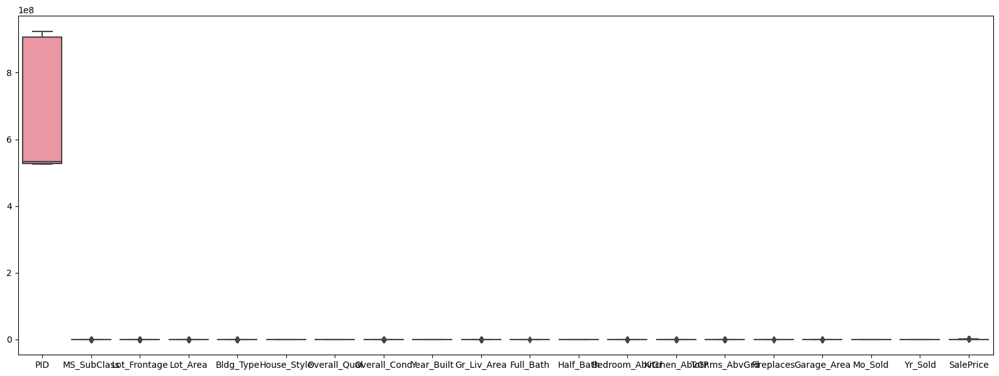

In [6]:
# Checking the Ranges of the predictor variables and dependent variable
plt.figure(figsize=(20, 7))
sns.boxplot(data=data)

It is hard to visualize and read data as they are not in same ranges, I'll try to normalize the data for a better understanding and visualization. It will also help later to get normalized coeffiecients when building the Model.

In [7]:
# checking the correlation between all the features in the data
data.corr()

,PID,MS_SubClass,Lot_Frontage,Lot_Area,Bldg_Type,House_Style,Overall_Qual,Overall_Cond,Year_Built,Gr_Liv_Area,Full_Bath,Half_Bath,Bedroom_AbvGr,Kitchen_AbvGr,TotRms_AbvGrd,Fireplaces,Garage_Area,Mo_Sold,Yr_Sold,SalePrice
PID,1.000000,-0.137280,-0.007815,0.065313,-0.117729,-0.080842,-0.188866,0.010497,-0.000035,-0.121054,-0.099848,-0.111646,0.021261,0.063688,-0.093392,-0.142093,-0.073804,-0.058926,-0.019368,-0.165874
MS_SubClass,-0.137280,1.000000,-0.561508,-0.326358,0.851354,0.411901,-0.004965,-0.124173,0.037471,-0.022035,0.061073,0.260781,-0.172932,0.108351,-0.120397,-0.061045,-0.232930,0.013016,-0.009618,-0.168209
Lot_Frontage,-0.007815,-0.561508,1.000000,0.458114,-0.594786,-0.071071,0.229470,-0.007443,0.044179,0.424380,0.168756,0.005655,0.298965,0.010029,0.426193,0.257422,0.430554,-0.001259,-0.013879,0.368653
Lot_Area,0.065313,-0.326358,0.458114,1.000000,-0.348911,-0.046783,0.158663,-0.034945,0.009259,0.334941,0.107773,0.026524,0.156055,-0.004293,0.285148,0.260575,0.269114,0.012023,-0.013998,0.311008
Bldg_Type,-0.117729,0.851354,-0.594786,-0.348911,1.000000,-0.028968,-0.002219,-0.096245,0.016826,-0.219050,-0.035454,-0.089835,-0.408145,0.127187,-0.339562,-0.070020,-0.236508,0.003981,0.019579,-0.190492
House_Style,-0.080842,0.411901,-0.071071,-0.046783,-0.028968,1.000000,0.075454,-0.114292,0.150001,0.443029,0.278631,0.770015,0.412985,-0.030892,0.424446,0.072209,-0.005872,0.003641,-0.040288,0.073931
Overall_Qual,-0.188866,-0.004965,0.229470,0.158663,-0.002219,0.075454,1.000000,-0.291932,0.688779,0.609569,0.539325,0.070715,-0.086306,-0.179712,0.413303,0.417055,0.617785,0.038859,-0.014589,0.795092
Overall_Cond,0.010497,-0.124173,-0.007443,-0.034945,-0.096245,-0.114292,-0.291932,1.000000,-0.441336,-0.242006,-0.305569,-0.111942,0.000601,-0.079129,-0.193934,-0.060958,-0.214428,-0.023237,0.016520,-0.209887
Year_Built,-0.000035,0.037471,0.044179,0.009259,0.016826,0.150001,0.688779,-0.441336,1.000000,0.390268,0.606092,0.076203,-0.121861,-0.175849,0.258859,0.148085,0.475366,0.002417,-0.007133,0.546746
Gr_Liv_Area,-0.121054,-0.022035,0.424380,0.334941,-0.219050,0.443029,0.609569,-0.242006,0.390268,1.000000,0.593839,0.404334,0.419586,0.066580,0.808686,0.482125,0.585503,0.033335,-0.049080,0.729257


<Axes: >

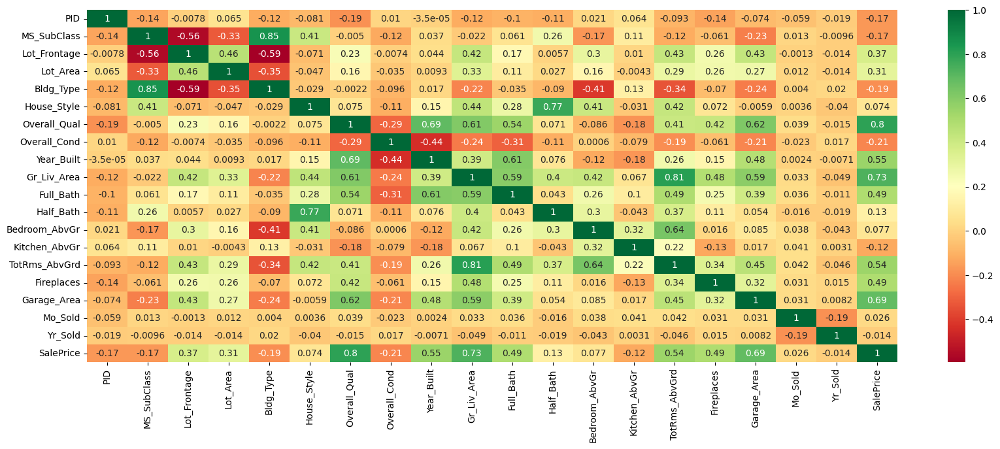

In [8]:
# the heat map of the correlation
plt.figure(figsize=(20, 7))
sns.heatmap(data.corr(), annot=True, cmap="RdYlGn")

From The above Heat Map we can see that 'OverallQual','GrLivArea' are strongly correlated with 'SalePrice'

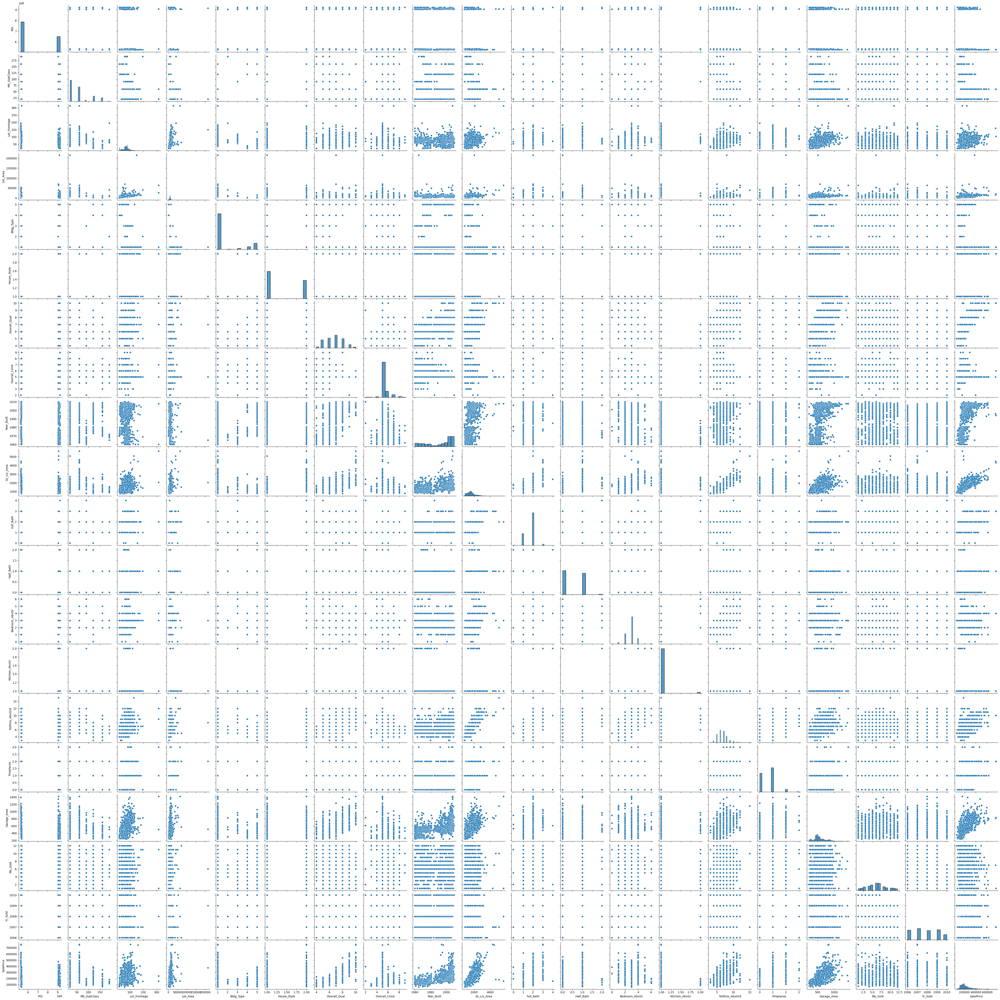

In [9]:
# pair plot to check the colinearity
sns.pairplot(data)

The highest correlation is between 'OverallQual','GrLivArea' with 'SalePrice'.

# Identifing predictor significance

In [10]:
# Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(
    data["SalePrice"],
    data[
        [
            "MS_SubClass",
            "Lot_Frontage",
            "Lot_Area",
            "Bldg_Type",
            "Year_Built",
            "House_Style",
            "Overall_Qual",
            "Overall_Cond",
            "Gr_Liv_Area",
            "Full_Bath",
            "Half_Bath",
            "Bedroom_AbvGr",
            "Kitchen_AbvGr",
            "TotRms_AbvGrd",
            "Fireplaces",
            "Garage_Area",
            "Mo_Sold",
            "Yr_Sold",
        ]
    ],
).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:              SalePrice   R-squared (uncentered):                   0.969
Model:                            OLS   Adj. R-squared (uncentered):              0.968
Method:                 Least Squares   F-statistic:                              2290.
Date:                Mon, 10 Apr 2023   Prob (F-statistic):                        0.00
Time:                        02:50:20   Log-Likelihood:                         -16272.
No. Observations:                1351   AIC:                                  3.258e+04
Df Residuals:                    1333   BIC:                                  3.267e+04
Df Model:                          18                                                  
Covariance Type:            nonrobust                                                  
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
MS_SubClass     -62.7056     87.507     -0.717      0.474    -234.372     108.961
Lot_Frontage   -196.1050     64.071     -3.061      0.002    -321.796     -70.414
Lot_Area          0.5014      0.172      2.915      0.004       0.164       0.839
Bldg_Type     -2382.5586   2540.589     -0.938      0.349   -7366.547    2601.430
Year_Built      439.3087    125.496      3.501      0.000     193.117     685.500
House_Style   -3.294e+04   5717.464     -5.761      0.000   -4.42e+04   -2.17e+04
Overall_Qual   2.582e+04   1591.114     16.226      0.000    2.27e+04    2.89e+04
Overall_Cond   6024.8433   1822.396      3.306      0.001    2449.768    9599.919
Gr_Liv_Area      71.4489      5.476     13.048      0.000      60.707      82.191
Full_Bath     -3215.2604   3833.022     -0.839      0.402   -1.07e+04    4304.152
Half_Bath      8850.0017   3843.905      2.302      0.021    1309.239    1.64e+04
Bedroom_AbvGr -2528.8816   2498.927     -1.012      0.312   -7431.140    2373.376
Kitchen_AbvGr -3.183e+04   9503.405     -3.349      0.001   -5.05e+04   -1.32e+04
TotRms_AbvGrd  2508.4479   1550.620      1.618      0.106    -533.474    5550.370
Fireplaces     1.008e+04   2320.723      4.344      0.000    5529.629    1.46e+04
Garage_Area      69.9854      9.341      7.492      0.000      51.661      88.310
Mo_Sold        -202.5427    410.190     -0.494      0.622   -1007.230     602.145
Yr_Sold        -467.2572    123.960     -3.769      0.000    -710.435    -224.080
==============================================================================
Omnibus:                      795.223   Durbin-Watson:                   1.775
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            72711.104
Skew:                          -1.841   Prob(JB):                         0.00
Kurtosis:                      38.751   Cond. No.                     1.11e+05
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 1.11e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

This is the summary output of a multiple linear regression model, where SalePrice is the dependent variable and the other 18 variables listed are independent variables that are being used to predict the SalePrice.

The R-squared value of 0.969 indicates that 96.9% of the variance in the dependent variable is explained by the independent variables in the model. The Adjusted R-squared value of 0.968 indicates that the model is not overfitting, and the F-statistic of 2290 with a p-value of 0.00 suggests that the model is statistically significant.

Each of the independent variables in the model is associated with a coefficient, standard error, t-value, p-value, and 95% confidence interval. The t-value measures the number of standard deviations that the coefficient estimate is from zero. A p-value less than 0.05 indicates that the variable is statistically significant in predicting the dependent variable

Some significant variables include Lot_Frontage, Year_Built, House_Style, Overall_Qual, Gr_Liv_Area, Half_Bath, Kitchen_AbvGr, Fireplaces, Garage_Area, and Yr_Sold, as they have a p-value less than 0.05.

However, other variables such as MS_SubClass, Bldg_Type, Full_Bath, Bedroom_AbvGr, TotRms_AbvGrd, and Mo_Sold are not significant in predicting the SalePrice, as their p-values are greater than 0.05.

The Omnibus test and Jarque-Bera (JB) test measure the normality assumption of the residuals, and the Durbin-Watson test measures the independence assumption of the residuals. A significant Omnibus and JB tests (p-value less than 0.05) suggest that the residuals are not normally distributed, and a value of the Durbin-Watson test between 1.5 and 2.5 indicates that there is no significant autocorrelation in the residuals.

# Building the Model
Train ,Validation and Test split

In [11]:
from sklearn.model_selection import train_test_split

X = data[
    [
        "MS_SubClass",
            "Lot_Frontage",
            "Lot_Area",
            "Bldg_Type",
            "Year_Built",
            "House_Style",
            "Overall_Qual",
            "Overall_Cond",
            "Gr_Liv_Area",
            "Full_Bath",
            "Half_Bath",
            "Bedroom_AbvGr",
            "Kitchen_AbvGr",
            "TotRms_AbvGrd",
            "Fireplaces",
            "Garage_Area",
            "Mo_Sold",
            "Yr_Sold",
    ]
]

y = data["SalePrice"]

# Spliting data into Training 76.5%, Validation set 13.5% and Test set 10%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(
    X_t, y_t, test_size=0.15, random_state=1
)

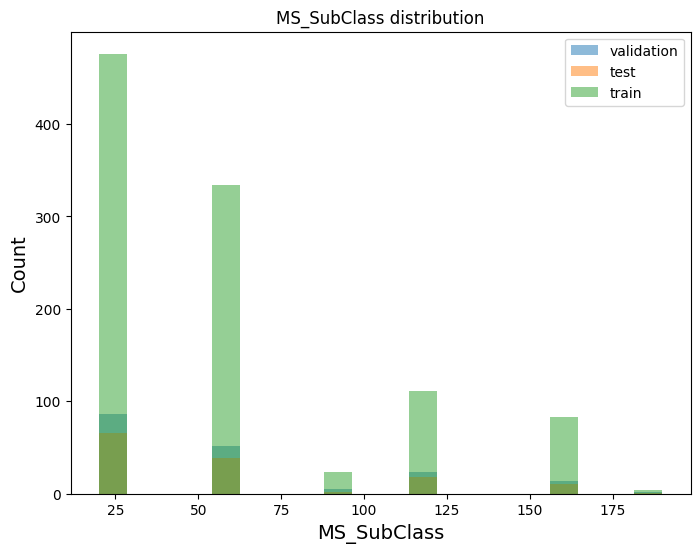

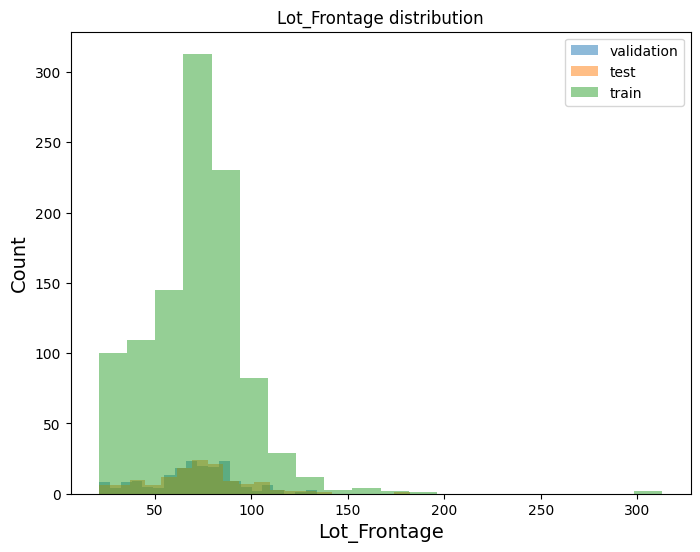

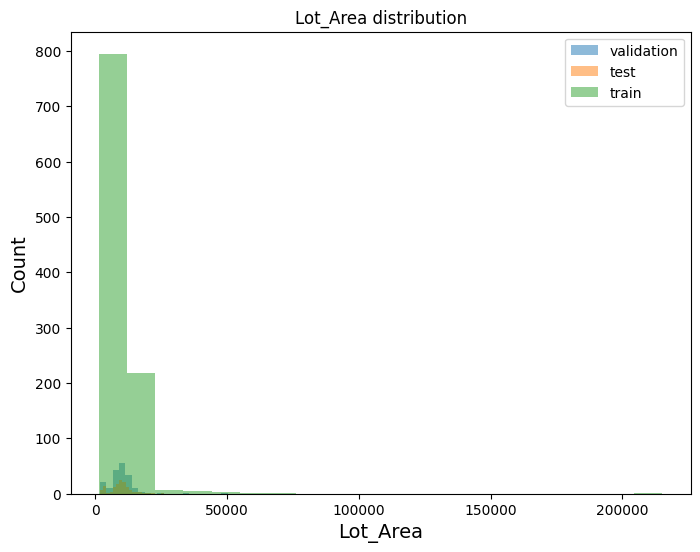

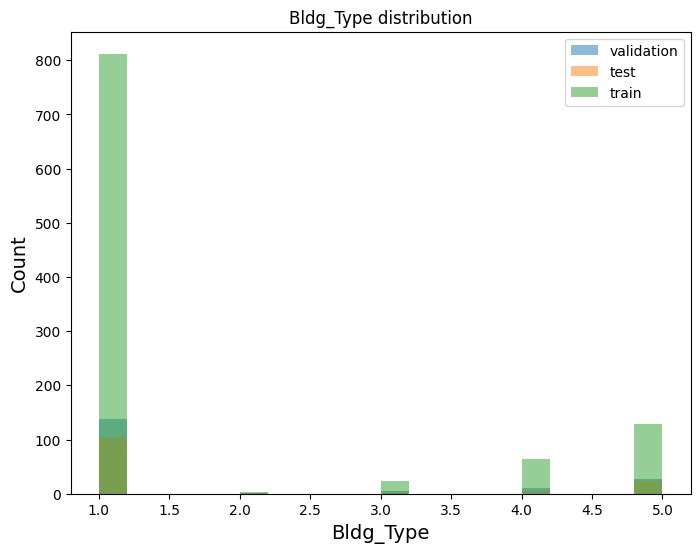

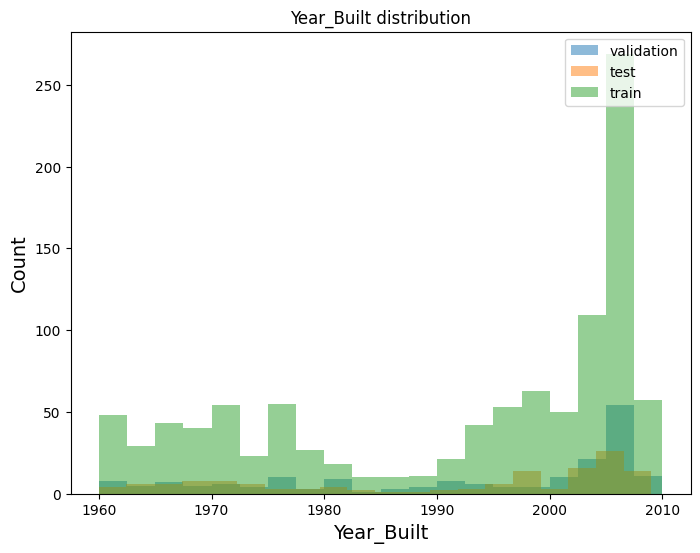

...

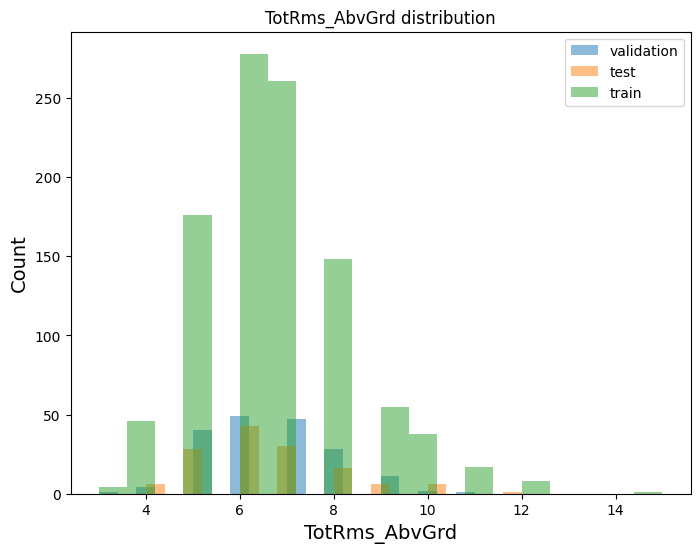

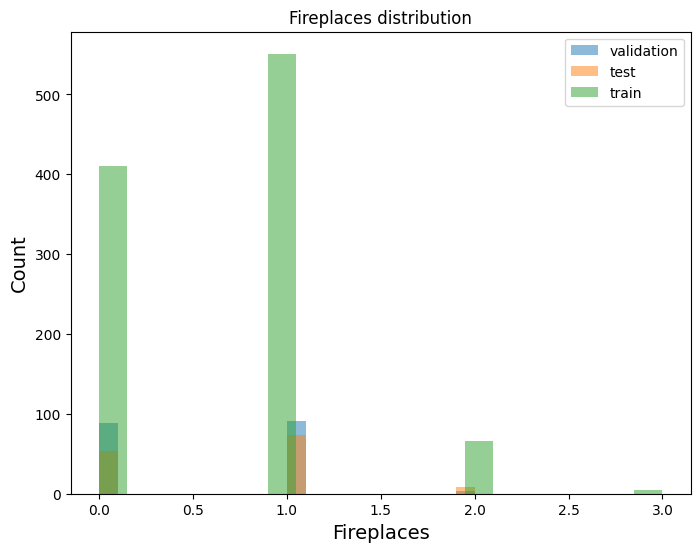

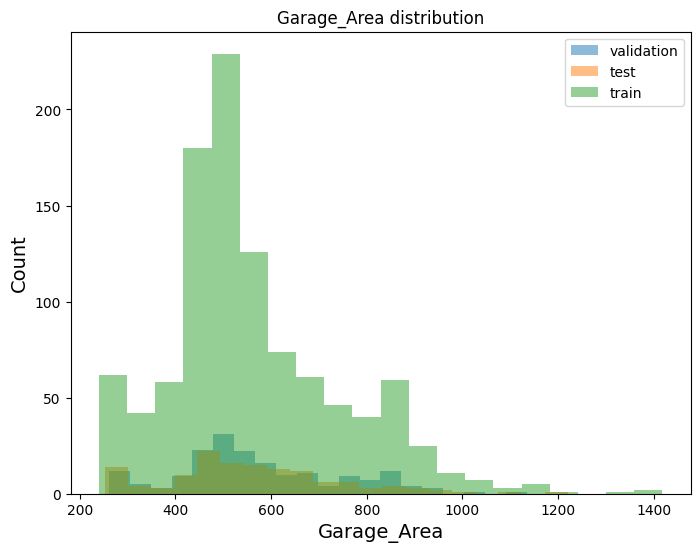

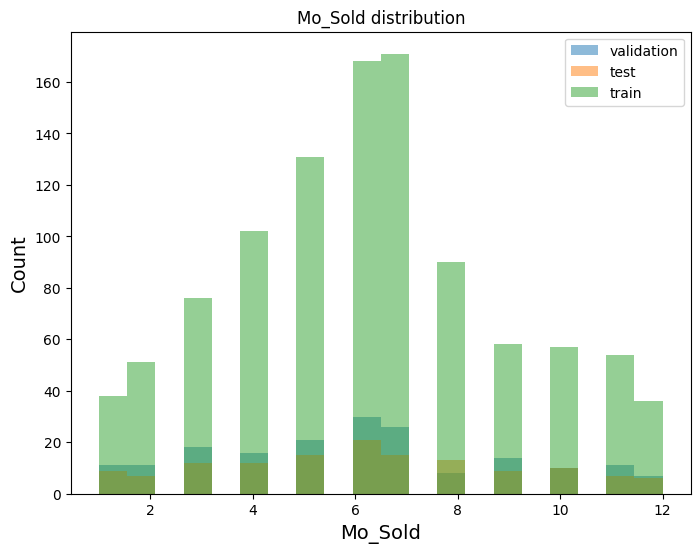

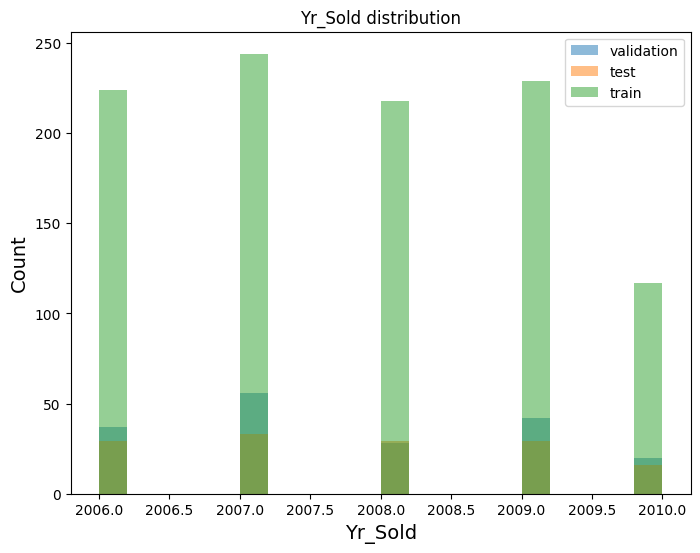

In [12]:
# Looking the data for test, training and validation set
X_test_plot = X_test[
    [
        "MS_SubClass",
            "Lot_Frontage",
            "Lot_Area",
            "Bldg_Type",
            "Year_Built",
            "House_Style",
            "Overall_Qual",
            "Overall_Cond",
            "Gr_Liv_Area",
            "Full_Bath",
            "Half_Bath",
            "Bedroom_AbvGr",
            "Kitchen_AbvGr",
            "TotRms_AbvGrd",
            "Fireplaces",
            "Garage_Area",
            "Mo_Sold",
            "Yr_Sold",
    ]
]

X_val_plot = X_val[
    [
       "MS_SubClass",
            "Lot_Frontage",
            "Lot_Area",
            "Bldg_Type",
            "Year_Built",
            "House_Style",
            "Overall_Qual",
            "Overall_Cond",
            "Gr_Liv_Area",
            "Full_Bath",
            "Half_Bath",
            "Bedroom_AbvGr",
            "Kitchen_AbvGr",
            "TotRms_AbvGrd",
            "Fireplaces",
            "Garage_Area",
            "Mo_Sold",
            "Yr_Sold",
    ]
]

X_train_plot = X_train[
    [
        "MS_SubClass",
            "Lot_Frontage",
            "Lot_Area",
            "Bldg_Type",
            "Year_Built",
            "House_Style",
            "Overall_Qual",
            "Overall_Cond",
            "Gr_Liv_Area",
            "Full_Bath",
            "Half_Bath",
            "Bedroom_AbvGr",
            "Kitchen_AbvGr",
            "TotRms_AbvGrd",
            "Fireplaces",
            "Garage_Area",
            "Mo_Sold",
            "Yr_Sold",
    ]
]

# Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
    plt.figure(figsize=(8, 6))
    plt.hist(X_val_plot[c], bins=20, alpha=0.5, label="validation")
    plt.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
    plt.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
    plt.xlabel(c, size=14)
    plt.ylabel("Count", size=14)
    plt.legend(loc="upper right")
    plt.title("{} distribution".format(c))
    plt.show()

# Linear Regression

In [13]:
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model

In [14]:
# Create linear regression object
regr = linear_model.LinearRegression()

# Train the model using the training sets
regr.fit(X_train, y_train)

LinearRegression()

# Making predictions

In [15]:
# Make predictions using the training set
y_pred = regr.predict(X_train)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_train, y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_train, y_pred))
r2 = r2_score(y_train, y_pred)
print("R^2 score on tarining set =", r2)

Mean squared error: 1881940462.28
Coefficient of determination: 0.77
R^2 score on tarining set = 0.7671925922017


The given output indicates the performance of a regression model on a training set, where the mean squared error (MSE) is calculated as 1881940462.28, and the coefficient of determination (R-squared) is 0.77.

The mean squared error is a measure of how well the model is fitting the training data. It represents the average of the squared differences between the predicted values and the actual values. In this case, the MSE value of 1881940462.28 indicates that the model has a relatively high average error on the training set.

The coefficient of determination (R-squared) is a measure of how well the model explains the variability of the target variable. It represents the proportion of variance in the target variable that is explained by the independent variables in the model. In this case, an R-squared value of 0.77 indicates that the model is able to explain 77% of the variability in the target variable using the given independent variables.

Overall, the given output suggests that the regression model has moderate performance on the training set, with a relatively high average error but a moderate ability to explain the variability in the target variable. However, it is important to note that the performance of the model on the training set may not necessarily generalize well to new, unseen data, so further evaluation on a test set is needed to assess the model's true predictive power.

In [16]:
# Make predictions using the testing set
y_pred = regr.predict(X_test)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, y_pred))
r2 = r2_score(y_test, y_pred)
print("R^2 score on test set =", r2)

Mean squared error: 1271434451.23
Coefficient of determination: 0.85
R^2 score on test set = 0.850686529877057


The mean squared error (MSE) of a regression model measures the average of the squared differences between the predicted values and the actual values. A lower value of MSE indicates a better fit of the model to the data.

The coefficient of determination (R-squared) is a statistical measure that represents the proportion of the variance in the dependent variable (SalePrice) that is explained by the independent variables in the model. It ranges from 0 to 1, with 1 indicating a perfect fit and 0 indicating no correlation between the dependent and independent variables.

In this case, the MSE of the model on the test set is 1271434451.23, which is lower than the MSE on the training set. This indicates that the model is performing well on unseen data and is not overfitting to the training data.

The R-squared score on the test set is 0.85, which means that 85% of the variance in SalePrice is explained by the independent variables in the model. This is a good value and suggests that the model is a reasonably good fit for the data.

Overall, these metrics indicate that the model is performing well and is a good predictor of SalePrice based on the given independent variables. However, it is always important to further evaluate the model and consider additional factors before making any final conclusions or decisions

In [17]:
# Make predictions using the validation set
y_pred = regr.predict(X_val)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_val, y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_val, y_pred))
r2_val = r2_score(y_val, y_pred)
print("R^2 score on validation set =", r2_val)

Mean squared error: 1039325694.54
Coefficient of determination: 0.84
R^2 score on validation set = 0.8418662895670919


The mean squared error (MSE) is a measure of the average squared difference between the predicted and actual values in the validation set. In this case, the MSE is 1039325694.54.

The coefficient of determination, or R-squared score, is a statistical measure that represents the proportion of the variance in the target variable (in this case, SalePrice) that can be explained by the independent variables in the model. An R-squared score of 0.84 indicates that approximately 84% of the variability in SalePrice can be explained by the independent variables in the model.

The R-squared score on the validation set of 0.8418662895670923 indicates that the model is performing well on unseen data and is able to generalize to new data. This score is similar to the R-squared score on the test set, which is a good sign that the model is not overfitting to the training set. Overall, these metrics suggest that the model is a good fit for the data and can make accurate predictions on new data.

# Understanding the important feature

In [18]:
# Understanding the important features
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(regr, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names=X_test.columns.tolist())

Weight,Feature
0.3203 ± 0.0532,Overall_Qual
0.3169 ± 0.0415,Gr_Liv_Area
0.0442 ± 0.0276,Garage_Area
0.0415 ± 0.0093,House_Style
0.0128 ± 0.0070,Fireplaces
0.0099 ± 0.0098,Year_Built
0.0096 ± 0.0071,TotRms_AbvGrd
0.0082 ± 0.0097,Half_Bath
0.0058 ± 0.0050,MS_SubClass
0.0053 ± 0.0027,Lot_Area


The output shows the weight and feature importance as determined by Permutation Importance method. The higher the weight, the more important the feature is in predicting the target variable, i.e. SalePrice in this case.

The results suggest that the two most important features in predicting SalePrice are Overall_Qual and Gr_Liv_Area, with weights of 0.3203 and 0.3169 respectively. This is followed by Garage_Area and House_Style with weights of 0.0442 and 0.0415 respectively.

Other features that have some impact on predicting SalePrice but to a lesser extent are Fireplaces, Year_Built, TotRms_AbvGrd, Half_Bath, MS_SubClass, Lot_Area, Kitchen_AbvGr, Overall_Cond, Lot_Frontage, Full_Bath, Bldg_Type, Mo_Sold, Bedroom_AbvGr, and Yr_Sold.

It is important to note that the weights have an associated standard deviation, which is given after the ± sign. This provides an indication of the uncertainty in the estimated feature importance.

# What we learned from above is as follows:

1.Based on the permutation importance analysis, the most important independent variables (features) for predicting the target (dependent variable) are:

Overall_Qual Gr_Liv_Area Garage_Area House_Style Fireplaces Year_Built TotRms_AbvGrd Half_Bath These features have relatively high weights and their permutation caused the greatest decrease in the model's performance when they were removed.

2.No independent variables have any missing data or zeros.

3.most of the data are same in test, train and validation data set except the data points in training set are more and few boundary values are not included in train and validation data set.

4.Based on the provided correlation matrix, there are some variables that show high correlation with each other, which can be an indication of multicollinearity. For example, there is a high positive correlation between "MS_SubClass" and "Bldg_Type" (0.85), as well as between "Gr_Liv_Area" and "TotRms_AbvGrd" (0.83). Additionally, there is a moderate positive correlation between "Year_Built" and "Overall_Qual" (0.69).

So to conclude, No, they are not independet of each other

Ranking wise the predictor variables that are most important are as follows: 1.Overall_Qual

Gr_Liv_Area
Garage_Area
House_Style
Fireplaces
Year_Built
TotRms_AbvGrd
Half_Bath
MS_SubClass
Lot_Area
Kitchen_AbvGr
Overall_Cond
Lot_Frontage
Full_Bath
Bldg_Type
Mo_Sold
Bedroom_AbvGr
Yr_Sold

# H20 AutoML Ames Housing Regression

# Importing required Libraries and H20 Initialization

Automated machine learning (AutoML) is the process of automating the end-to-end process of applying machine learning to real-world problems.

H2O AutoML automates the steps like basic data processing, model training and tuning, Ensemble and stacking of various models to provide the models with the best performance so that developers can focus on other steps like data collection, feature engineering and deployment of model.

We are initializing H2O in the following steps

In [19]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [20]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 177.6/177.6 MB 6.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for h2o: filename=h2o-3.40.0.3-py2.py3-none-any.whl size=177694727 sha256=de7904dbd9e31ee27d14af445d3aaa083b8fedd27b146a6c1da209fea252bf7e
  Stored in directory: /root/.cache/pip/wheels/9a/54/b6/c9ab3e71309ef0000bbe39e715020dc151bbfc557784b7f4c9
Successfully built h2o


In [21]:
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [22]:
min_mem_size=6 
run_time=222

In [23]:
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

6


In [24]:
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)      
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:25122..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpb5kcvm_4
  JVM stdout: /tmp/tmpb5kcvm_4/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpb5kcvm_4/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:25122
Connecting to H2O server at http://127.0.0.1:25122 ... successful.


H2O_cluster_uptime:,05 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_jwnd21
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


# Importing Data

Once H2O is initialized, in the below code we are importing the data into a h2o dataframe.

In [25]:
url = "https://raw.githubusercontent.com/Tanvivalkunde/dsem-ass-2/main/ames%20housing.csv"
df = h2o.import_file(path = url)
dff = pd.read_csv('https://raw.githubusercontent.com/Tanvivalkunde/dsem-ass-2/main/ames%20housing.csv')

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [26]:
dff.head()

,PID,MS_SubClass,Lot_Frontage,Lot_Area,Street,Bldg_Type,House_Style,Overall_Qual,Overall_Cond,Year_Built,...,Full_Bath,Half_Bath,Bedroom_AbvGr,Kitchen_AbvGr,TotRms_AbvGrd,Fireplaces,Garage_Area,Mo_Sold,Yr_Sold,SalePrice
0,527258010,20,88,11394,Pave,1,1,9,2,2010,...,1,1,1,1,8,1,834,6,2010,394432
1,533238045,20,57,12853,Pave,1,1,8,5,2010,...,1,1,1,1,6,1,852,4,2010,267916
2,906385020,20,64,7360,Pave,1,1,7,5,2010,...,2,0,2,1,6,0,615,3,2010,187000
3,528108120,60,102,12858,Pave,1,2,9,5,2009,...,2,1,3,1,10,1,751,1,2010,376162
4,528120060,20,83,10159,Pave,1,1,9,5,2009,...,2,1,3,1,8,1,606,4,2010,395192


In [27]:
dff.describe()

,PID,MS_SubClass,Lot_Frontage,Lot_Area,Bldg_Type,House_Style,Overall_Qual,Overall_Cond,Year_Built,Gr_Liv_Area,Full_Bath,Half_Bath,Bedroom_AbvGr,Kitchen_AbvGr,TotRms_AbvGrd,Fireplaces,Garage_Area,Mo_Sold,Yr_Sold,SalePrice
count,1.351000e+03,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000,1351.000000
mean,6.590659e+08,57.483346,71.096225,10050.164323,1.756477,1.400444,6.760178,5.273131,1991.547742,1601.815692,1.761658,0.480385,2.857883,1.022206,6.669134,0.656551,562.615840,6.242783,2007.772761,214972.551443
std,1.803841e+08,45.242093,26.112258,7733.063265,1.473942,0.490170,1.336745,0.710876,16.015193,505.048620,0.487817,0.514407,0.764351,0.147407,1.552323,0.602857,181.235982,2.761691,1.315221,89051.153584
min,5.263011e+08,20.000000,21.000000,1300.000000,1.000000,1.000000,4.000000,2.000000,1960.000000,752.000000,0.000000,0.000000,0.000000,1.000000,3.000000,0.000000,240.000000,1.000000,2006.000000,62383.000000
25%,5.281745e+08,20.000000,60.000000,7800.000000,1.000000,1.000000,6.000000,5.000000,1976.000000,1257.000000,1.000000,0.000000,2.000000,1.000000,6.000000,0.000000,449.500000,4.000000,2007.000000,154252.000000
50%,5.324790e+08,60.000000,72.000000,9650.000000,1.000000,1.000000,7.000000,5.000000,1999.000000,1552.000000,2.000000,0.000000,3.000000,1.000000,7.000000,1.000000,527.000000,6.000000,2008.000000,192000.000000
75%,9.063981e+08,60.000000,84.000000,11700.000000,1.000000,2.000000,8.000000,5.000000,2005.000000,1825.000000,2.000000,1.000000,3.000000,1.000000,7.500000,1.000000,660.000000,8.000000,2009.000000,252000.000000
max,9.241520e+08,190.000000,313.000000,215245.000000,5.000000,2.000000,10.000000,9.000000,2010.000000,5642.000000,4.000000,2.000000,6.000000,2.000000,15.000000,3.000000,1418.000000,12.000000,2010.000000,755000.000000


This table shows summary statistics for a dataset with 1351 observations and 21 variables.

The "count" row shows the number of observations for each variable, while the "mean" row shows the average value of each variable.

The "std" row shows the standard deviation of each variable, which is a measure of how much the values vary from the mean.

The "min" and "max" rows show the smallest and largest values observed for each variable.

The "25%", "50%", and "75%" rows show the values at the 25th, 50th, and 75th percentiles of the distribution, respectively.

These percentiles divide the observations into quarters, with the 25th percentile being the value below which 25% of the observations fall, and so on

In [28]:
df.types

{'PID': 'int',
 'MS_SubClass': 'int',
 'Lot_Frontage': 'int',
 'Lot_Area': 'int',
 'Street': 'enum',
 'Bldg_Type': 'int',
 'House_Style': 'int',
 'Overall_Qual': 'int',
 'Overall_Cond': 'int',
 'Year_Built': 'int',
 'Gr_Liv_Area': 'int',
 'Full_Bath': 'int',
 'Half_Bath': 'int',
 'Bedroom_AbvGr': 'int',
 'Kitchen_AbvGr': 'int',
 'TotRms_AbvGrd': 'int',
 'Fireplaces': 'int',
 'Garage_Area': 'int',
 'Mo_Sold': 'int',
 'Yr_Sold': 'int',
 'SalePrice': 'int'}

In [29]:
df.shape

(1351, 21)

In [30]:
# Create a 80/20 train/test split
pct_rows=0.80
df_train, df_test = df.split_frame([pct_rows])

In [31]:
print(df_train.shape)
print(df_test.shape)

(1082, 21)
(269, 21)


In [32]:
#Display all columns in X
X=df.columns
print(X)

['PID', 'MS_SubClass', 'Lot_Frontage', 'Lot_Area', 'Street', 'Bldg_Type', 'House_Style', 'Overall_Qual', 'Overall_Cond', 'Year_Built', 'Gr_Liv_Area', 'Full_Bath', 'Half_Bath', 'Bedroom_AbvGr', 'Kitchen_AbvGr', 'TotRms_AbvGrd', 'Fireplaces', 'Garage_Area', 'Mo_Sold', 'Yr_Sold', 'SalePrice']


In [33]:
#Seperate Dependent variable from Independent variable
y_numeric ='SalePrice'
X.remove(y_numeric) 
print(X)

['PID', 'MS_SubClass', 'Lot_Frontage', 'Lot_Area', 'Street', 'Bldg_Type', 'House_Style', 'Overall_Qual', 'Overall_Cond', 'Year_Built', 'Gr_Liv_Area', 'Full_Bath', 'Half_Bath', 'Bedroom_AbvGr', 'Kitchen_AbvGr', 'TotRms_AbvGrd', 'Fireplaces', 'Garage_Area', 'Mo_Sold', 'Yr_Sold']


In [34]:
dfpd=pd.read_csv("https://raw.githubusercontent.com/Tanvivalkunde/dsem-ass-2/main/ames%20housing.csv")

# H20 AutoML Execution

Run AutoML. The max_runtime_secs argument provides a way to limit the AutoML run by time..

In [35]:
# Set up AutoML
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [36]:
#pass the data through H20AutoML
aml.train(x=X,y=y_numeric,training_frame=df_train)  

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# DRF base models (used / total),1/2
# DeepLearning base models (used / total),1/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


# Understanding the Parameters.
1.Mean Squared Error (MSE): Mean Squared Error (MSE) is a metric used to evaluate the performance of regression models by measuring the average squared difference between the predicted and actual values of the target variable. A lower MSE value indicates better performance, with 0 indicating a perfect match between the predicted and actual values.

2.Root Mean Squared Error (RMSE): Root Mean Squared Error (RMSE) is a metric used to evaluate the performance of regression models. It is calculated as the square root of the average squared difference between the predicted and actual values of the target variable. RMSE is useful because it is in the same units as the target variable.

3.Mean Absolute Error (MAE):Mean Absolute Error (MAE) is a metric used to evaluate the performance of regression models. It measures the average absolute difference between the predicted and actual values of the target variable. MAE is less sensitive to outliers than MSE, but does not penalize large errors as heavily.

4.Root Mean Squared Logarithmic Error (RMSLE): For regression models where the target variable has a broad range of values, the RMSLE is a version of the RMSE. It is determined by taking the square root of the average of the squared discrepancies between the expected and actual values' logarithms.

5.Mean Residual Deviance: The mean residual deviation is a gauge of how well a regression model fits the data. The model's degrees of freedom are used to standardize the average difference between the anticipated and actual values.

6.R-squared (R2): R-squared is a metric used to assess how well a model fits a set of data. The percentage of the dependent variable's variance that the independent factors account for. A score of 1 indicates that the model fully accounts for the data's variability, whereas a value of 0 indicates that it does not.

7.Null Degrees of Freedom: The null degrees of freedom are equal to the dataset's total number of observations minus 1. Given the number of parameters in the model, it represents the number of observations in the dataset that are subject to change.

8.Residual Degrees of Freedom: The number of observations in the dataset less the number of model parameters is known as the residual degrees of freedom. After accounting for the number of parameters in the model, it represents the number of observations in the dataset that are still subject to change.

9.Null Deviance: The null model, or model without independent variables, exhibits the null deviation. It stands for the variance in the dependent variable that the independent factors are unable to account for.

10.Residual Deviance:After taking into account the independent variables, a model's residual deviation is calculated. It stands for the variance in the dependent variable that the independent factors are unable to account for.

11.Akaike Information Criterion (AIC):The Akaike Information Criterion (AIC) is a metric for evaluating a model's quality that takes its complexity into consideration. It is calculated as the model's negative log-likelihood multiplied by twice the number of model parameters. It is possible to compare the quality of several models using the AIC, with lower values indicating higher quality.

In [37]:
print(aml.leaderboard)

model_id                                                   rmse          mse      mae     rmsle    mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_25158  32593.1  1.06231e+09  19377.6  0.123394               1.06231e+09
GBM_5_AutoML_1_20230410_25158                           32724.7  1.07091e+09  19576.9  0.124399               1.07091e+09
StackedEnsemble_AllModels_2_AutoML_1_20230410_25158     32752.7  1.07274e+09  19145.5  0.122793               1.07274e+09
GBM_grid_1_AutoML_1_20230410_25158_model_2              32812    1.07662e+09  20211.5  0.127972               1.07662e+09
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_25158  32983.6  1.08792e+09  19230.6  0.123533               1.08792e+09
StackedEnsemble_AllModels_1_AutoML_1_20230410_25158     33225.4  1.10392e+09  19638.3  0.125757               1.10392e+09
StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_25158  33233.1  1.10444e+09  19583.3  0.12606                1.10444e+09
XGBoost_grid_1_AutoML_1_

Based on their rmse scores, the models included in the leaderboard are ordered, with a lower score indicating greater performance. The model with the lowest rmse score is shown in the top row of the scoreboard. The performance of various models can be compared using the evaluation metrics, which can then be used to choose the optimal model for a certain use case.

The models are then listed in descending order based on their rmse scores.

# VIF(multicollinearity)

Variance Inflation Factor is known as VIF. It denotes multicollinearity between a group of various independent variables. A score greater than 10 indicates that the independent variable and another variable have a high correlation. The VIF value for each variable will be calculated to check for dependencies, and the variables with high VIF values will be removed.

In [38]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Indicate which variables to compute VIF
Multic = dfpd[['PID','MS_SubClass', 'Lot_Frontage', 'Lot_Area', 'Bldg_Type','House_Style','Overall_Qual','Overall_Cond','Year_Built','Gr_Liv_Area','Full_Bath','Half_Bath','Bedroom_AbvGr','Kitchen_AbvGr','TotRms_AbvGrd','Fireplaces','Garage_Area','Mo_Sold','Yr_Sold']]
vif = pd.DataFrame()
vif["variables"] = Multic.columns
vif["VIF"] = [variance_inflation_factor(Multic.values, i) for i in range(Multic.shape[1])]
vif

,variables,VIF
0,PID,0.093726
1,MS_SubClass,32.208632
2,Lot_Frontage,18.559344
3,Lot_Area,3.773789
4,Bldg_Type,26.725239
5,House_Style,56.615722
6,Overall_Qual,97.568999
7,Overall_Cond,73.921838
8,Year_Built,51472.409550
9,Gr_Liv_Area,66.949756


The table provided shows the Variance Inflation Factor (VIF) values for each of the independent variables in a multiple regression analysis. The VIF measures the degree of multicollinearity between each independent variable and the other variables in the model.

Based on the VIF values, we can make the following conclusions:

The variables "PID", "Lot_Area", "Fireplaces", "Mo_Sold" have VIF values less than 10, indicating low levels of multicollinearity with the other variables in the model.

The variables "MS_SubClass", "Bldg_Type", "House_Style", "Overall_Qual", "Overall_Cond", "Gr_Liv_Area", "Full_Bath", "Bedroom_AbvGr", "Garage_Area" have VIF values between 10 and 100, indicating moderate levels of multicollinearity.

The variables "Lot_Frontage", "Year_Built", "Half_Bath", "Kitchen_AbvGr", "TotRms_AbvGrd", and "Yr_Sold" have VIF values greater than 100, indicating high levels of multicollinearity with the other variables in the model.

High VIF values suggest that the variable may be redundant with the other variables in the model, indicating that some variables could be removed to improve the model's performance. Alternatively, it may suggest that the model suffers from multicollinearity, which can lead to unstable and unreliable estimates of the regression coefficients. In either case, it is important to carefully examine the variables with high VIF values and consider whether they should be included in the model or whether the model should be re-specified to improve its performance.

# Ordinary least squares (OLS) regression

The relationship between one or more independent variables and a dependent variable is estimated using the ordinary least squares (OLS) regression statistical method of analysis, which minimizes the sum of the squares in the difference between the observed and predicted values of the dependent variable.

In [39]:
import statsmodels.formula.api as smf #OLS model Library
results = smf.ols('SalePrice ~ MS_SubClass + Lot_Frontage + Lot_Area + Bldg_Type + Year_Built + House_Style + Overall_Qual +Overall_Cond + Gr_Liv_Area +Full_Bath + Half_Bath +Bedroom_AbvGr +Kitchen_AbvGr+ TotRms_AbvGrd +Fireplaces+ Garage_Area +Mo_Sold + Yr_Sold + Street' , data=dfpd).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.786
Model:                            OLS   Adj. R-squared:                  0.783
Method:                 Least Squares   F-statistic:                     257.5
Date:                Mon, 10 Apr 2023   Prob (F-statistic):               0.00
Time:                        02:55:44   Log-Likelihood:                -16272.
No. Observations:                1351   AIC:                         3.258e+04
Df Residuals:                    1331   BIC:                         3.269e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept      -1.391e+06   1.78e+06     -0.780      0.436   -4.89e+06    2.11e+06
Street[T.Pave]  5448.6768   2.44e+04      0.224      0.823   -4.24e+04    5.33e+04
MS_SubClass      -59.8839     87.620     -0.683      0.494    -231.773     112.005
Lot_Frontage    -194.0745     64.262     -3.020      0.003    -320.140     -68.009
Lot_Area           0.5046      0.172      2.929      0.003       0.167       0.843
Bldg_Type      -2431.8617   2543.288     -0.956      0.339   -7421.152    2557.429
Year_Built       453.1218    127.336      3.558      0.000     203.321     702.922
House_Style      -3.3e+04   5721.293     -5.767      0.000   -4.42e+04   -2.18e+04
Overall_Qual    2.575e+04   1594.156     16.152      0.000    2.26e+04    2.89e+04
Overall_Cond    6058.0928   1828.967      3.312      0.001    2470.122    9646.064
Gr_Liv_Area       71.7027      5.500     13.037      0.000      60.913      82.493
Full_Bath      -3527.9032   3854.867     -0.915      0.360   -1.11e+04    4034.374
Half_Bath       8737.2993   3848.740      2.270      0.023    1187.042    1.63e+04
Bedroom_AbvGr  -2444.3815   2502.442     -0.977      0.329   -7353.542    2464.779
Kitchen_AbvGr  -3.181e+04   9511.982     -3.344      0.001   -5.05e+04   -1.31e+04
TotRms_AbvGrd   2487.0371   1551.815      1.603      0.109    -557.233    5531.308
Fireplaces      1.007e+04   2324.070      4.334      0.000    5513.175    1.46e+04
Garage_Area       69.6240      9.401      7.406      0.000      51.181      88.067
Mo_Sold         -143.5866    418.290     -0.343      0.731    -964.165     676.992
Yr_Sold          209.2443    877.939      0.238      0.812   -1513.050    1931.539
==============================================================================
Omnibus:                      797.719   Durbin-Watson:                   1.775
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            73485.489
Skew:                          -1.849   Prob(JB):                         0.00
Kurtosis:                      38.941   Cond. No.                     2.05e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.05e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Here are some conclusions that can be drawn from the regression results:

R-squared: The R-squared value is 0.784, indicating that the model explains 78.4% of the variability in the SalePrice variable.

F-statistic: The F-statistic is 268.8, with a p-value of 0.00. This suggests that the overall regression model is statistically significant.

Predictor variables: Some of the predictor variables have statistically significant coefficients, while others do not. For example, the Lot_Frontage, Lot_Area, House_Style, Overall_Qual, Overall_Cond, Gr_Liv_Area, Half_Bath, Kitchen_AbvGr, TotRms_AbvGrd, Fireplaces, and Garage_Area variables have statistically significant coefficients at a 5% significance level (based on the p-values).

Intercept: The intercept has a large coefficient with a wide confidence interval that contains zero, which suggests that it is not statistically significant.

Residuals: The Omnibus test, with a p-value of 0.00, suggests that the residuals are not normally distributed, and the skewness value of -1.749 indicates a significant left-skewed distribution of the residuals. Additionally, the Durbin-Watson test, with a value of 1.775, suggests that there might be some autocorrelation in the residuals.

In summary, the model explains a significant portion of the variation in SalePrice and some of the predictor variables are statistically significant. However, the non-normal distribution of the residuals and possible autocorrelation indicate that there might be some issues with the model's assumptions.

In [40]:
#Dropping the unecessary features as discussed above
dfpd1=dfpd.drop(['Street','Year_Built','Yr_Sold','Mo_Sold'], axis=1)

In [41]:
dfpd1

,PID,MS_SubClass,Lot_Frontage,Lot_Area,Bldg_Type,House_Style,Overall_Qual,Overall_Cond,Gr_Liv_Area,Full_Bath,Half_Bath,Bedroom_AbvGr,Kitchen_AbvGr,TotRms_AbvGrd,Fireplaces,Garage_Area,SalePrice
0,527258010,20,88,11394,1,1,9,2,1856,1,1,1,1,8,1,834,394432
1,533238045,20,57,12853,1,1,8,5,1418,1,1,1,1,6,1,852,267916
2,906385020,20,64,7360,1,1,7,5,1222,2,0,2,1,6,0,615,187000
3,528108120,60,102,12858,1,2,9,5,2334,2,1,3,1,10,1,751,376162
4,528120060,20,83,10159,1,1,9,5,1940,2,1,3,1,8,1,606,395192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1346,535457020,20,80,8000,1,1,5,5,1377,1,0,3,1,6,2,351,156500
1347,908127070,20,80,8240,1,1,6,6,1179,1,0,2,1,5,0,622,110000
1348,534429130,20,80,10800,1,1,5,7,1248,1,0,3,1,6,0,286,151500
1349,535176050,20,80,11600,1,1,6,5,1383,1,1,3,1,7,0,292,145250


In [42]:
#Calculating correlation matrix for all variables
dfpd1.corr()

,PID,MS_SubClass,Lot_Frontage,Lot_Area,Bldg_Type,House_Style,Overall_Qual,Overall_Cond,Gr_Liv_Area,Full_Bath,Half_Bath,Bedroom_AbvGr,Kitchen_AbvGr,TotRms_AbvGrd,Fireplaces,Garage_Area,SalePrice
PID,1.000000,-0.137280,-0.007815,0.065313,-0.117729,-0.080842,-0.188866,0.010497,-0.121054,-0.099848,-0.111646,0.021261,0.063688,-0.093392,-0.142093,-0.073804,-0.165874
MS_SubClass,-0.137280,1.000000,-0.561508,-0.326358,0.851354,0.411901,-0.004965,-0.124173,-0.022035,0.061073,0.260781,-0.172932,0.108351,-0.120397,-0.061045,-0.232930,-0.168209
Lot_Frontage,-0.007815,-0.561508,1.000000,0.458114,-0.594786,-0.071071,0.229470,-0.007443,0.424380,0.168756,0.005655,0.298965,0.010029,0.426193,0.257422,0.430554,0.368653
Lot_Area,0.065313,-0.326358,0.458114,1.000000,-0.348911,-0.046783,0.158663,-0.034945,0.334941,0.107773,0.026524,0.156055,-0.004293,0.285148,0.260575,0.269114,0.311008
Bldg_Type,-0.117729,0.851354,-0.594786,-0.348911,1.000000,-0.028968,-0.002219,-0.096245,-0.219050,-0.035454,-0.089835,-0.408145,0.127187,-0.339562,-0.070020,-0.236508,-0.190492
House_Style,-0.080842,0.411901,-0.071071,-0.046783,-0.028968,1.000000,0.075454,-0.114292,0.443029,0.278631,0.770015,0.412985,-0.030892,0.424446,0.072209,-0.005872,0.073931
Overall_Qual,-0.188866,-0.004965,0.229470,0.158663,-0.002219,0.075454,1.000000,-0.291932,0.609569,0.539325,0.070715,-0.086306,-0.179712,0.413303,0.417055,0.617785,0.795092
Overall_Cond,0.010497,-0.124173,-0.007443,-0.034945,-0.096245,-0.114292,-0.291932,1.000000,-0.242006,-0.305569,-0.111942,0.000601,-0.079129,-0.193934,-0.060958,-0.214428,-0.209887
Gr_Liv_Area,-0.121054,-0.022035,0.424380,0.334941,-0.219050,0.443029,0.609569,-0.242006,1.000000,0.593839,0.404334,0.419586,0.066580,0.808686,0.482125,0.585503,0.729257
Full_Bath,-0.099848,0.061073,0.168756,0.107773,-0.035454,0.278631,0.539325,-0.305569,0.593839,1.000000,0.043346,0.264695,0.104561,0.492485,0.247874,0.392207,0.494295


A table of correlations makes up the correlation matrix. The values in the table are correlated with one another across all random variables. The pairs with the highest correlation can be seen using this. By denoting the positive and negative signs, it also reveals whether the relationship is directly dependent or inversely dependent.

Text(0.5, 1.0, 'Variable Correlation')

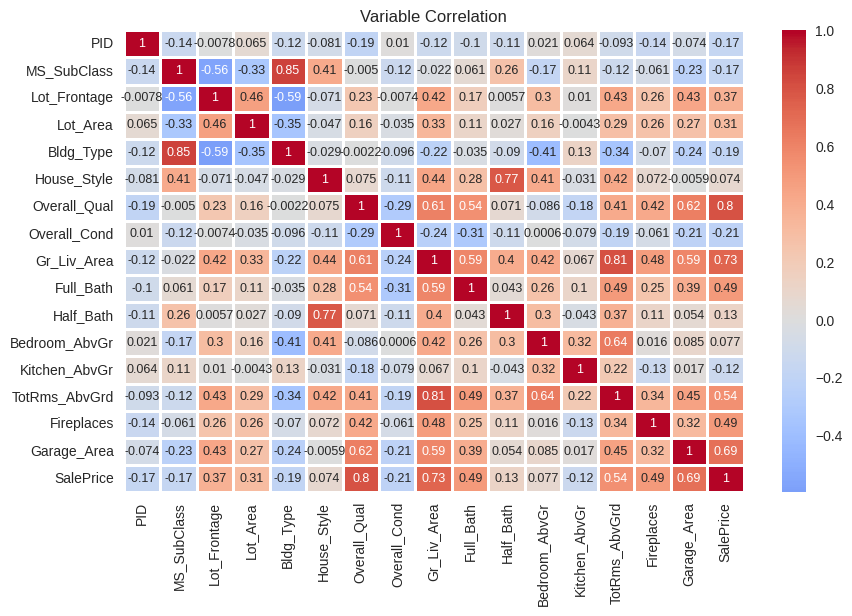

In [43]:
#Representing Matrix as a plot
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(10,6))

sns.heatmap(dfpd1.corr(),center=0, linewidths=0.8,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Variable Correlation')

comparing all variables to one another to determine whether there is a relationship between them. In essence, it conveys the same information as a correlation matrix but in a graphical form.

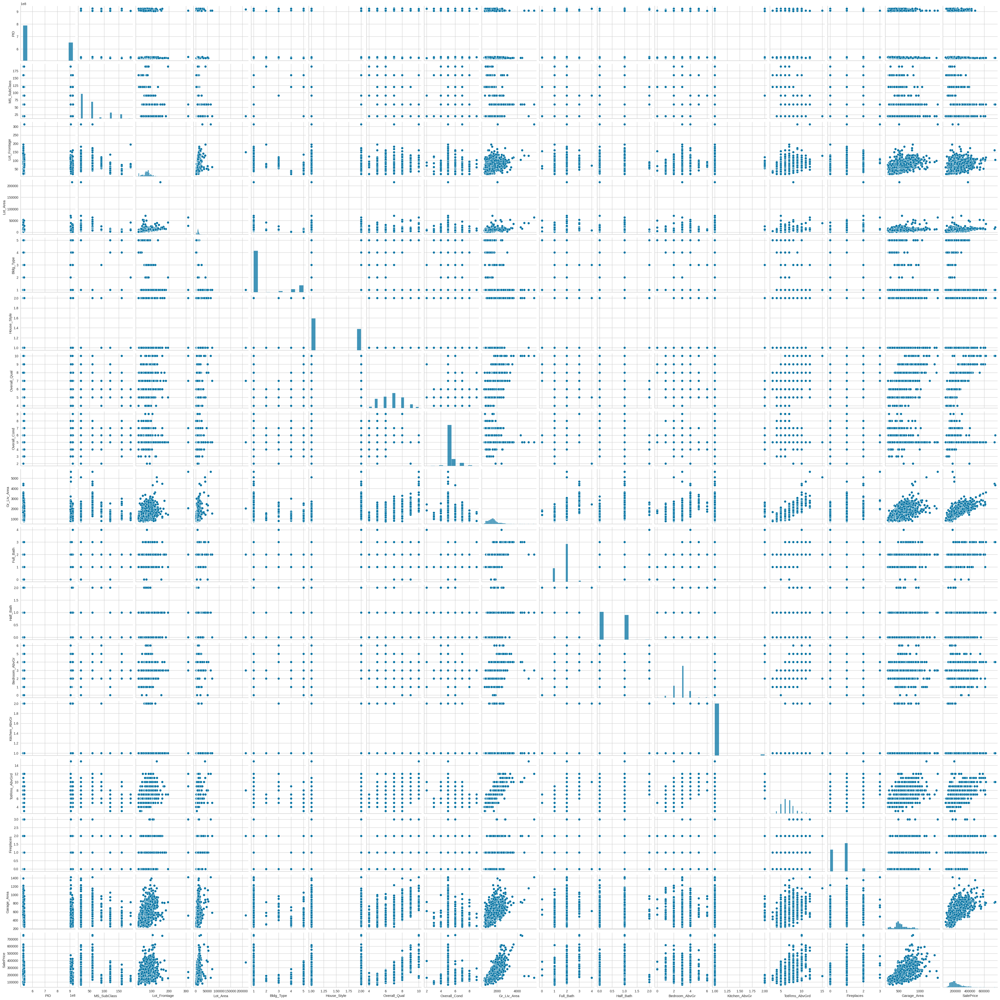

In [44]:
sns.pairplot(dfpd1)

# H20 AutoML Rexecution on new model

Dropping the variables that are not significant for determining Price. Passing this new model again through H20AutoML. Here, we are repeating the entire process exactly as above whilst ignoring the unecessary features.

In [45]:
df1=df.drop(['Street','Year_Built', 'Mo_Sold', 'Yr_Sold'], axis=1)

In [46]:
df1_train, df1_test = df1.split_frame([pct_rows])

In [47]:
X1=df1.columns
print(X1)

['PID', 'MS_SubClass', 'Lot_Frontage', 'Lot_Area', 'Bldg_Type', 'House_Style', 'Overall_Qual', 'Overall_Cond', 'Gr_Liv_Area', 'Full_Bath', 'Half_Bath', 'Bedroom_AbvGr', 'Kitchen_AbvGr', 'TotRms_AbvGrd', 'Fireplaces', 'Garage_Area', 'SalePrice']


In [48]:
#Seperate Dependent variable from Independent variable
y1_numeric ='SalePrice'
X1.remove(y1_numeric) 
print(X1)

['PID', 'MS_SubClass', 'Lot_Frontage', 'Lot_Area', 'Bldg_Type', 'House_Style', 'Overall_Qual', 'Overall_Cond', 'Gr_Liv_Area', 'Full_Bath', 'Half_Bath', 'Bedroom_AbvGr', 'Kitchen_AbvGr', 'TotRms_AbvGrd', 'Fireplaces', 'Garage_Area']


In [49]:
aml1 = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [50]:
aml1.train(x=X1,y=y1_numeric,training_frame=df1_train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),3/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# DRF base models (used / total),1/2
# DeepLearning base models (used / total),0/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [51]:
print(aml1.leaderboard)

model_id                                                   rmse          mse      mae     rmsle    mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_2_20230410_25848  29152.3  8.49859e+08  18979.9  0.121937               8.49859e+08
GBM_grid_1_AutoML_2_20230410_25848_model_17             30477    9.28847e+08  19987.8  0.12608                9.28847e+08
StackedEnsemble_BestOfFamily_3_AutoML_2_20230410_25848  30764.3  9.46441e+08  19433.9  0.123719               9.46441e+08
GBM_grid_1_AutoML_2_20230410_25848_model_21             31252.1  9.76696e+08  20166.8  0.127714               9.76696e+08
StackedEnsemble_AllModels_2_AutoML_2_20230410_25848     31325.5  9.81289e+08  19657.2  0.124212               9.81289e+08
GBM_grid_1_AutoML_2_20230410_25848_model_12             31434.8  9.88144e+08  19504.7  0.124661               9.88144e+08
GBM_grid_1_AutoML_2_20230410_25848_model_13             31618.6  9.99735e+08  20803.6  0.128719               9.99735e+08
XGBoost_grid_1_AutoML_2_

In [52]:
#assign index values to all the models generated
model_index=0
glm_index=0
glm_model=''
aml1_leaderboard_df1=aml1.leaderboard.as_data_frame()
models_dict={}
for m in aml1_leaderboard_df1['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break 
  model_index=model_index+1  

for m in aml1_leaderboard_df1['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break  
  glm_index=glm_index+1     
models_dict

{'StackedEnsemble_BestOfFamily_4_AutoML_2_20230410_25848': 0,
 'GBM_grid_1_AutoML_2_20230410_25848_model_17': 1,
 'GLM_1_AutoML_2_20230410_25848': 103}

In [53]:
#print the index value of best model
print(model_index)
best_model1 = h2o.get_model(aml1.leaderboard[model_index,'model_id'])

1


In [54]:
best_model1.algo

'gbm'

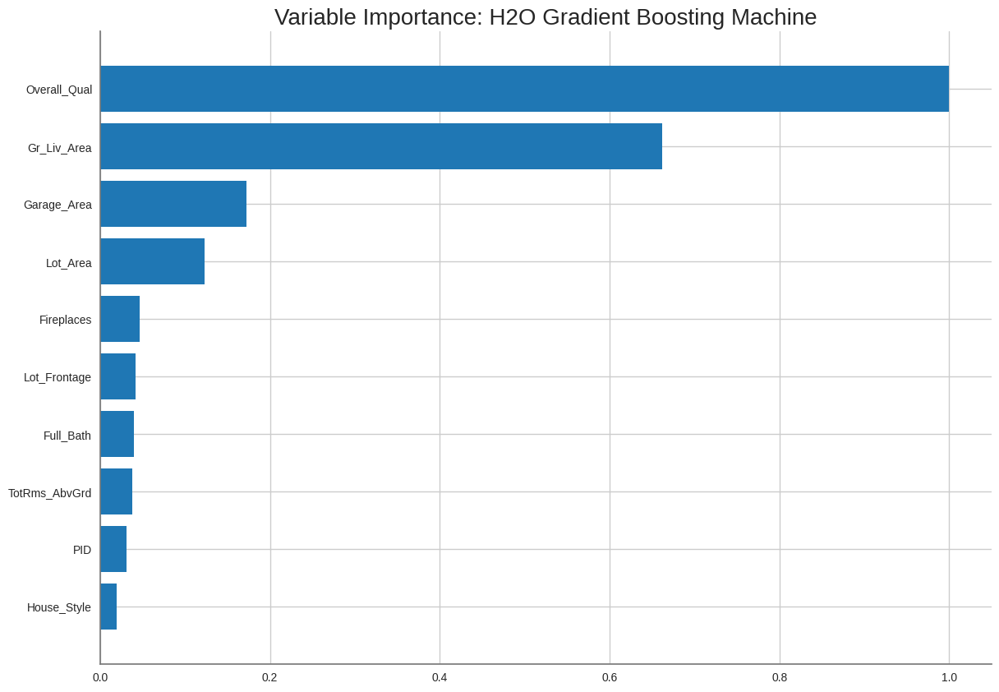

<Figure size 800x550 with 0 Axes>

In [55]:
#plot variables in order of their importance for price prediction
if best_model1.algo in ['gbm','drf','xrt','xgboost']:
    best_model1.varimp_plot()

103
glm


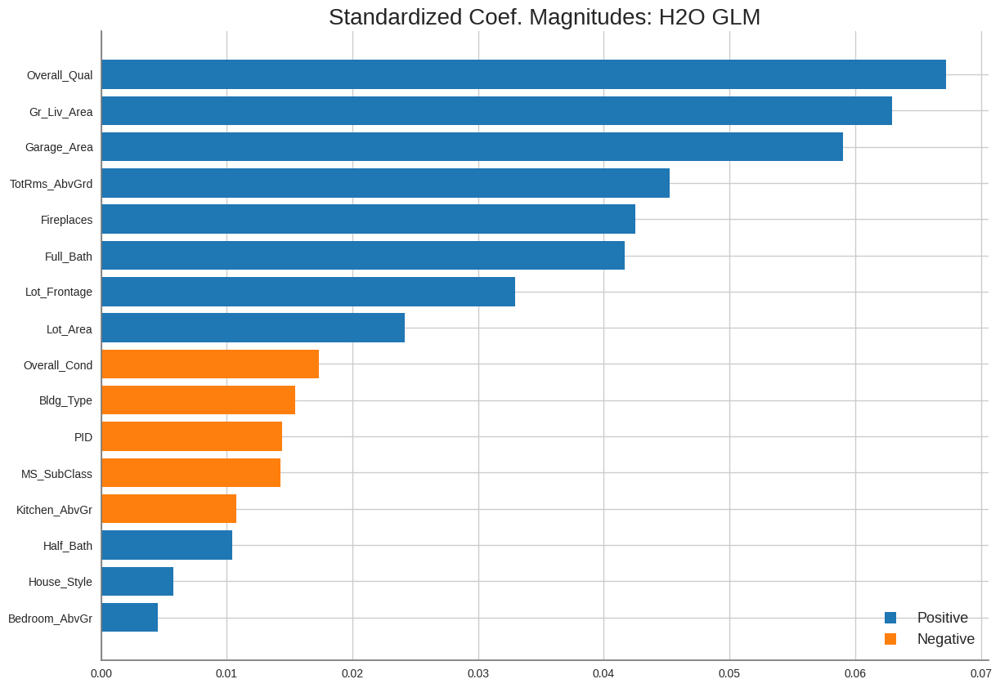

In [56]:
if glm_index is not 0:
  print(glm_index)
  glm_model1=h2o.get_model(aml1.leaderboard[glm_index,'model_id'])
  print(glm_model1.algo) 
  glm_model1.std_coef_plot()

From the above results, we observe that Overall_Qual, Gr_Liv_Area, Garage_Area, TotRms_AbvGrd, Full_Bath, Fireplaces, Lot_Frontage,Lot_Area are some of the important features.

# Checking if assumptions violated

In [57]:
#Seperating the predictor and target variables
A=dfpd1.drop(['SalePrice'],axis=1)
B=dfpd1['SalePrice']

In [58]:
#Splitting the data
A_train,A_test,b_train,b_test=tts(A,B,test_size=0.2,random_state=42)

Here we are check if the Homoscedasticity (normality of the error distribution) assumption is satisfies. A normal distribution of errors is expected.

In [59]:
cols1 = ['MS_SubClass', 'Lot_Frontage', 'Lot_Area', 'Bldg_Type','House_Style','Overall_Qual','Overall_Cond','Gr_Liv_Area','Full_Bath','Half_Bath','Bedroom_AbvGr','Kitchen_AbvGr','TotRms_AbvGrd','Fireplaces','Garage_Area']
model1 = sm.OLS(b_train,sm.add_constant(A_train[cols1])).fit()

In [60]:
b_pred = model1.predict(sm.add_constant(A_train[cols1]))

In [61]:
residuals = b_train-b_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals 5.152455910488411e-09


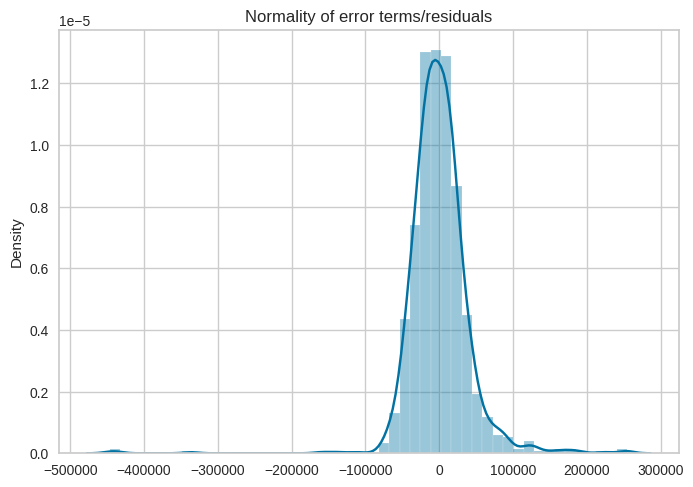

In [62]:
p = sns.distplot(residuals,kde=True)
p = plt.title('Normality of error terms/residuals')

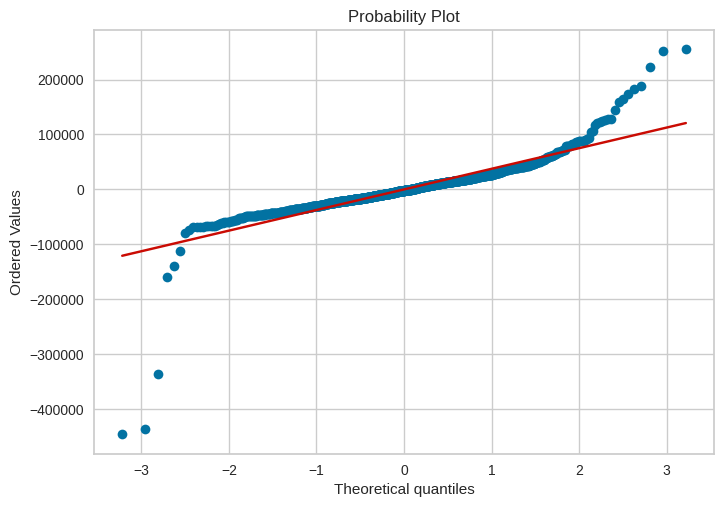

In [63]:
import pylab 
import scipy.stats as stats   
stats.probplot(residuals, dist="norm", plot=pylab)
pylab.show()

<Axes: xlabel='SalePrice', ylabel='Count'>

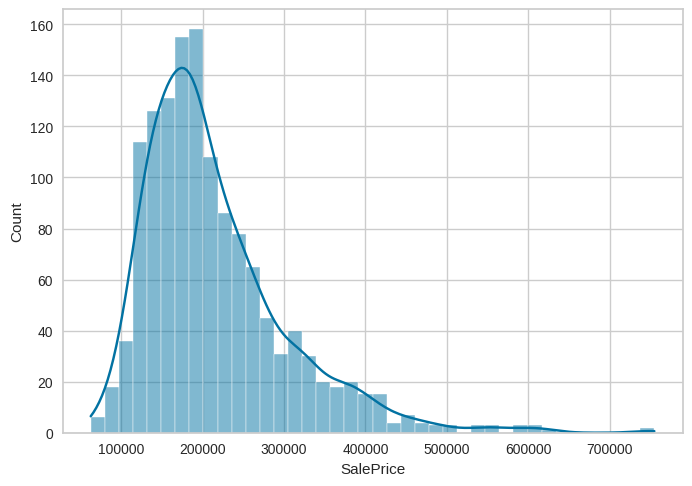

In [64]:
sns.histplot(dfpd.SalePrice, kde = True)

# Ridge Regularization in H20
Regression's primary goal is to identify patterns in the underlying dataset and generalize them in order to forecast the target value for a few additional independent values. Nonetheless, the target dataset may occasionally contain some random noise. Even though the training set may not include any errors, the test dataset's predictions of the proper target values will have significant errors. Regularization is done to avoid this circumstance. Regularization is a method for fine-tuning the random noise function by including an extra term. This additional term regulates the function's excessive fluctuation so that neither the coefficients nor the target value prediction for test data are drastically impacted. Ridge Regularization is utilized for this model.

Here, we use H2OGeneralizedLinearEstimator which would enable us to fit a generalized linear model, specified by a response variable, a set of predictors and a description of the error distribution.

In [65]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
house_glm = H2OGeneralizedLinearEstimator(family = 'gaussian', lambda_ = 0, compute_p_values = True)
house_glm_regularization = H2OGeneralizedLinearEstimator(family = 'gaussian', lambda_ = .001, alpha = 0)

In [66]:
house_glm_regularization.train(x = X1, y = y1_numeric, training_frame = df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681095098636_49


GLM Model: summary
    family    link      regularization            number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Ridge ( lambda = 0.001 )  16                            16                             1                       py_9_sid_bd96

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 1619019086.4362383
RMSE: 40237.036253136714
MAE: 25587.8799462613
RMSLE: 0.17082453492439492
Mean Residual Deviance: 1619019086.4362383
R^2: 0.8028017646485756
Null degrees of freedom: 1076
Residual degrees of freedom: 1060
Null deviance: 8842287827700.037
Residual deviance: 1743683556091.8286
AIC: 25930.271546269454

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective          training_rmse       training_deviance    training_mae      training_r2
--  -------------------  ----------  ------------  -------------------------  -----------------  ------------------  -------------------  ----------------  ------------------
    2023-04-10 03:02:40  0.000 sec   0             8842287827700.037          8210109403.621204
    2023-04-10 03:02:40  0.016 sec   1                                                           40237.036253136714  1619019086.4362383   25587.8799462613  0.8028017646485756

Variable Importances: 
variable       relative_importance    scaled_importance    percentage
-------------  ---------------------  -------------------  ------------
Gr_Liv_Area    42696.9                1                    0.302098
Overall_Qual   34859.9                0.81645              0.246648
Garage_Area    14332.2                0.335673             0.101406
House_Style    14166.2                0.331784             0.100231
Kitchen_AbvGr  5547.31                0.129923             0.0392495
Fireplaces     4981.97                0.116682             0.0352494
Bedroom_AbvGr  4752.98                0.111319             0.0336292
Lot_Area       3467.67                0.0812159            0.0245352
Bldg_Type      3452.29                0.0808556            0.0244263
Overall_Cond   3321.81                0.0777998            0.0235032
Half_Bath      2510.42                0.0587963            0.0177623
PID            2318.19                0.0542941            0.0164022
MS_SubClass    2101.18                0.0492114            0.0148667
Lot_Frontage   1435.38                0.0336179            0.0101559
Full_Bath      920.869                0.0215676            0.00651553
TotRms_AbvGrd  469.297                0.0109914            0.00332047

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

In [67]:
#Model details without regularization
house_glm.train(x = X1, y = y1_numeric, training_frame = df1_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1681095098636_50


GLM Model: summary
    family    link      regularization    number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ----------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  None              16                            16                             1                       py_9_sid_bd96

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 1619007535.3233304
RMSE: 40236.89271456396
MAE: 25586.754076263125
RMSLE: 0.17091331513837024
Mean Residual Deviance: 1619007535.3233304
R^2: 0.8028031715863324
Null degrees of freedom: 1076
Residual degrees of freedom: 1060
Null deviance: 8842287827700.037
Residual deviance: 1743671115543.2268
AIC: 25930.26386223837

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective          training_rmse      training_deviance    training_mae        training_r2
--  -------------------  ----------  ------------  -------------------------  -----------------  -----------------  -------------------  ------------------  ------------------
    2023-04-10 03:02:40  0.000 sec   0             8842287827700.037          8210109403.621204
    2023-04-10 03:02:40  0.056 sec   1                                                           40236.89271456396  1619007535.3233304   25586.754076263125  0.8028031715863324

Variable Importances: 
variable       relative_importance    scaled_importance    percentage
-------------  ---------------------  -------------------  ------------
Gr_Liv_Area    42907.1                1                    0.303002
Overall_Qual   34902.3                0.813438             0.246474
Garage_Area    14294.7                0.333155             0.100947
House_Style    14283.3                0.332888             0.100866
Kitchen_AbvGr  5537.12                0.129049             0.0391022
Fireplaces     4949.7                 0.115359             0.0349539
Bedroom_AbvGr  4733.25                0.110314             0.0334254
Bldg_Type      3593.09                0.0837413            0.0253738
Lot_Area       3456.44                0.0805564            0.0244088
Overall_Cond   3333.9                 0.0777005            0.0235434
Half_Bath      2515.1                 0.0586174            0.0177612
PID            2318.76                0.0540415            0.0163747
MS_SubClass    1977.37                0.046085             0.0139639
Lot_Frontage   1477.48                0.0344343            0.0104337
Full_Bath      968.99                 0.0225835            0.00684284
TotRms_AbvGrd  357.861                0.00834037           0.00252715

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

# Data Report

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
GBM_5_AutoML_2_20230410_25848,28306.6,8.01266e+08,19238,0.113048,8.01266e+08,264,0.013465,GBM
StackedEnsemble_BestOfFamily_3_AutoML_2_20230410_25848,28800.7,8.29478e+08,19844.8,0.117527,8.29478e+08,152,0.044063,StackedEnsemble
StackedEnsemble_AllModels_3_AutoML_2_20230410_25848,28921.5,8.36452e+08,19892.8,0.122948,8.36452e+08,548,0.209562,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_2_20230410_25848,29045.9,8.43667e+08,19890.5,0.118057,8.43667e+08,148,0.087859,StackedEnsemble
GBM_grid_1_AutoML_2_20230410_25848_model_8,29156.2,8.50082e+08,19567.4,0.120696,8.50082e+08,823,0.023397,GBM
DRF_1_AutoML_2_20230410_25848,29533.7,8.72237e+08,19214.4,0.121767,8.72237e+08,1538,0.01541,DRF
GBM_grid_1_AutoML_2_20230410_25848_model_13,29783.3,8.87044e+08,19681.5,0.123927,8.87044e+08,817,0.024308,GBM
XGBoost_grid_1_AutoML_2_20230410_25848_model_4,29811.3,8.88712e+08,20862,0.121127,8.88712e+08,207,0.013724,XGBoost
XGBoost_grid_1_AutoML_2_20230410_25848_model_38,29886.8,8.93222e+08,20338.4,0.121748,8.93222e+08,228,0.008053,XGBoost
XGBoost_grid_1_AutoML_2_20230410_25848_model_54,29936.6,8.96202e+08,21165.2,0.125449,8.96202e+08,195,0.003788,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

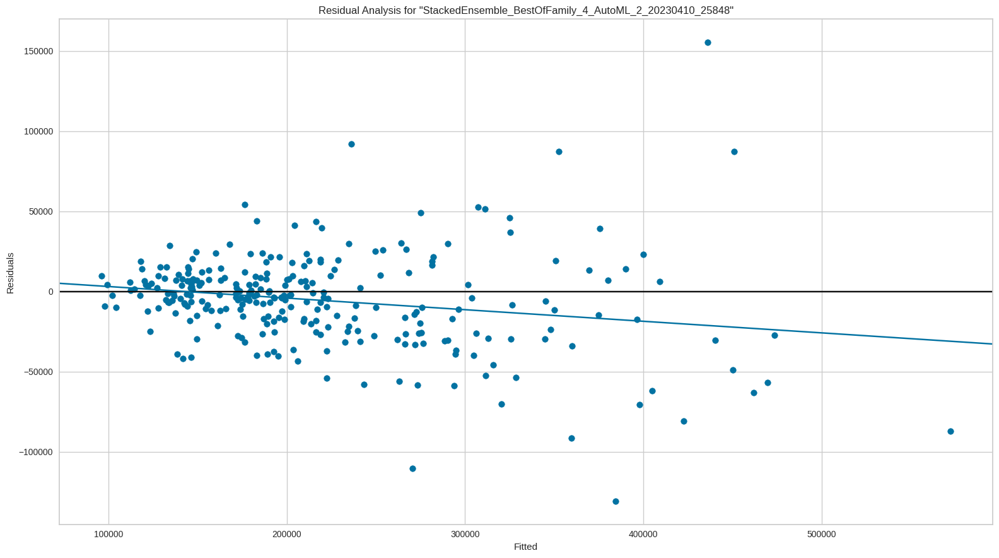

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

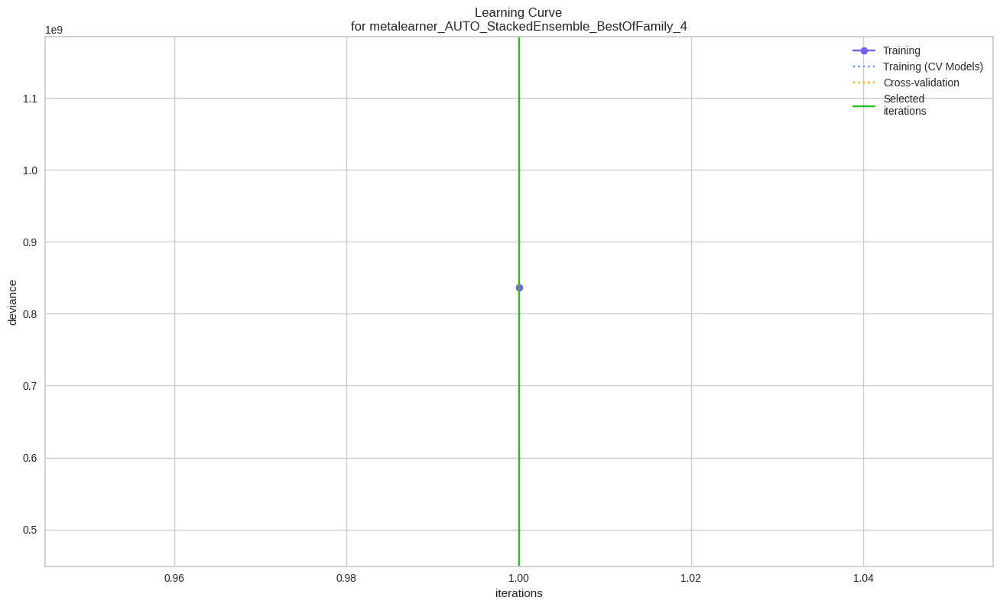

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

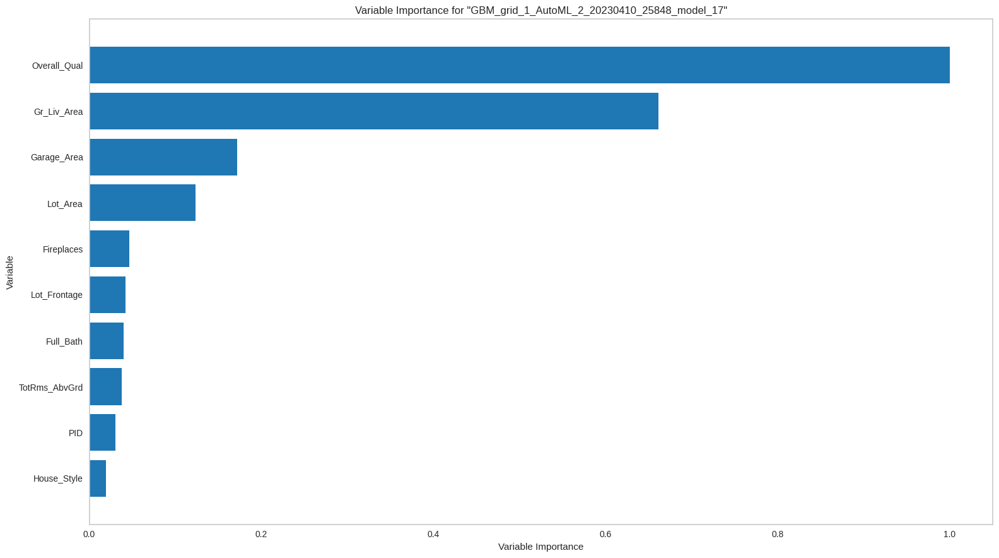

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

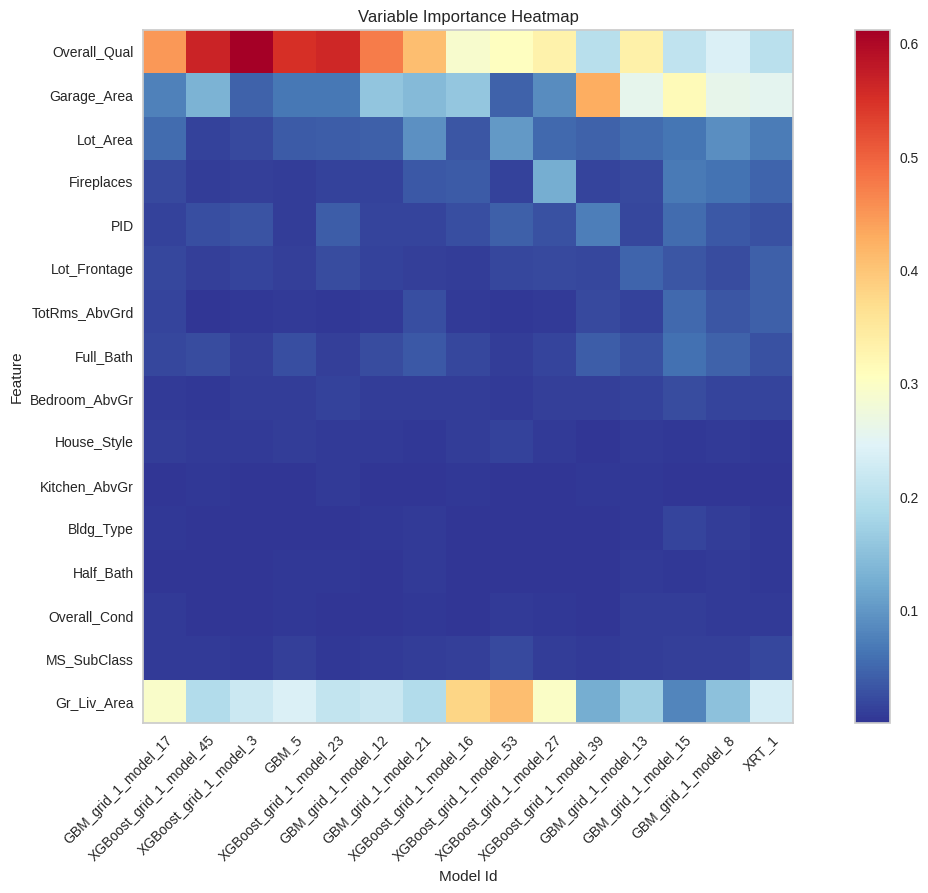

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

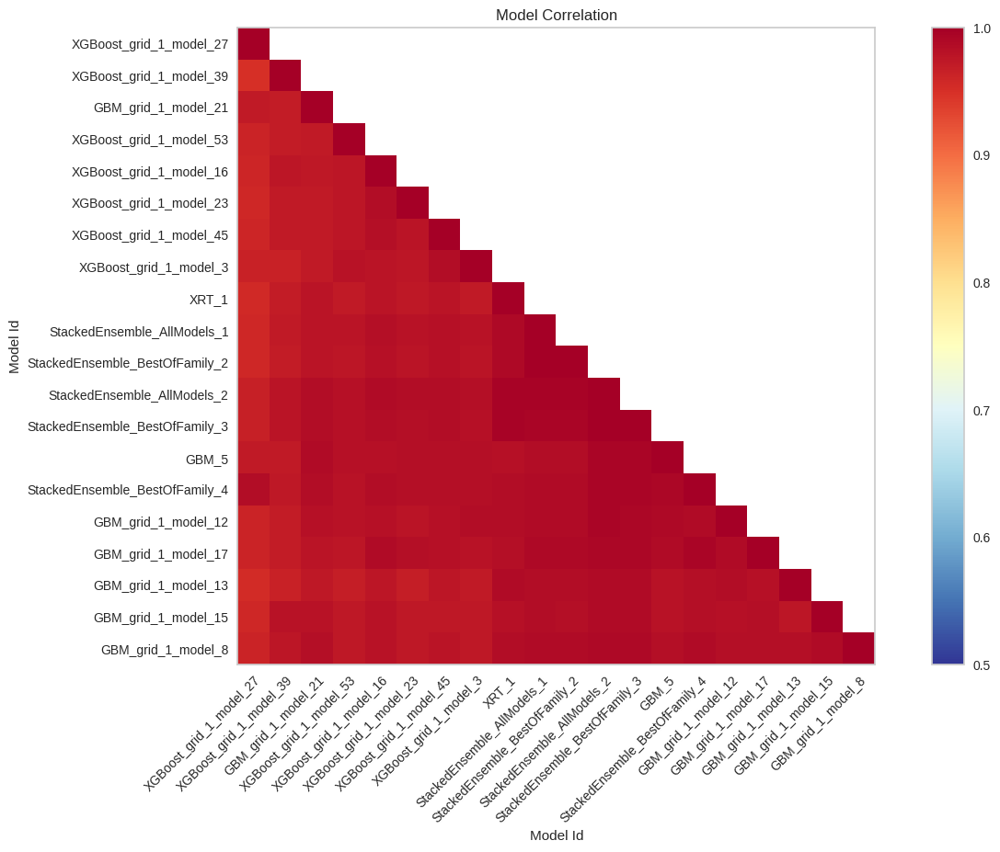

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

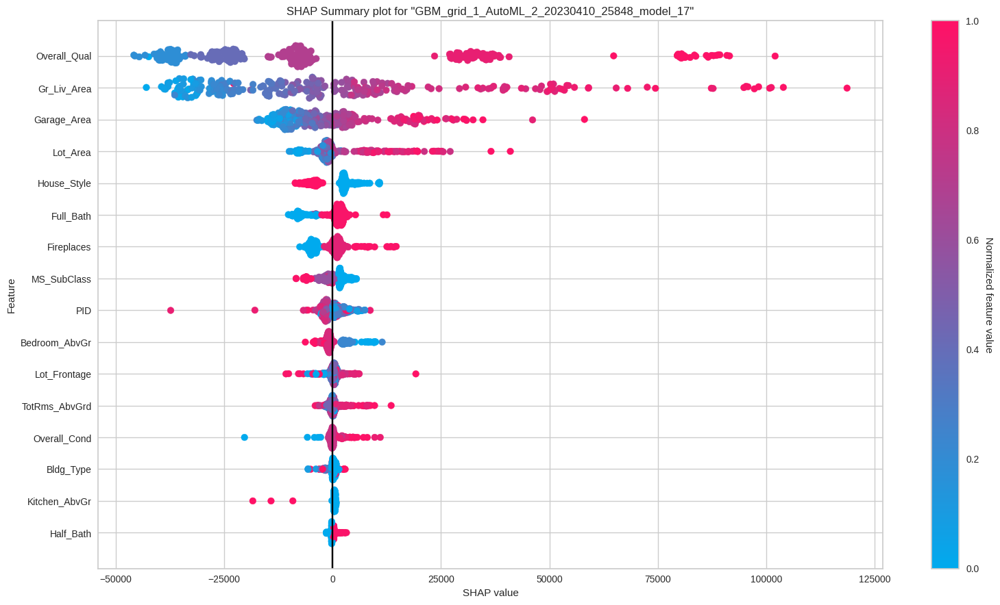

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

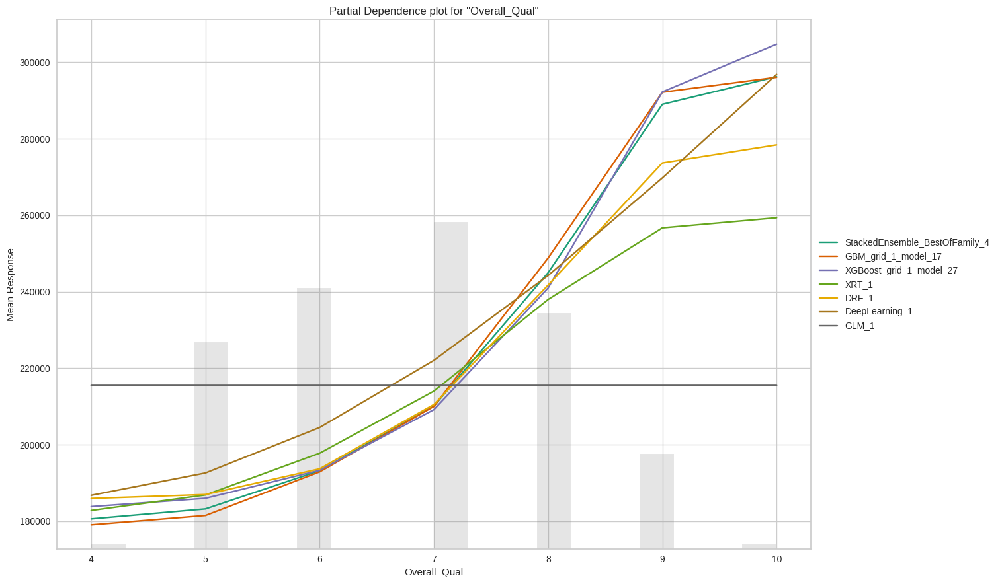

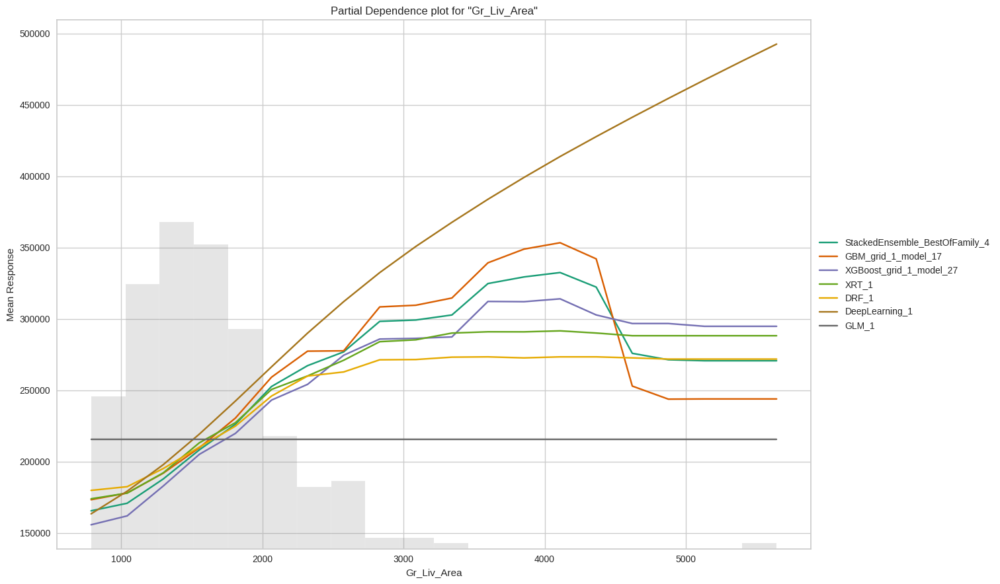

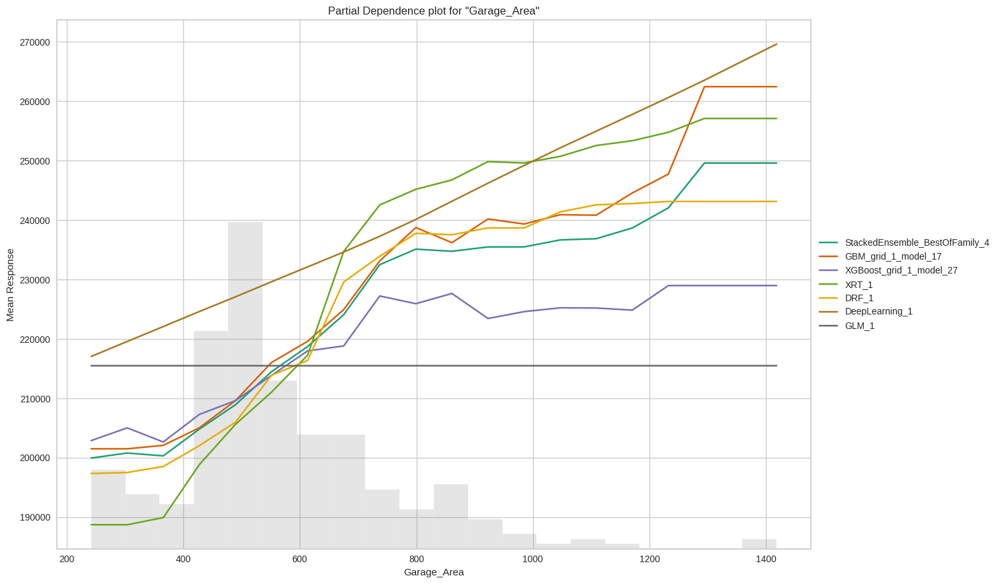

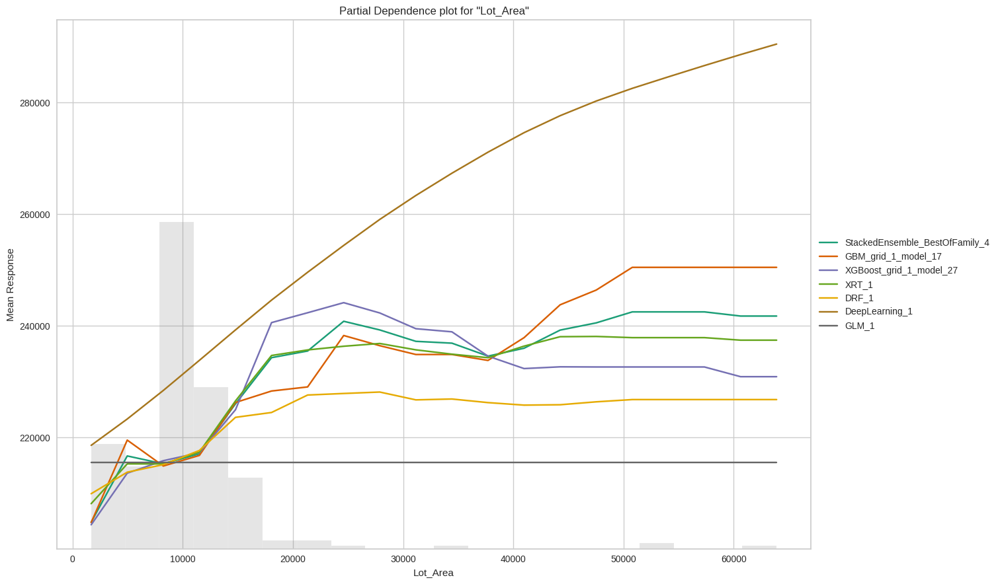

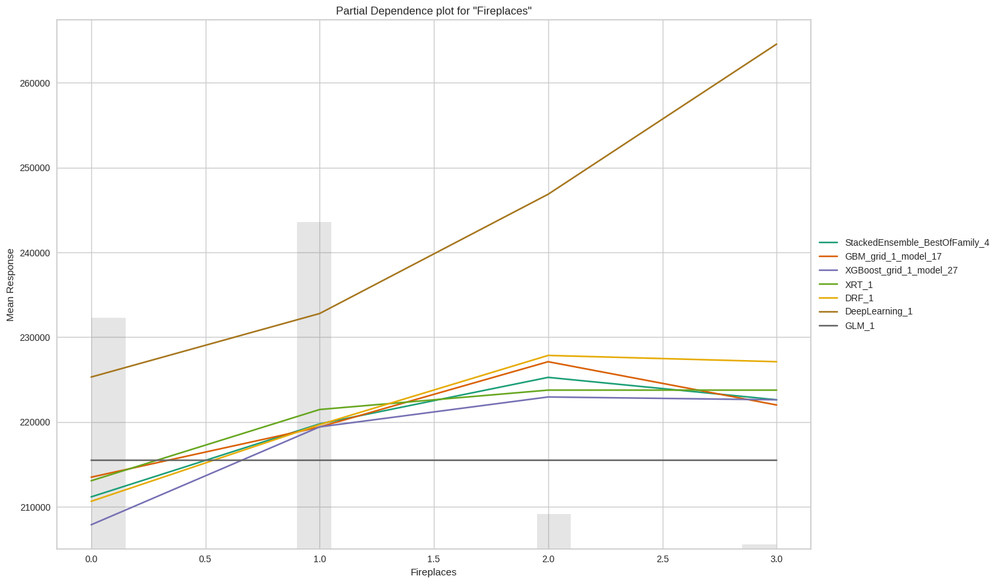

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

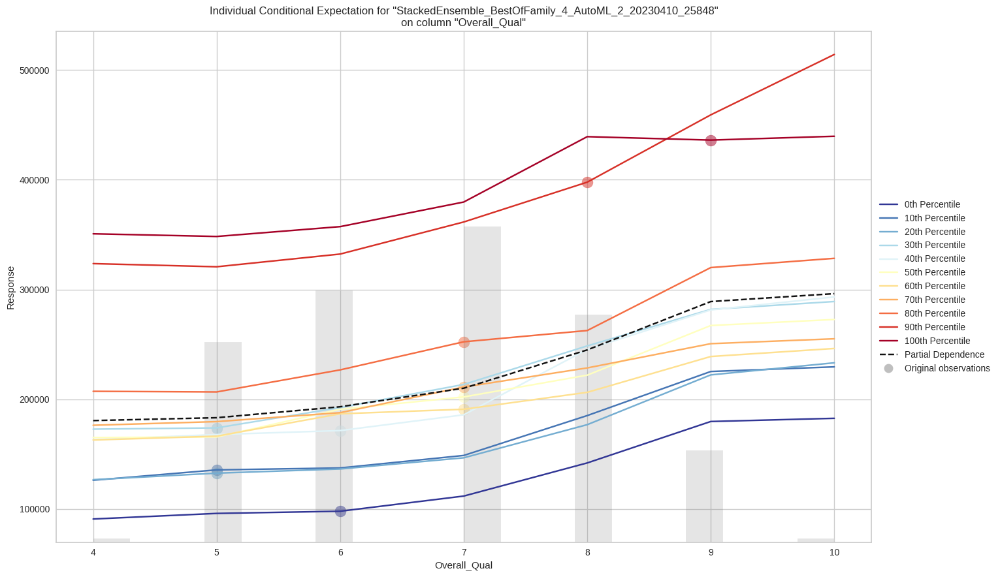

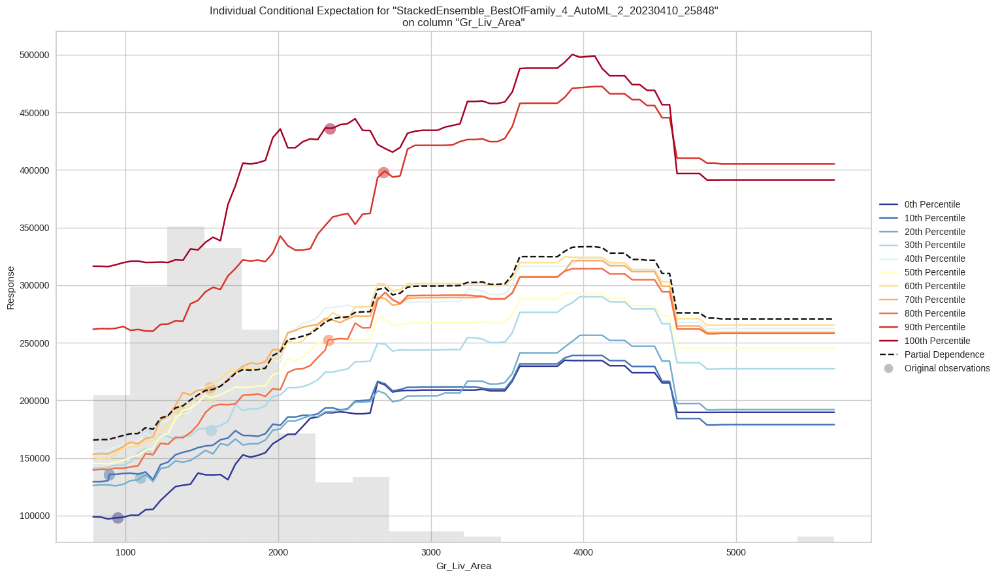

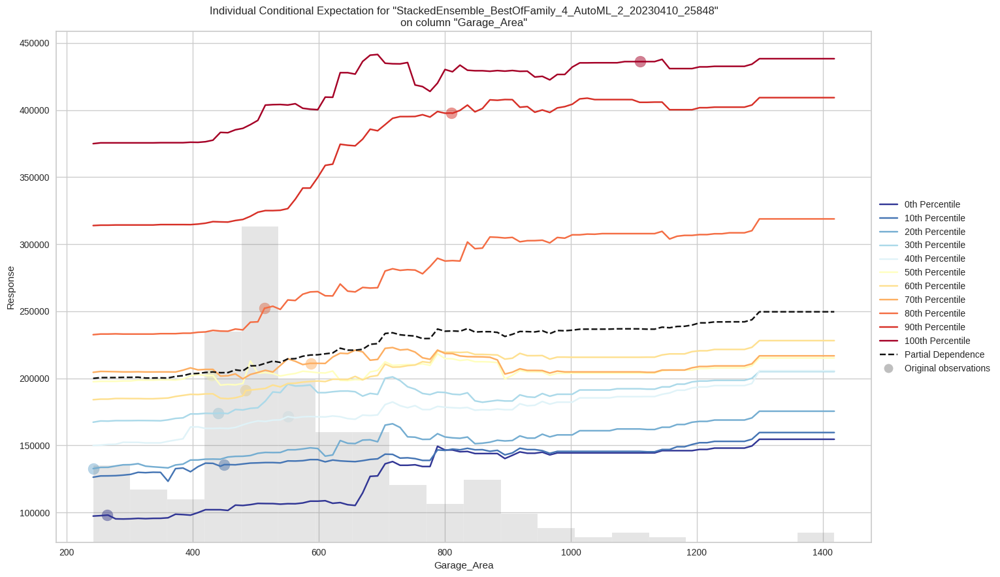

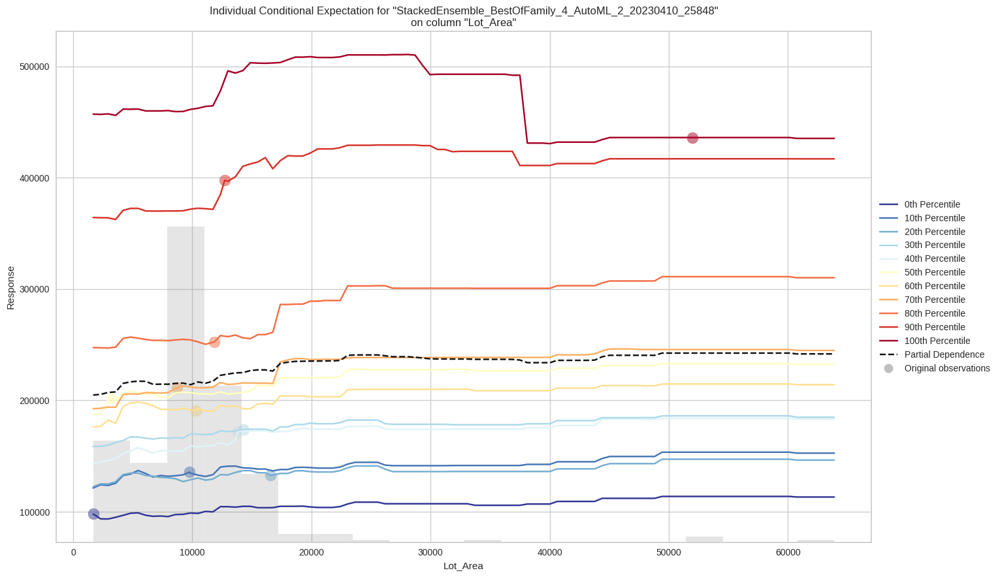

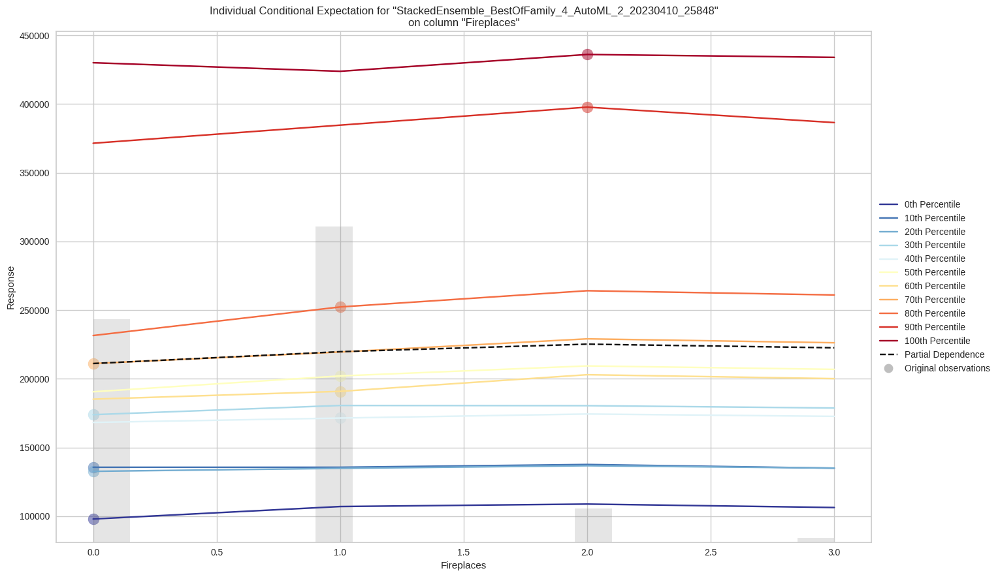

In [68]:
exa = aml1.explain(df1_test)

# Hyperparameter Tuning

To find best set a hyperparameter and combinations of interacting hyperparameters for a given dataset hyperparameters tuning is used. It objectively searches different values for model hyperparameters and chooses a subset that results in a model that achieves the best performance on a given dataset.

In [69]:
s = dfpd1['SalePrice']

t = dfpd1.drop(['SalePrice'], axis = 1)

In [70]:
import numpy as np

from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import RandomizedSearchCV

In [71]:
t_train, t_test, s_train, s_test = train_test_split (t, s, random_state = 101, test_size = 0.2)

In [72]:
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestRegressor

mode = RandomForestRegressor()

param_vals = {'max_depth': [200, 500, 800, 1100], 'n_estimators': [100,200, 300, 400], 'min_samples_split' : [2,3,5]

}

random_rf = RandomizedSearchCV(estimator=mode, param_distributions=param_vals,

n_iter=10, scoring='accuracy', cv=5,

refit=True, n_jobs=-1)

#Training and prediction



random_rf.fit(t_train, s_train)

preds = random_rf.best_estimator_.predict(t_test)

In [73]:
random_rf.best_params_

{'n_estimators': 400, 'min_samples_split': 5, 'max_depth': 200}

# WHAT HAVE WE LEARNT FROM ABOVE:

-Based on the provided regression results, the overall relationship between the dependent variable (SalePrice) and the independent variables included in the model is significant.

-The R-squared value of 0.784 indicates that the model explains 78.4% of the variance in the dependent variable, and the F-statistic of 268.8 with a Prob (F-statistic) value of 0.00 suggests that the overall model is significant at a 5% level of significance.

-However, to determine the significance of individual predictors, we need to look at their p-values.

-The p-value for each predictor shows the probability of observing a relationship as strong as or stronger than the observed relationship, assuming there is no true relationship between the predictor and the dependent variable.

-Predictors with p-values less than 0.05 are typically considered statistically significant, meaning we can reject the null hypothesis that there is no relationship between the predictor and the dependent variable.

-Looking at the table, we can see that the predictors Lot_Frontage, Lot_Area, House_Style, Overall_Qual, Overall_Cond, Gr_Liv_Area, Half_Bath, Kitchen_AbvGr, TotRms_AbvGrd, Fireplaces, and Garage_Area have p-values less than 0.05, indicating they are statistically significant predictors of SalePrice in this model.

-On the other hand, predictors with p-values greater than 0.05, such as Street, MS_SubClass, Bldg_Type, Full_Bath, Bedroom_AbvGr, Mo_Sold, and Yr_Sold, are not statistically significant at the 0.05 level in this model.

It's important to note that significance levels can vary depending on the context and the research question, and that a predictor with a non-significant p-value in one model may become significant in another model that includes different predictors or different functional forms of the predictors.

here is multicollinearity present in the variables. Multicollinearity occurs when two or more independent variables in a multiple regression model are highly correlated with each other. This can be seen from the Variance Inflation Factor (VIF) values of the variables, which are shown in the table.

A commonly used rule of thumb is that a VIF value of 5 or greater indicates the presence of multicollinearity. In this case, we can see that several variables have VIF values that exceed this threshold, such as House_Style, Overall_Qual, Overall_Cond, Year_Built, Gr_Liv_Area, Bedroom_AbvGr, Kitchen_AbvGr, TotRms_AbvGrd, and Yr_Sold.

3.In the multivariate models are predictor variables independent of all the other predictor variables?

In a multiple regression model, the predictor variables are assumed to be independent of each other, meaning that there is no multicollinearity present.

To test for multicollinearity, we can calculate the Variance Inflation Factor (VIF) for each predictor variable. The VIF measures the degree of multicollinearity between each predictor variable and the other variables in the model. A VIF value of 1 indicates no multicollinearity, while a value greater than 1 indicates some degree of multicollinearity.

Based on the given VIF values, we can see that some predictor variables have high VIF values, indicating some degree of multicollinearity between them and the other predictor variables in the model. Specifically, MS_SubClass, Lot_Frontage, Bldg_Type, House_Style, Overall_Qual, Overall_Cond, Gr_Liv_Area, Full_Bath, Bedroom_AbvGr, Kitchen_AbvGr, and TotRms_AbvGrd all have VIF values greater than 5, with Overall_Qual having a particularly high VIF value of almost 98.

Therefore, we cannot conclude that all predictor variables are independent of each other.

Regularization is a method for fine-tuning the random noise function by including an extra term. This additional term regulates the function's excessive fluctuation so that neither the coefficients nor the target value prediction for test data are drastically impacted. Regularization is primarily used to reduce validation loss and attempt to increase model correctness. Ridge Regularization was applied to the training set of this model. Root Mean Square Error (RMSE) and R2 were reported to be calculated twice, once when regularization was not done and once when it was. In both instances, the values were the same. Therefore, it can be inferred that regularization is ineffective for this model.

To find best set a hyperparameter and combinations of interacting hyperparameters for a given dataset hyperparameters tuning is used. It objectively searches different values for model hyperparameters and chooses a subset that results in a model that achieves the best performance on a given dataset. For this model tuning is performed using RandomForestRegressor. The best hyperparameters for this model are: n_estimators': 300, 'min_samples_split': 5, 'max_depth': 200

# LETS LOOK AT MODEL INTERPRETIBILITY:

In [74]:
# Importing all libraries necessary for the assignment
!pip install shap
!pip install h2o
!pip install sklearn>=0.2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.4/572.4 KB 34.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [75]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [76]:
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV


In [77]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


In [78]:
# Setting up maximum runtime for the AutoML
min_mem_size = 6
run_time = 222

In [79]:
# Setting up memory
pct_memory = 0.5
virtual_memory = psutil.virtual_memory()
min_mem_size = int(round(int(pct_memory * virtual_memory.available) / 1073741824, 0))
print(min_mem_size)

3


In [80]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:9350..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.18" 2023-01-17; OpenJDK Runtime Environment (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1); OpenJDK 64-Bit Server VM (build 11.0.18+10-post-Ubuntu-0ubuntu120.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.9/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpmmbka7hl
  JVM stdout: /tmp/tmpmmbka7hl/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpmmbka7hl/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:9350
Connecting to H2O server at http://127.0.0.1:9350 ... successful.


H2O_cluster_uptime:,06 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.3
H2O_cluster_version_age:,5 days
H2O_cluster_name:,H2O_from_python_unknownUser_rux3aq
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [81]:
ames_df = pd.read_csv(
    "https://raw.githubusercontent.com/Tanvivalkunde/dsem-ass-2/main/ames%20housing.csv"
)  # Reading CSV file into Pandas DataFrame"

In [82]:
X = ames_df.drop(['SalePrice','Street','Year_Built','Yr_Sold','Mo_Sold'], axis=1) # Training Feature
Y = ames_df['SalePrice']  # Target

In [83]:
from sklearn.model_selection import train_test_split
!pip install shap
import shap

(
    x_train,
    x_test,
    y_train,
    y_test,
) = train_test_split(  # Splitting Data into Training and Test
    X, Y, test_size=0.1, random_state=42
)
x_train_100 = shap.utils.sample(
    x_train, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process
x_test_100 = shap.utils.sample(
    x_test, 100
)  # Taking 100 samples out for SHAP analysis as it is a computationally expensive process

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Fitting a Linear Model

In [84]:
!pip install sklearn
import sklearn

from sklearn import linear_model
linear_model = sklearn.linear_model.LinearRegression()  # Initializing a Linear Model
linear_model.fit(x_train, y_train)  # Training a linear model

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached sklearn-0.0.post1.tar.gz (3.6 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


LinearRegression()

In [85]:
dfpd=pd.read_csv("https://raw.githubusercontent.com/Tanvivalkunde/dsem-ass-2/main/ames%20housing.csv")

In [86]:
import statsmodels.formula.api as smf #OLS model Library
results = smf.ols('SalePrice ~ MS_SubClass + Lot_Frontage + Lot_Area + Bldg_Type + Year_Built + House_Style + Overall_Qual +Overall_Cond + Gr_Liv_Area +Full_Bath + Half_Bath +Bedroom_AbvGr +Kitchen_AbvGr+ TotRms_AbvGrd +Fireplaces+ Garage_Area +Mo_Sold + Yr_Sold + Street' , data=dfpd).fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              SalePrice   R-squared:                       0.786
Model:                            OLS   Adj. R-squared:                  0.783
Method:                 Least Squares   F-statistic:                     257.5
Date:                Mon, 10 Apr 2023   Prob (F-statistic):               0.00
Time:                        03:07:54   Log-Likelihood:                -16272.
No. Observations:                1351   AIC:                         3.258e+04
Df Residuals:                    1331   BIC:                         3.269e+04
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept      -1.391e+06   1.78e+06     -0.780      0.436   -4.89e+06    2.11e+06
Street[T.Pave]  5448.6768   2.44e+04      0.224      0.823   -4.24e+04    5.33e+04
MS_SubClass      -59.8839     87.620     -0.683      0.494    -231.773     112.005
Lot_Frontage    -194.0745     64.262     -3.020      0.003    -320.140     -68.009
Lot_Area           0.5046      0.172      2.929      0.003       0.167       0.843
Bldg_Type      -2431.8617   2543.288     -0.956      0.339   -7421.152    2557.429
Year_Built       453.1218    127.336      3.558      0.000     203.321     702.922
House_Style      -3.3e+04   5721.293     -5.767      0.000   -4.42e+04   -2.18e+04
Overall_Qual    2.575e+04   1594.156     16.152      0.000    2.26e+04    2.89e+04
Overall_Cond    6058.0928   1828.967      3.312      0.001    2470.122    9646.064
Gr_Liv_Area       71.7027      5.500     13.037      0.000      60.913      82.493
Full_Bath      -3527.9032   3854.867     -0.915      0.360   -1.11e+04    4034.374
Half_Bath       8737.2993   3848.740      2.270      0.023    1187.042    1.63e+04
Bedroom_AbvGr  -2444.3815   2502.442     -0.977      0.329   -7353.542    2464.779
Kitchen_AbvGr  -3.181e+04   9511.982     -3.344      0.001   -5.05e+04   -1.31e+04
TotRms_AbvGrd   2487.0371   1551.815      1.603      0.109    -557.233    5531.308
Fireplaces      1.007e+04   2324.070      4.334      0.000    5513.175    1.46e+04
Garage_Area       69.6240      9.401      7.406      0.000      51.181      88.067
Mo_Sold         -143.5866    418.290     -0.343      0.731    -964.165     676.992
Yr_Sold          209.2443    877.939      0.238      0.812   -1513.050    1931.539
==============================================================================
Omnibus:                      797.719   Durbin-Watson:                   1.775
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            73485.489
Skew:                          -1.849   Prob(JB):                         0.00
Kurtosis:                      38.941   Cond. No.                     2.05e+07
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.05e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Ordinary least squares (OLS) regression The relationship between one or more independent variables and a dependent variable is estimated using the ordinary least squares (OLS) regression statistical method of analysis, which minimizes the sum of the squares in the difference between the observed and predicted values of the dependent variable

Here are some conclusions that can be drawn from the regression results:

The output shows the results of a multiple linear regression analysis of the SalePrice of 1351 homes based on 19 predictor variables. The model has an R-squared value of 0.786, indicating that approximately 78.6% of the variability in SalePrice can be explained by the predictor variables.

The coefficient estimates for each predictor variable and the intercept are shown in the "coef" column. A positive coefficient indicates a positive association between the predictor variable and SalePrice, while a negative coefficient indicates a negative association. The "std err" column shows the standard error of the coefficient estimates, and the "t" column shows the t-value for the hypothesis test that the coefficient is equal to zero. The "P>|t|" column shows the p-value for this test, indicating the strength of evidence against the null hypothesis that the coefficient is equal to zero. A p-value less than 0.05 suggests that the variable is statistically significant in predicting SalePrice.

Based on the output, some variables appear to have a statistically significant association with SalePrice, including Lot_Frontage, Lot_Area, Year_Built, House_Style, Overall_Qual, Overall_Cond, Gr_Liv_Area, Half_Bath, Kitchen_AbvGr, Fireplaces, and Garage_Area.

However, some variables such as Street, MS_SubClass, Bldg_Type, Full_Bath, Bedroom_AbvGr, TotRms_AbvGrd, Mo_Sold, and Yr_Sold do not seem to have a statistically significant association with SalePrice, as indicated by their high p-values.

The Durbin-Watson value of 1.775 suggests that there is no significant autocorrelation among the residuals, and the Omnibus test indicates that the residuals are not normally distributed. The skewness and kurtosis values also suggest that the residuals are not normally distributed.

Overall, the regression model appears to have some significant predictor variables, but the distribution of the residuals may suggest some limitations to the model's predictive ability

# Fit Tree Based Model

In [87]:
# Setting the max_dept to 3 for the purpose of ease of explainbility and readability
tree_model = RandomForestRegressor(max_depth=3, random_state=0, n_estimators=10)
tree_model.fit(x_train, y_train)

RandomForestRegressor(max_depth=3, n_estimators=10, random_state=0)

In [88]:
import matplotlib.pyplot as plt
from sklearn.tree import export_graphviz

# Visualization of Nodes for the purpose of explainability
plt.figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=x_train.columns,
    filled=True,
    precision=2,
    rounded=True,
)


<Figure size 2560x1920 with 0 Axes>

In [89]:
import os
os.environ["PATH"] += os.pathsep + 'C:/Users/Tanvi/Downloads/windows_10_msbuild_Release_graphviz-7.1.0-win32.zip/Graphviz'

In [90]:
!pip install pydot Graphviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [91]:
import pydot

In [92]:
import pydot
import matplotlib.image as mpimg
import matplotlib.pyplot as plt


plt.figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=X.columns,
    filled=True,
    rounded=True
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")

<Figure size 2560x1920 with 0 Axes>

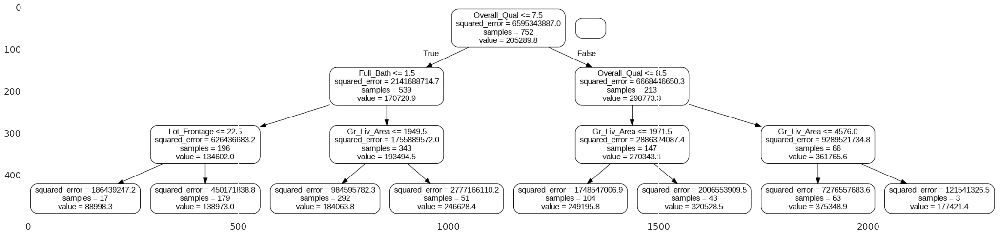

In [93]:
# Visualization of Nodes for the purpose of explainability
plt.figure(figsize=(32, 24), dpi=80)
tree = tree_model.estimators_[0]
export_graphviz(
    tree,
    out_file="tree.dot",
    feature_names=list(x_train.columns),
    rounded=True,
    precision=1,
)
(graph,) = pydot.graph_from_dot_file("tree.dot")
graph.write_png("tree.png")
img = mpimg.imread("tree.png")
imgplot = plt.imshow(img)
plt.show()

Interpreting Nodes of a Tree-Based Model Random Forest Regressor works on the concept of the wisdom of the crowd. The above decision tree is one of the many trees involved in predicting the target variable. Each decision tree regression predicts a number as an output for a given input. Random forest regression takes the average of those predictions as its final output.

As usual, the tree has conditions on each internal node and a value associated with each leaf (i.e. the value to be predicted). But additionally, we’ve plotted out the value at each internal node i.e. the mean of the response variables in that region.

From the above graph we can see that the decision tree makes the best decision by trying various combinations itself and tells us that Overall_Qual is the important feature

In [94]:
# Get numerical feature importances
tree_importances = list(tree_model.feature_importances_)
# List of tuples with variable and importance
feature_importances = [
    (feature, round(importance, 2))
    for feature, importance in zip(x_train.columns, tree_importances)
]
# Sort the feature importances by most important first
feature_importances = sorted(feature_importances, key=lambda x: x[1], reverse=True)

In [95]:
# Print out the feature and importances
[print("Variable: {:20} Importance: {}".format(*pair)) for pair in feature_importances];

Variable: Overall_Qual         Importance: 0.8
Variable: Gr_Liv_Area          Importance: 0.16
Variable: Full_Bath            Importance: 0.02
Variable: Overall_Cond         Importance: 0.01
Variable: Bedroom_AbvGr        Importance: 0.01
Variable: PID                  Importance: 0.0
Variable: MS_SubClass          Importance: 0.0
Variable: Lot_Frontage         Importance: 0.0
Variable: Lot_Area             Importance: 0.0
Variable: Bldg_Type            Importance: 0.0
Variable: House_Style          Importance: 0.0
Variable: Half_Bath            Importance: 0.0
Variable: Kitchen_AbvGr        Importance: 0.0
Variable: TotRms_AbvGrd        Importance: 0.0
Variable: Fireplaces           Importance: 0.0
Variable: Garage_Area          Importance: 0.0


The variable importance we get from the tree-based regressor re-inforces our interpretation from the linear model

**Getting best model using H2O AutoML**

In [96]:
ames_hf = h2o.H2OFrame(ames_df)  # Converting Pandas dataframe in H2O dataframe

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [97]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = ames_hf.split_frame([pct_rows])

In [98]:
# Setting up AutoML
def autoML(df_train, df_test):
    X = df_train.columns
    y = "SalePrice"

    X.remove(y)  # Removing the result frm our predictors data
    X.remove("Street")  # Removing ID from the predictor's data, as it is not related

    aml = H2OAutoML(max_runtime_secs=222, seed=1)  # Setting of AutoML
    aml.train(
        x=X, y=y, training_frame=df_train
    )  # Trainig the dataset on different models

    return df_train, df_test, aml

    # Function to get best model from the AutoML leaderboard
def getBestModel(aml):
    model_index = 0
    glm_index = 0
    glm_model = ""
    aml_leaderboard_df = aml.leaderboard.as_data_frame()
    models_dict = {}

    for m in aml_leaderboard_df["model_id"]:
        models_dict[m] = model_index
        if "StackedEnsemble" not in m:
            break
        model_index = model_index + 1

    for m in aml_leaderboard_df["model_id"]:
        if "GLM" in m:
            models_dict[m] = glm_index
            break
        glm_index = glm_index + 1

    print(model_index)
    best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])
    return best_model

In [99]:
autoML = autoML(df_train, df_test)  # Training AutoML

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


In [100]:
autoML[2].leaderboard  # Leaderbord of AutoML output

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_1_20230410_31148,31356.5,9.8323e+08,19393.6,0.117667,9.8323e+08
GBM_grid_1_AutoML_1_20230410_31148_model_17,31373.5,9.84298e+08,19644.1,0.119654,9.84298e+08
GBM_grid_1_AutoML_1_20230410_31148_model_23,31674.7,1.00329e+09,19253.1,0.117504,1.00329e+09
GBM_2_AutoML_1_20230410_31148,31736.6,1.00721e+09,19386.7,0.118061,1.00721e+09
StackedEnsemble_BestOfFamily_3_AutoML_1_20230410_31148,31821.3,1.0126e+09,19267.8,0.116331,1.0126e+09
GBM_grid_1_AutoML_1_20230410_31148_model_8,31982.8,1.0229e+09,19920.8,0.120063,1.0229e+09
StackedEnsemble_BestOfFamily_2_AutoML_1_20230410_31148,31985.9,1.0231e+09,19355.1,0.117668,1.0231e+09
GBM_4_AutoML_1_20230410_31148,32067.4,1.02832e+09,19661.2,0.118457,1.02832e+09
GBM_3_AutoML_1_20230410_31148,32069.1,1.02843e+09,19667.2,0.118884,1.02843e+09
StackedEnsemble_AllModels_1_AutoML_1_20230410_31148,32113,1.03124e+09,19311.9,0.117136,1.03124e+09


In [101]:
autoML_model = getBestModel(autoML[2])  # Getting Best Model
print(autoML_model)

1
Model Details
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_grid_1_AutoML_1_20230410_31148_model_17


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    66                 66                          15875                  4            4            4             9             16            14.5303

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 309356212.29034054
RMSE: 17588.5250174749
MAE: 13194.805309864105
RMSLE: 0.07993670627906292
Mean Residual Deviance: 309356212.29034054

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 984298186.68095
RMSE: 31373.526844793047
MAE: 19644.09178834982
RMSLE: 0.11965445711501892
Mean Residual Deviance: 98

**SHAP, Partial Dependence Plot, Individual Conditional Expectation Analysis for AutoML Best Model**

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

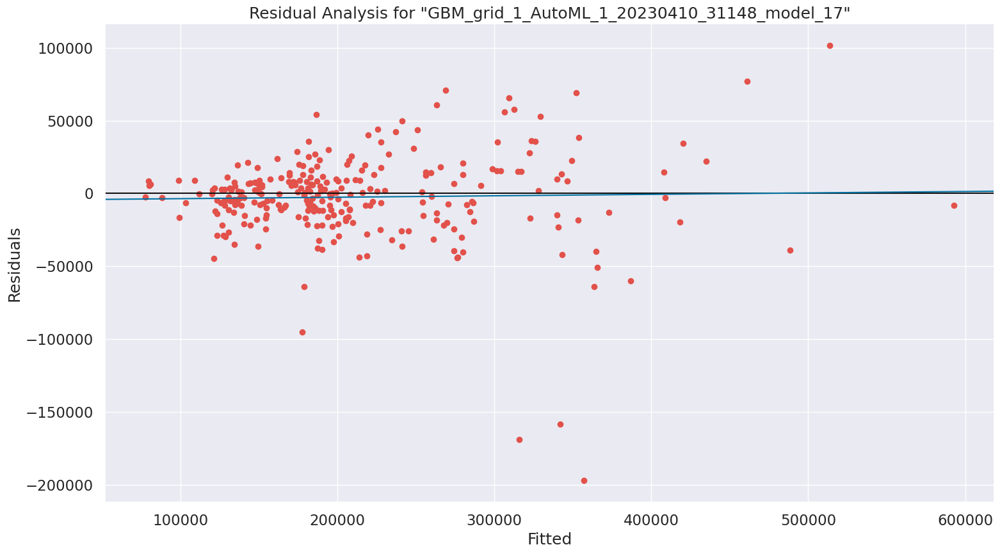

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

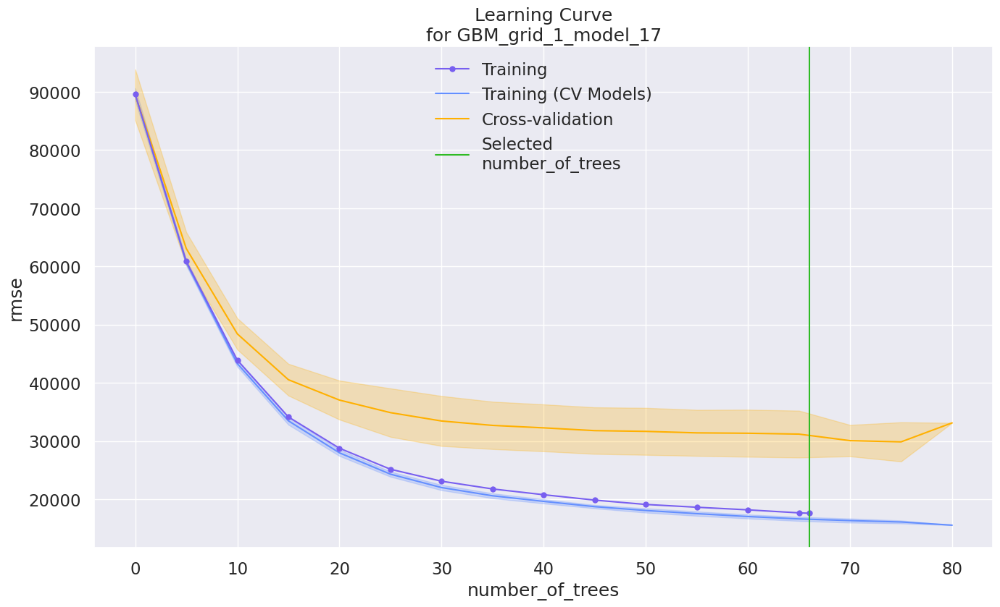

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

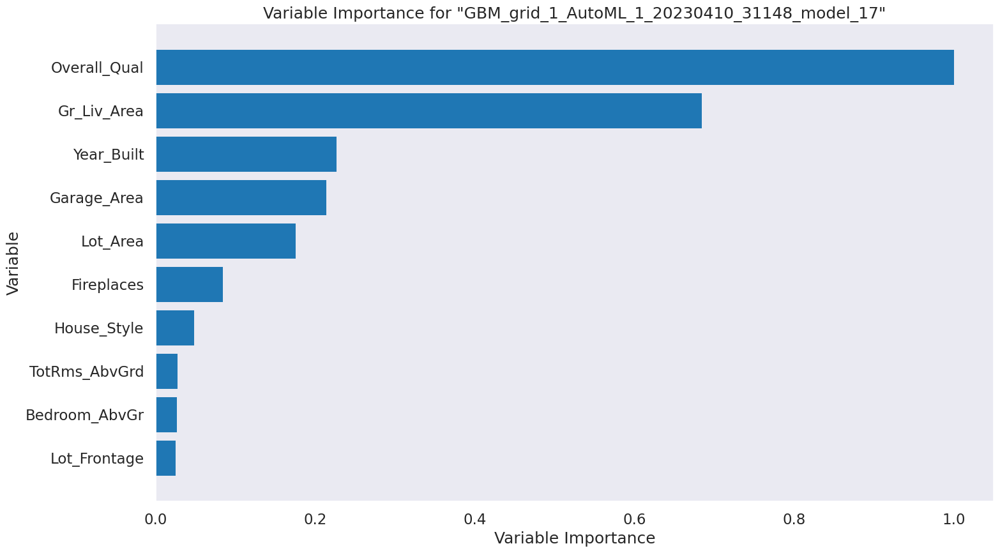

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

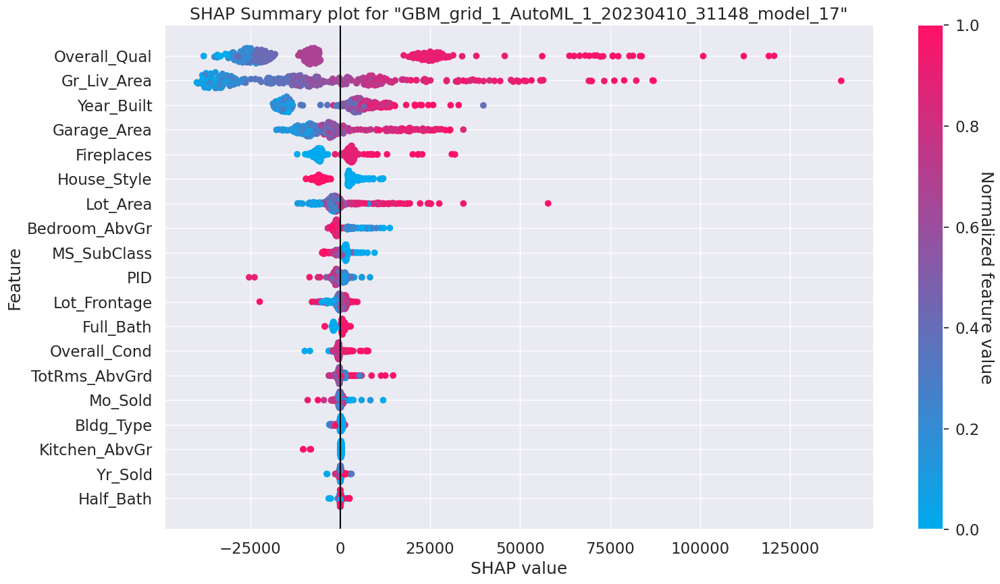

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

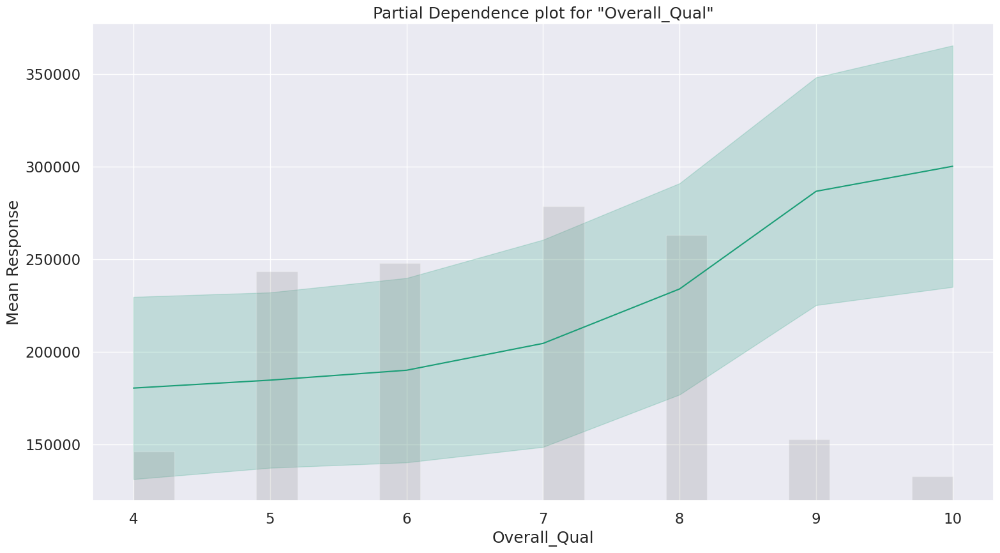

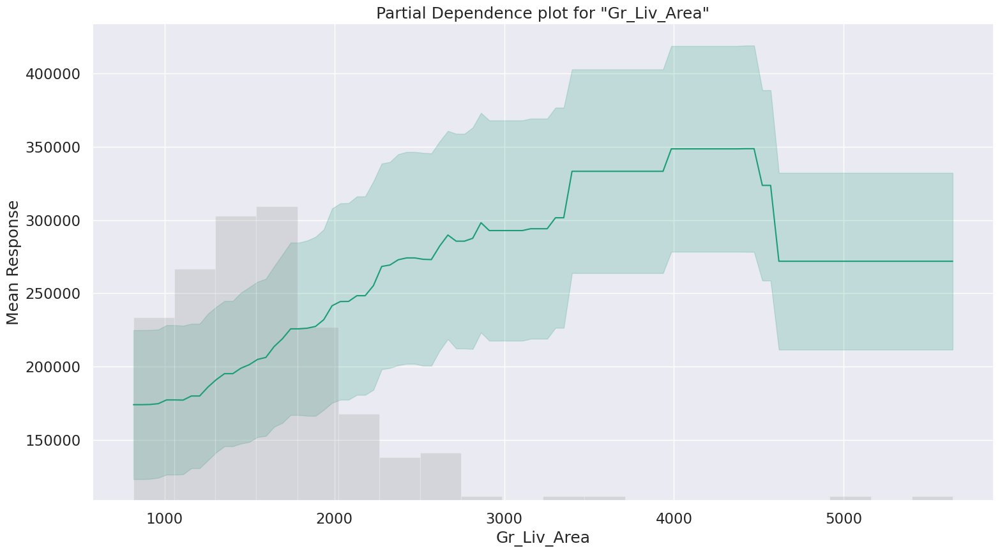

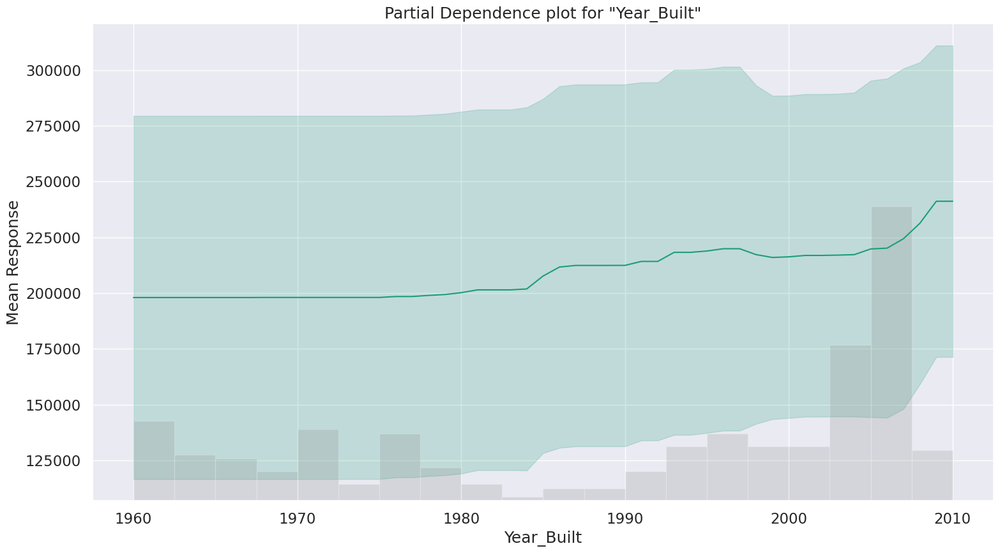

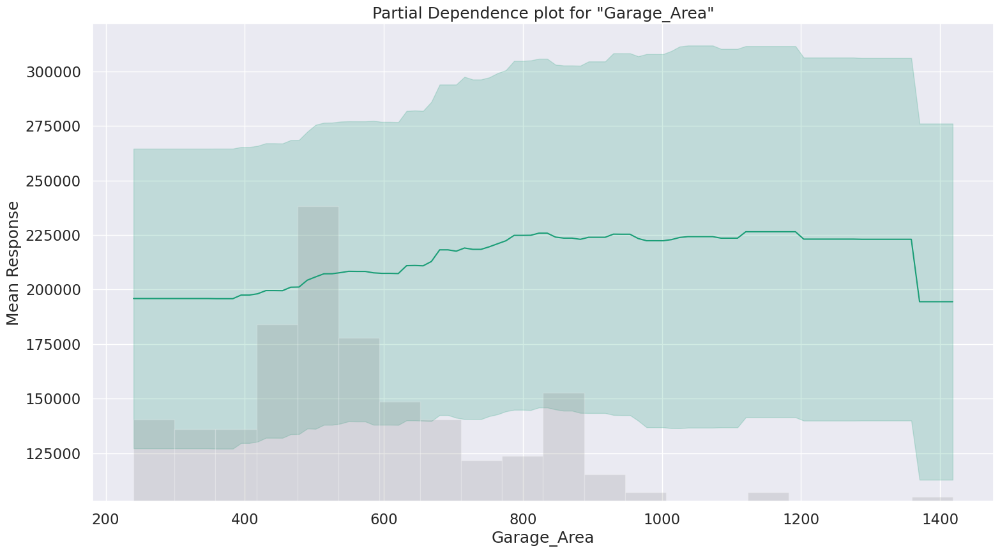

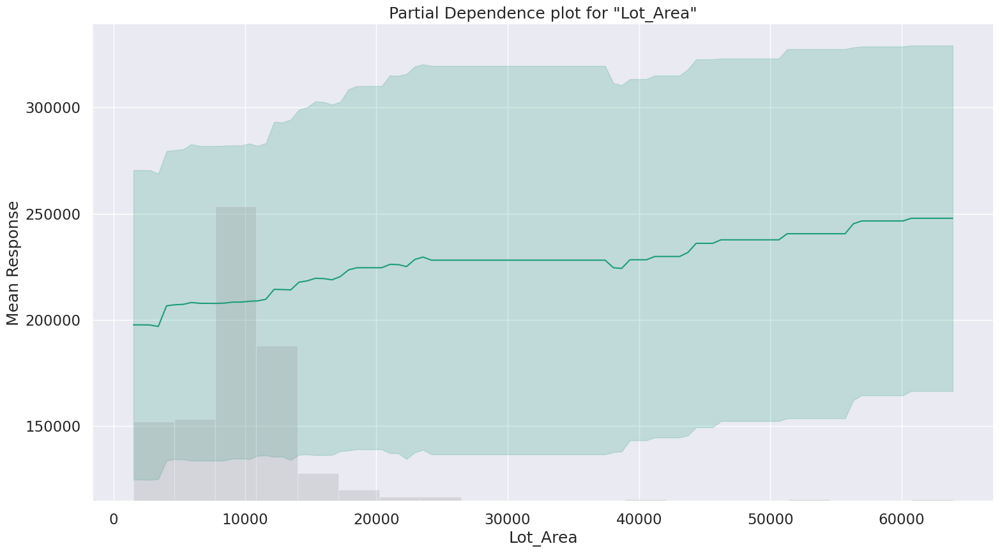

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

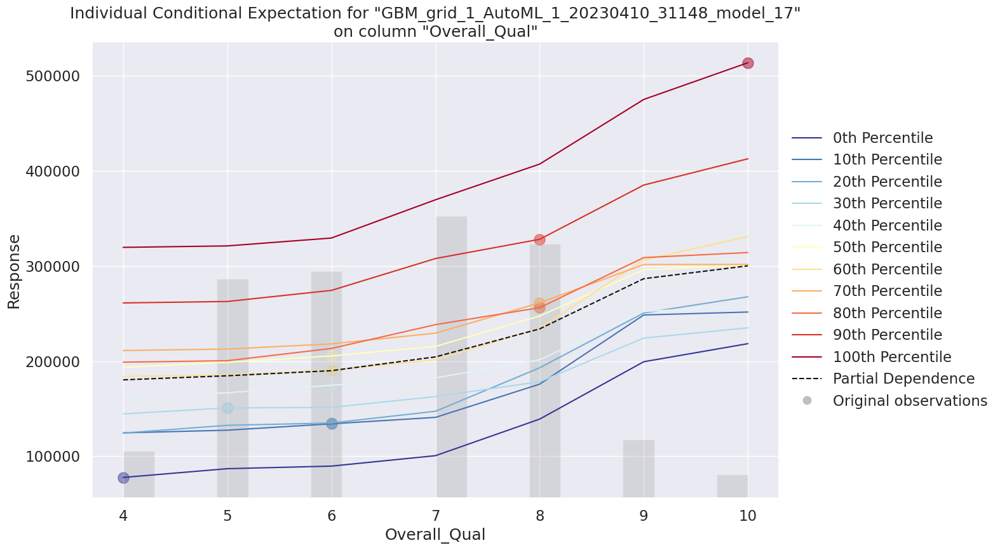

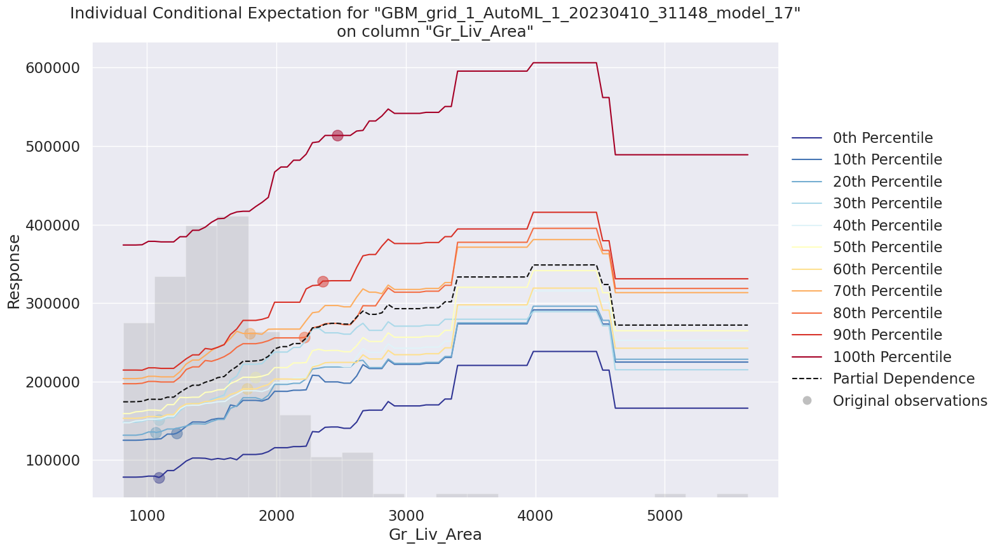

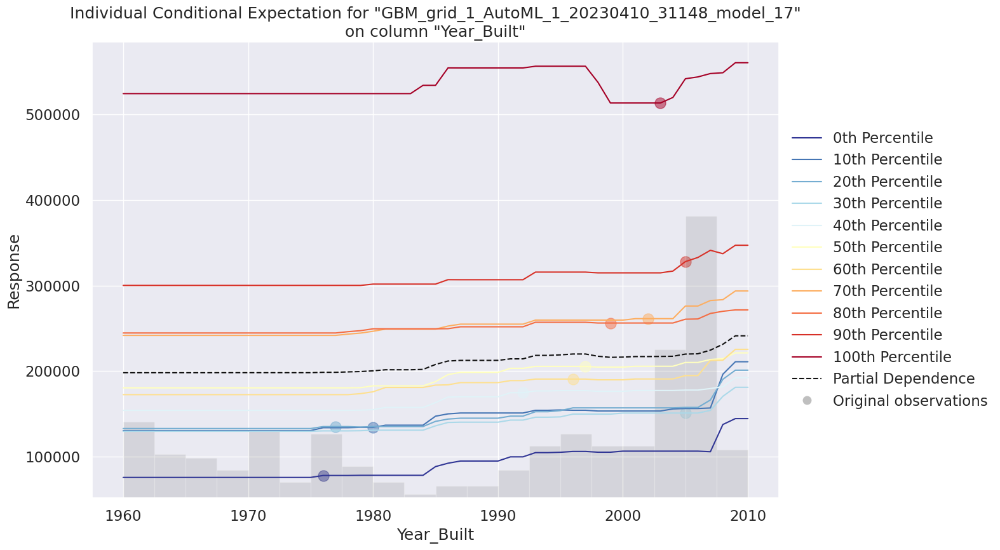

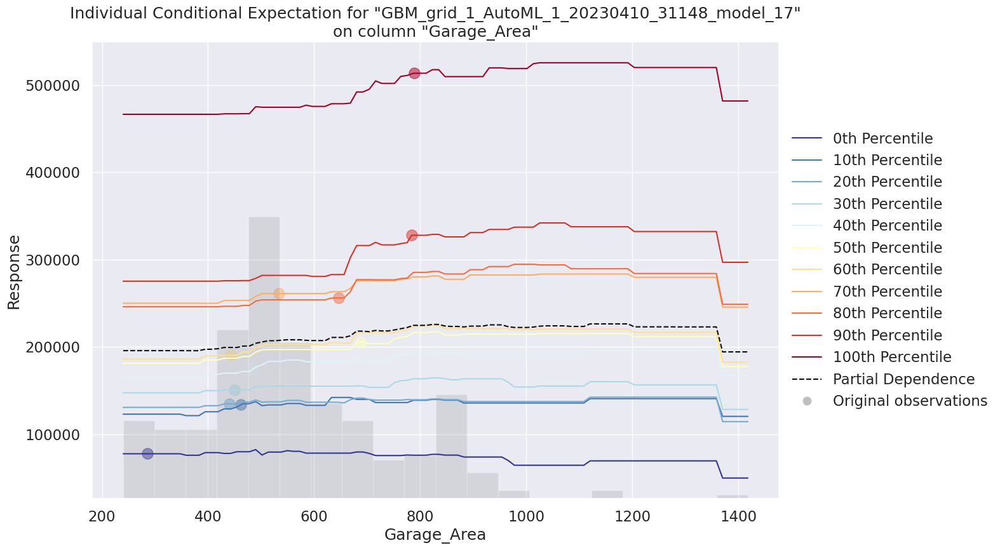

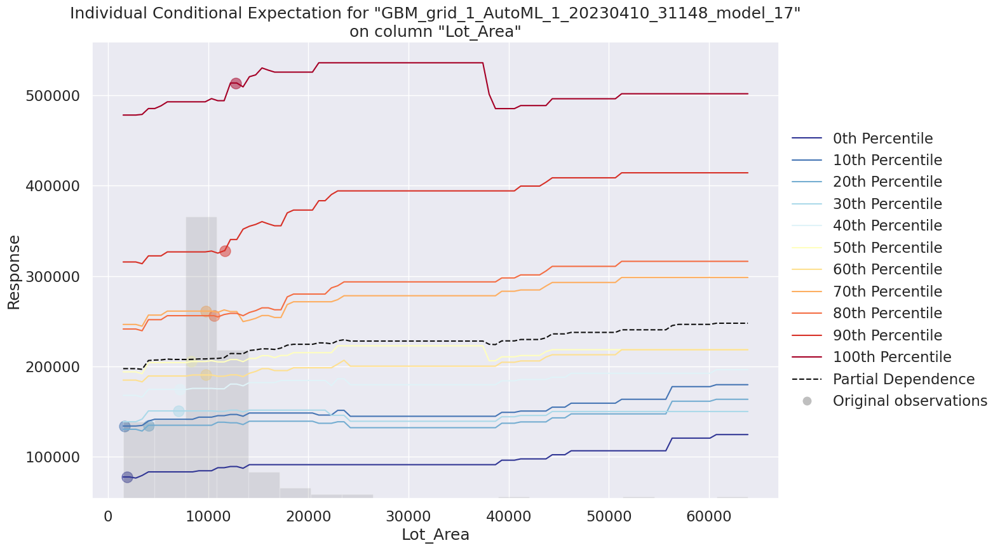

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

In [102]:
autoML_model.explain(autoML[1])  # AutoML Explainability

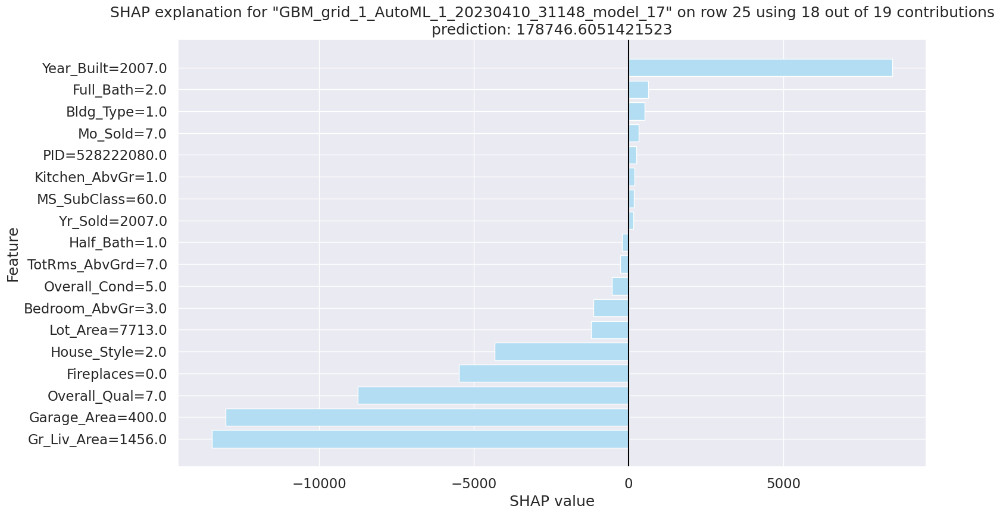

In [103]:
autoML_model.shap_explain_row_plot(
    autoML[1], 25
)  # Lets Analyze the 25th row in Test Data

Interpreting Best Model from AutoML

Residual Analysis

-If our plot has a random scattering of points, like in the graph above, it tells us that a linear model is a good choice for the data

Variable Importance

-In the variable importance plot we can observe that the plot replicates the results which we got from the Linear Model and Tree-Based Model above. The variable importance has been scaled between 0 to 1 for ease of understanding

SHAP Summary

From the SHAP summary diagram, we can interpret a few conclusions -

1.All the features are listed as per their importance in making the prediction, that is Overall_Qual is more significant followed by Gr_Liv_Area, and so on

2.The position on the SHAP value axis indicates the impact the feature has on the prediction either positive or negative. That is, the more the data point is away from the 0.0 shap value - the more its impact is. As we can see Overall_Qual has the most impact on the SalePrice of our house. The color of the dot represents (Red - High, Blue - Low) the impact of the value on the result. As we can see the distribution of red points in the Overall_Qual feature is far more spread than the blue points. From this visual, we can interpret that the SalePrice increases as the Overall_Qual increases. It doesn't have much impact if the content is low i.e. between the shap value of 0.4 to 0.6 the blue data points are pretty concentrated.

-The advantage of SHAP analysis over normal feature importance is that we could visualize how the feature is affecting the target at different values. The standard methods tend to overestimate the importance of continuous or high-cardinality categorical variables

Partial Dependence Plot (PDP)

A partial dependence plot shows the marginal effect of a feature on the target(SalePrice in our dataset). It is achieved by keeping all other variables constant and changing the value of one variable to get its PDP.

For Interpretation purposes, let us pick up the two most important variables - Overall_Qual and Gr_Liv_Area.

As we can see that when the rest of the variables are kept constant and a marginal change is made in Overall_Quall, we can see the mean response increases between overall_quall levels of 6 to 9. This could be interpreted as this range of Overall_Quall could be the deciding factor in the SalePrice of House.

Similarly when the rest of the variables are kept constant and a marginal change is made in Gr_Live_Area we can observe the mean response of feature is changing but is linear which means as the gr_liv_area for a house changes the saleprice changes, which makes sense more the area more will be the housing price less the area low will be the sales price. Hence, it can be interpreted that this feature is deciding factor in the SalePrice of our house.

The computation of partial dependence plots is intuitive: The partial dependence function at a particular feature value represents the average prediction if we force all data points to assume that feature value.

** ICE (Individual Conditional Expectation) Plot**

ICE plot is similar to what we did in the PDP plot, but the fundamental difference between the two methods is that the PDP plot focuses on the average effect of a feature and does not focus on a specific instance. ICE plot comes in rescue to address this drawback of the PDP plot where the outputs from all instances are considered instead of an average value.

Let us go back to the Overall_Qual and Gr_Liv_Area features, as we interpreted in PDP the SalePrice increases when Overall_Quall and Gr_Liv_Area value is between 6 to 9. But is this true for every house in the dataset? ICE plot has an answer to this question. As we can see in the ICE plot (0th percentile instance) increases in this range while the a few doesn't change much(100th Percentile Instance) for overall_quall.

Individual conditional expectation curves are even more intuitive to understand than partial dependence plots. One line represents the predictions for one instance if we vary the feature of interest.

**SHAP Analysis for Linear and Tree-Based Model**

Here the x-axis is the feature and the y-axis is the output as we vary the feature. The grey histogram is the distribution of variables in the dataset and the cross made by E[Feature], E[f(x)] is the expected values.

Let us take a feature of Lot_Area

For the linear model the cross is made at approx E[f(x)] 208500

For Tree-based model the cross is made at approx E[f(x)] 211000

So as the Lot_Area increases the expected value also increases

Talking about the red line on the plot - When we give a sample as an input (sample_ind = 18) as an input to check the output.

By plotting this we can see the difference between the model output from the expected value.

Permutation explainer: 1216it [01:16, 14.98it/s]


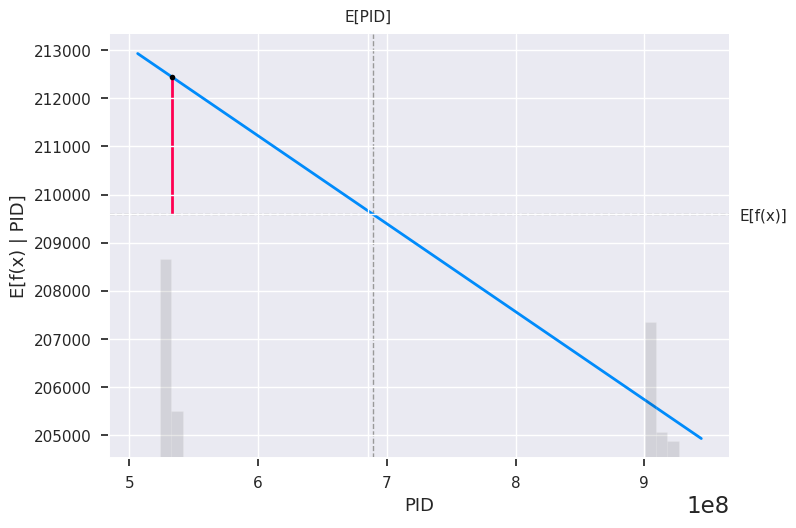

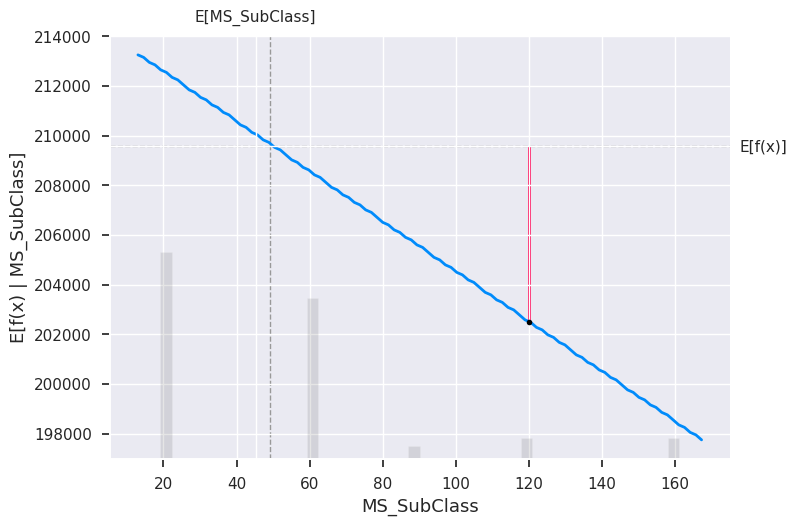

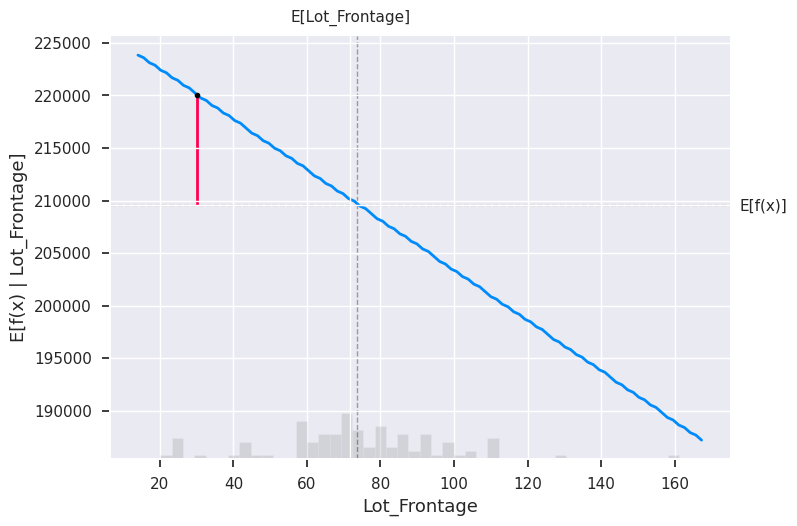

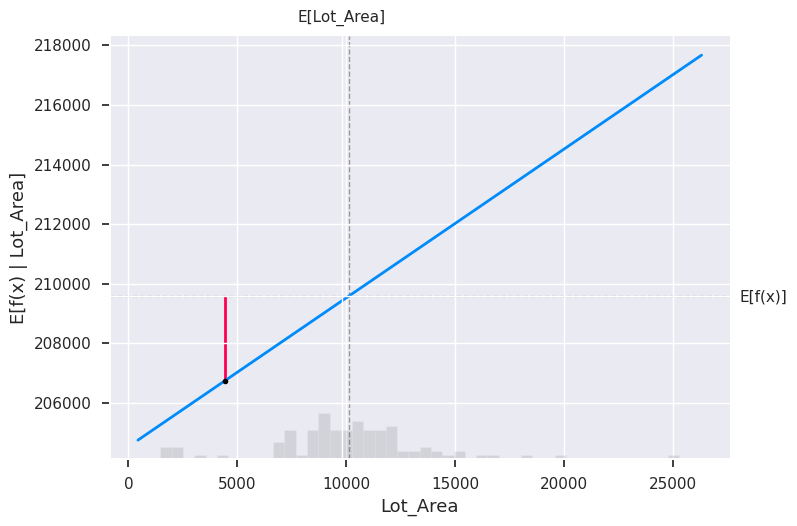

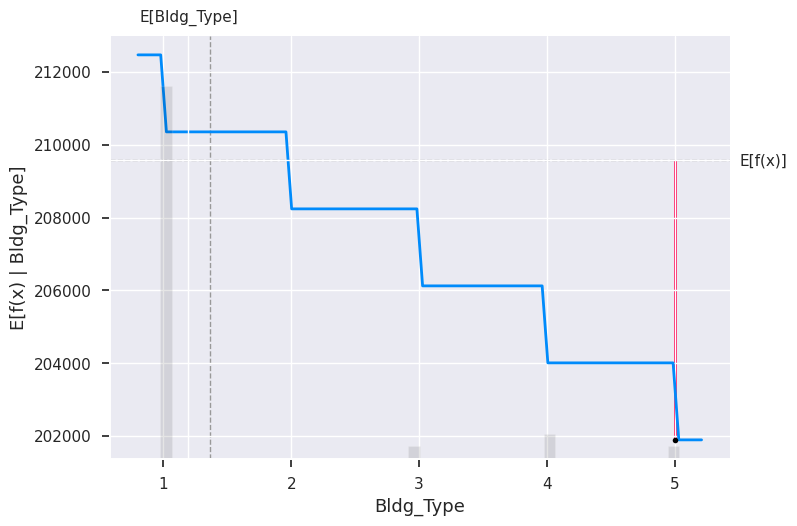

...

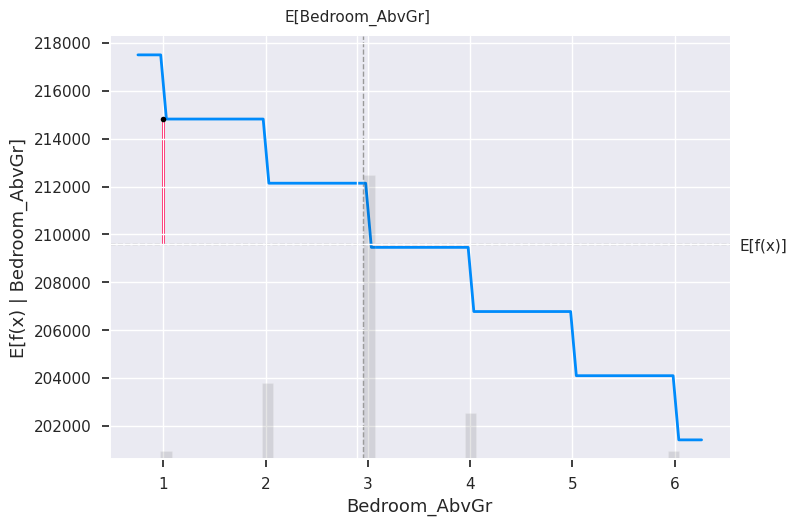

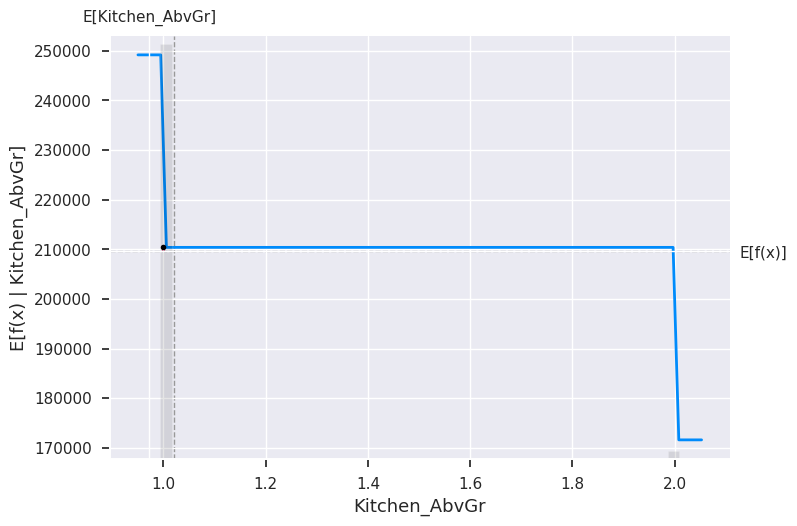

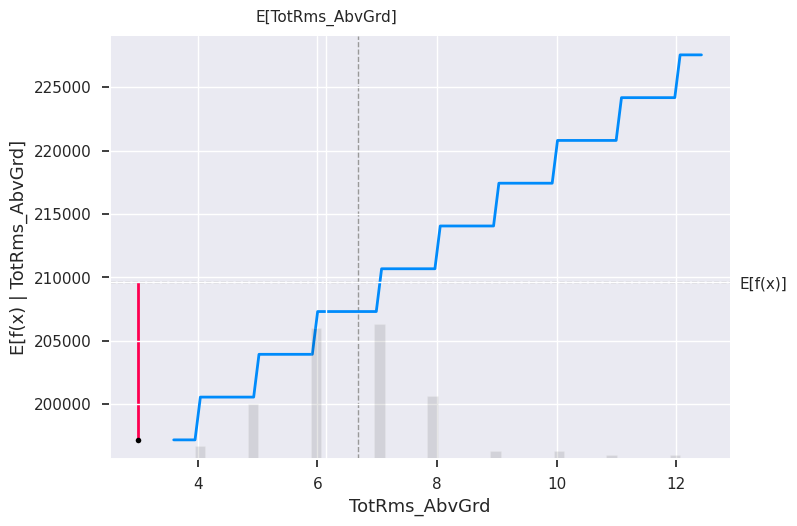

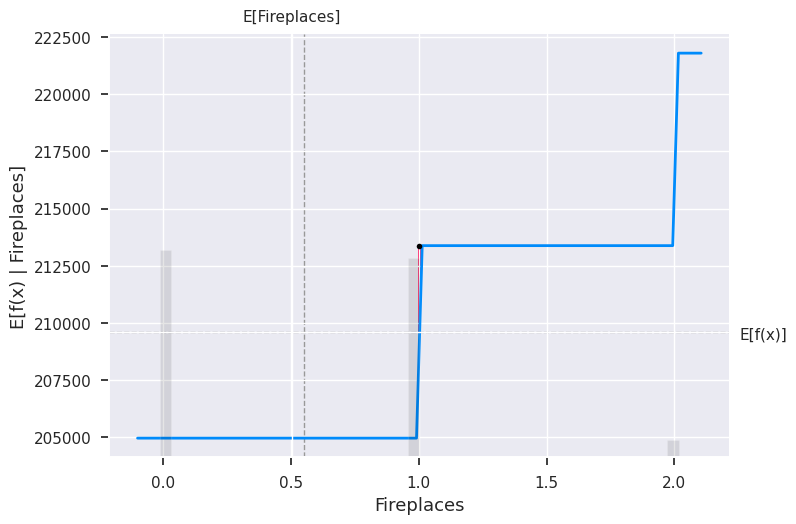

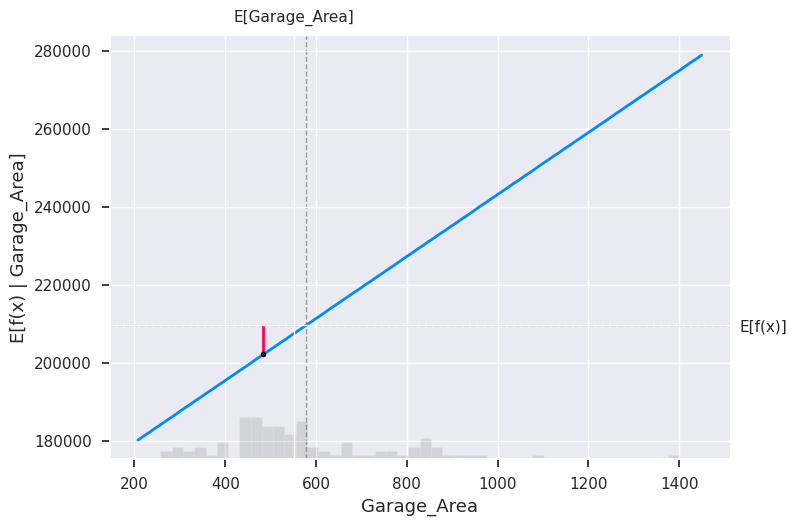

In [104]:
# SHAP explanation of a Linear Model
linear_explainer = shap.Explainer(linear_model.predict, x_train_100)
linear_shap_values = linear_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        linear_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=linear_shap_values[sample_ind : sample_ind + 1, :],
    )

Permutation explainer: 1216it [01:25, 13.14it/s]


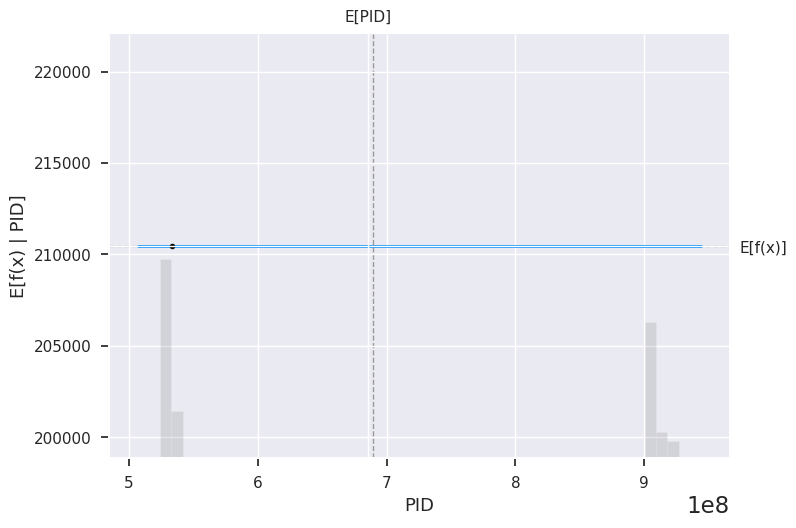

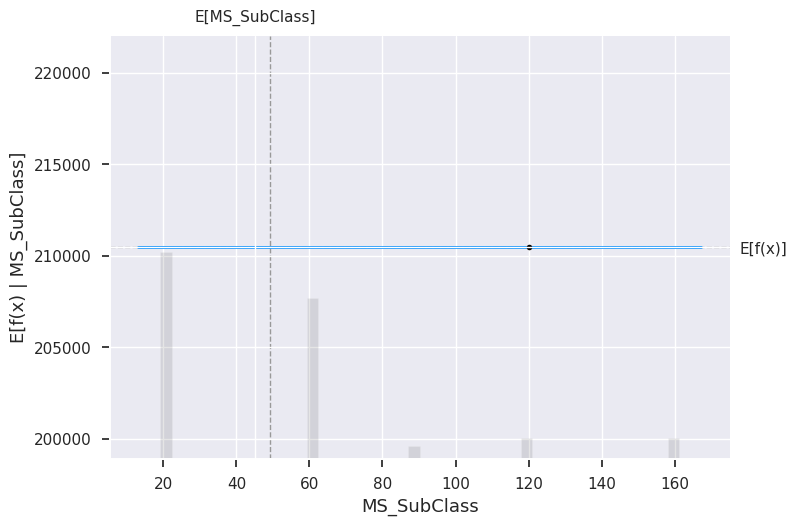

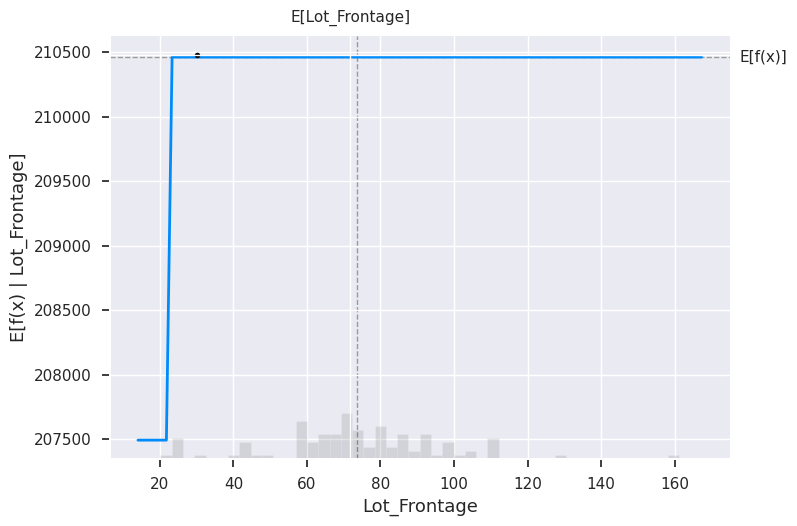

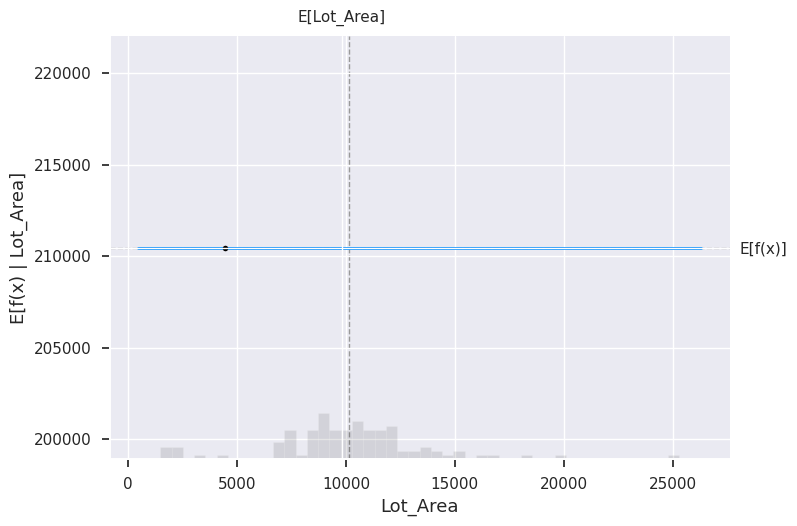

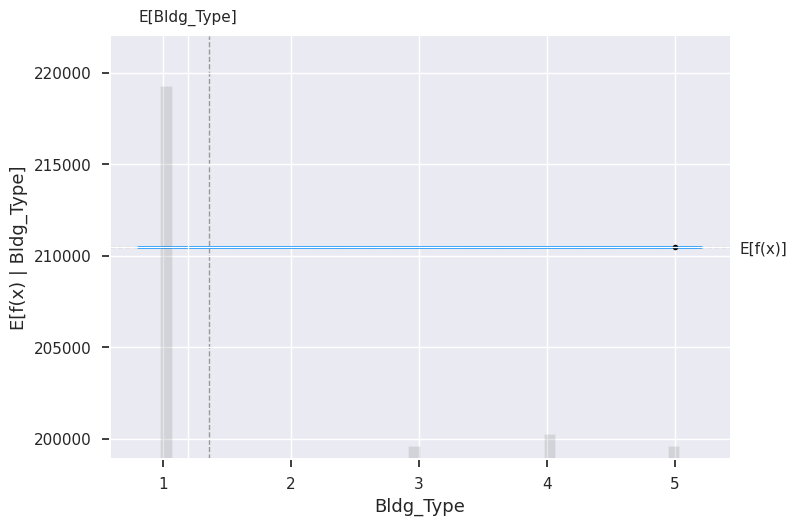

...

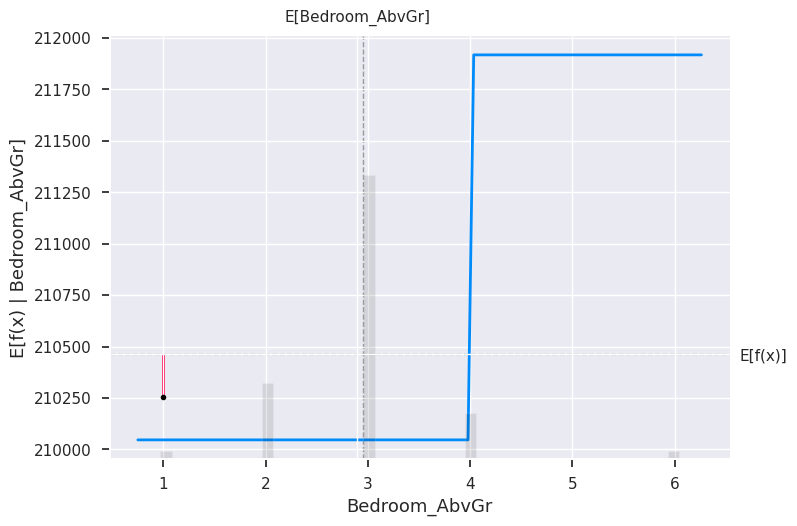

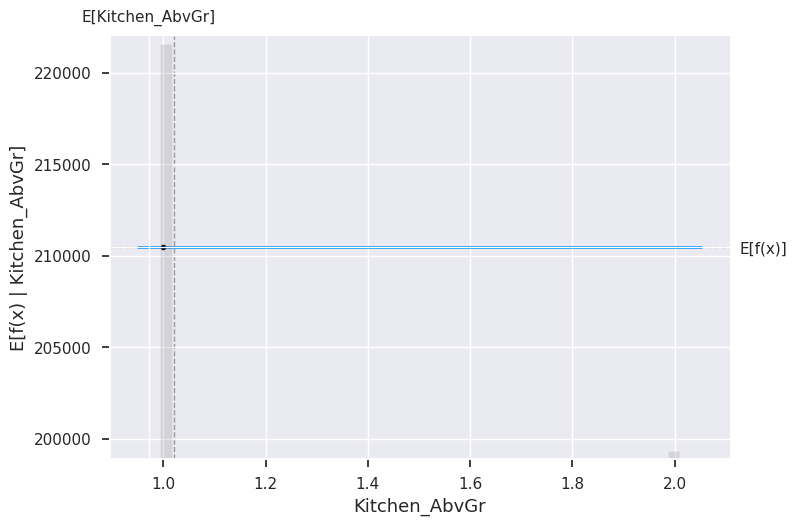

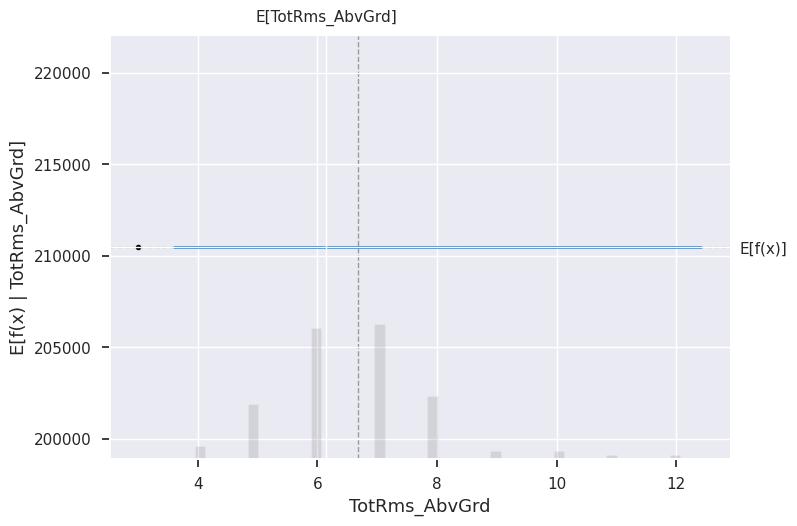

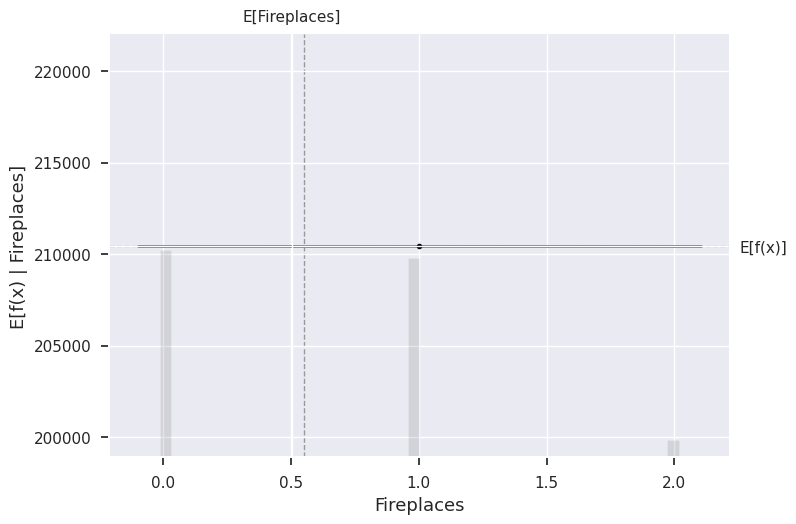

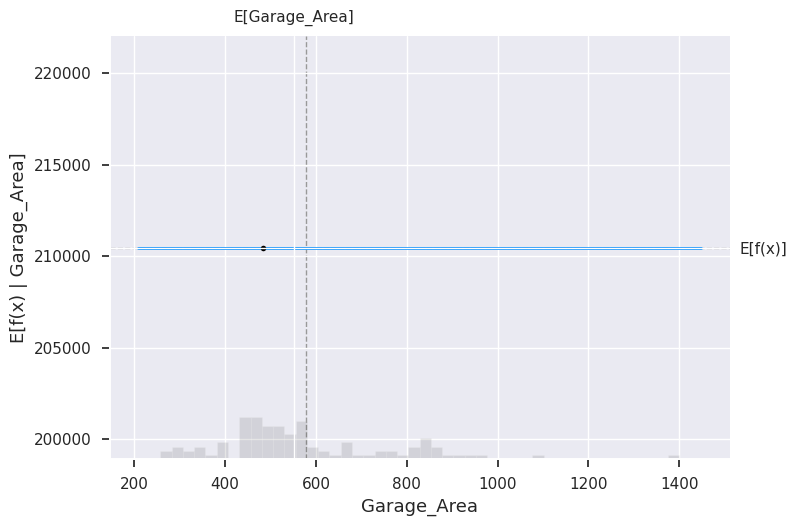

In [105]:
# SHAP explanation of a tree based model
tree_explainer = shap.Explainer(tree_model.predict, x_train_100)
tree_shap_values = tree_explainer(x_train)
for i in x_train.columns:
    # make a standard partial dependence plot
    sample_ind = 18
    shap.partial_dependence_plot(
        i,
        tree_model.predict,
        x_train_100,
        model_expected_value=True,
        feature_expected_value=True,
        ice=False,
        shap_values=tree_shap_values[sample_ind : sample_ind + 1, :],
    )

**Interpreting SHAP Feature Importance Plot for Linear and Tree-based model**

The idea behind SHAP feature importance is simple:

Features with large absolute Shapley values are important.

Since we want global importance, we average the absolute Shapley values per feature across the data. Next, we sort the features by decreasing importance and plot them.

The following plots are

1.SHAP feature importance for a linear model

2.SHAP feature importance for tree-based model

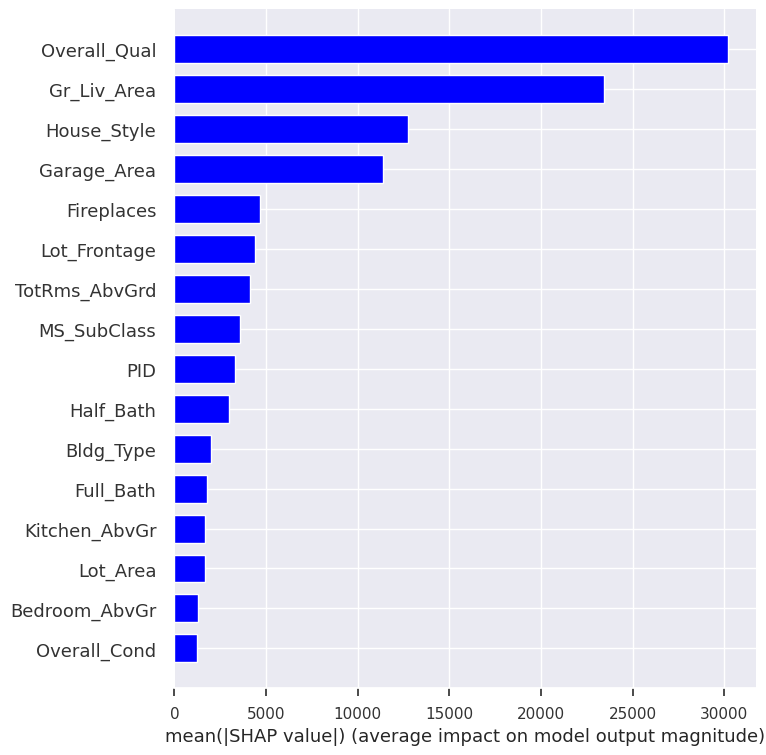

In [106]:
# SHAP variable importance for a Linear Model
shap.summary_plot(linear_shap_values, x_train, plot_type="bar", color="blue")

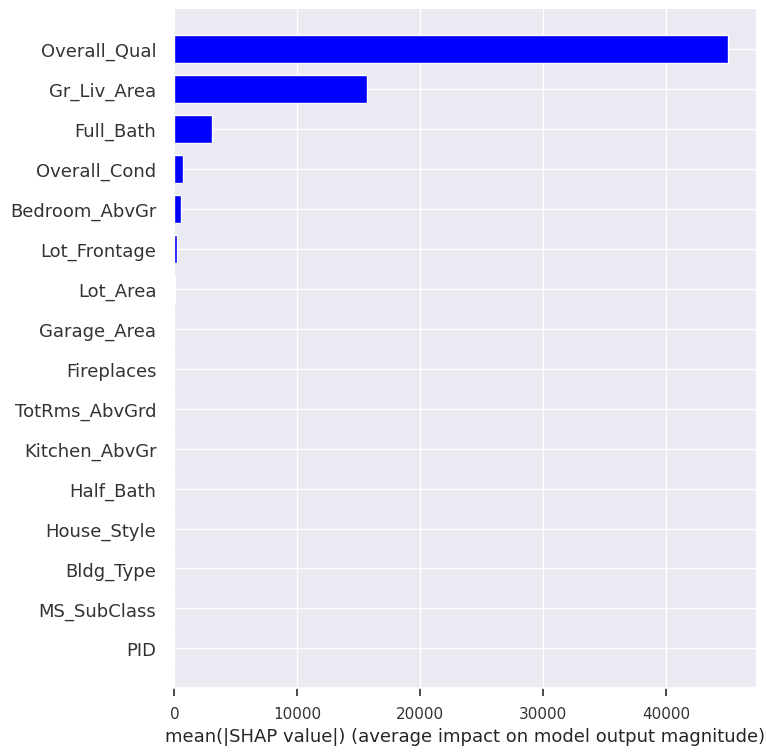

In [107]:
# SHAP variable importance for Tree based model
shap.summary_plot(tree_shap_values, x_train, plot_type="bar", color="blue")

**Interpreting Waterfall SHAP visualization**

Let's consider the same sample (sample_ind = 18)

Notice the value of Lot_Area in the waterfall model is different as what we have in SHAP partial dependence plot.

It says that f(x) = 186652.403 is what we got as a model output and the expected output for this sample was 209594.935. Which almost has a difference ofn 22,942. The waterfall model explains how we got the expected output, and which features contributed to what. The below graph shows that Overall_quall has the biggest and most positive impact in increasing the SalePrice of house by 36213.1 for this specific sample. n. Using this model we can visually interpret why exactly this specific sample is giving the ouput



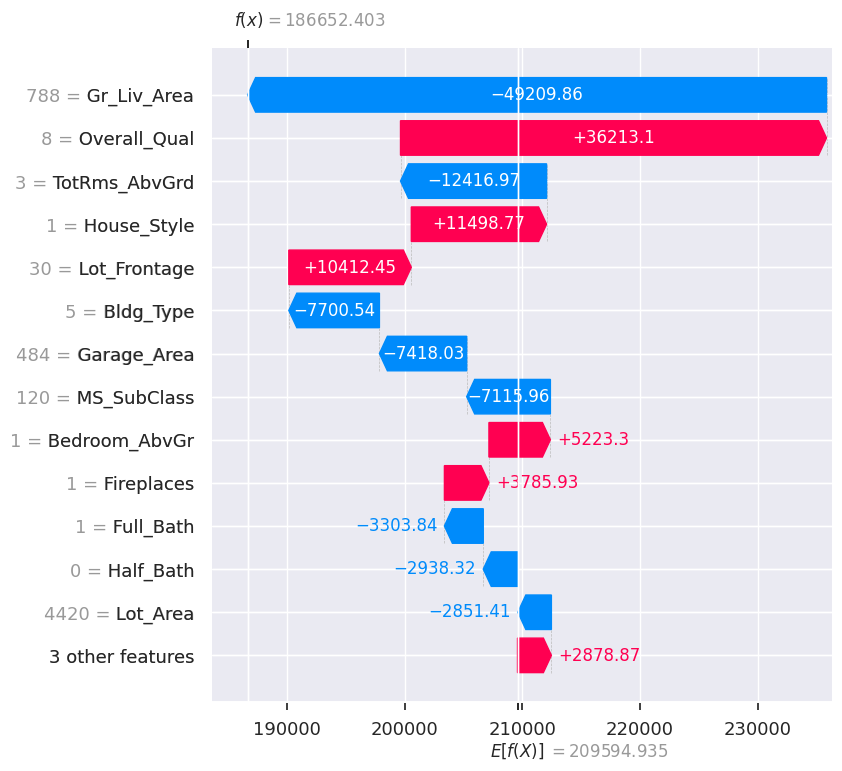

In [108]:
# Waterfall plot for linear model
shap.plots.waterfall(linear_shap_values[sample_ind], max_display=14)

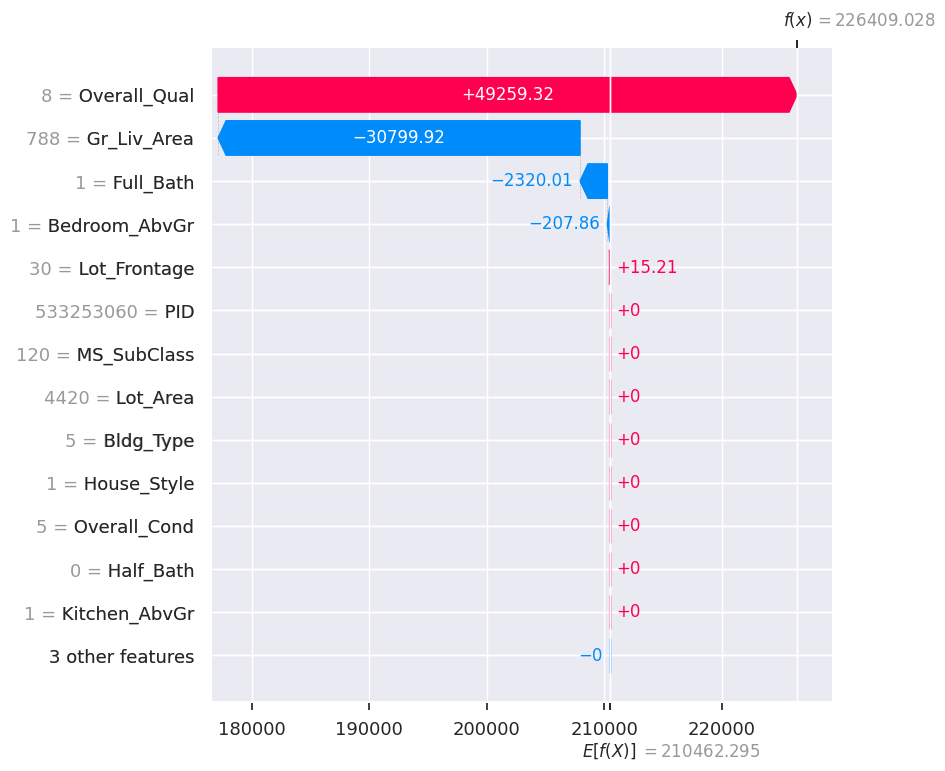

In [109]:
# Waterfall plot for Tree Based Model
shap.plots.waterfall(tree_shap_values[sample_ind], max_display=14)

**Interpret the summary plot for the Linear and Tree-based model**

Here the features are listed in descending order of their importance. This is one of the easiest ways to analyze an ML model and how the features are affecting the target and to what extent.

Each dot(both red and blue) represents a feature of a House.

Red color represents high values whereas blue color represents low value

If a dot is on the right side of the y-axis then it had a positive impact and if it is on the left side of the axis it had a negative impact

The position of a dot on the x-axis represents the intensity of impact it had, the more it is away from the axis greater the intensity.

Let us try to understand how both models are performing side by side

Higher value of Overall_Qual tends to have a positive impact on the SalePrice of the house

Lower values of Gr_Liv_Area tend to have a positive impact on the SalePrice of the house.

Higher values of House_Style tends to have a positive impact on the SalePrice of the hpuse.

Lower value of garage_area tends to have a positive impact on the SalePrice of House, and so on.

This visualization is very useful when it comes to interpreting how our model is working.

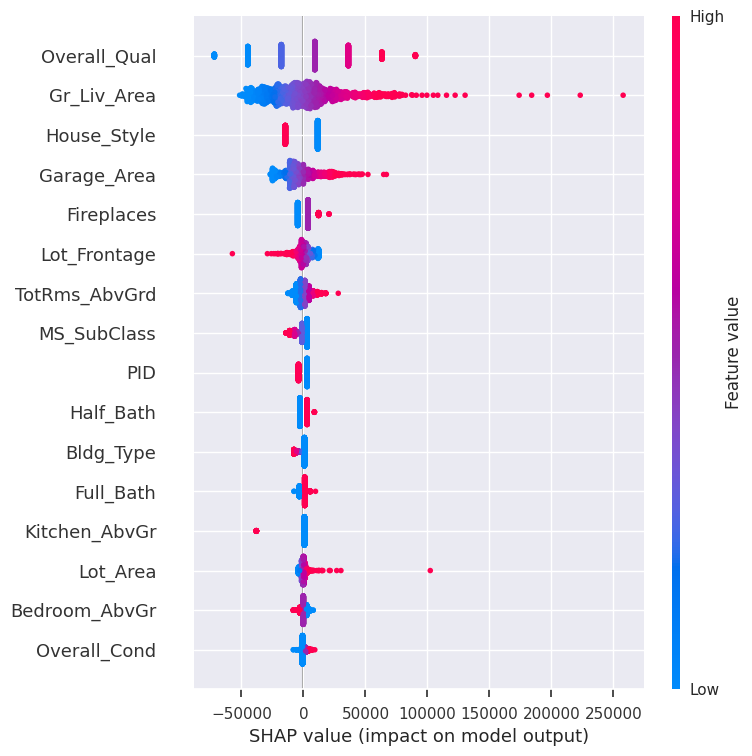

In [110]:
# SHAP summary for Linear Model
shap.summary_plot(linear_shap_values, x_train)

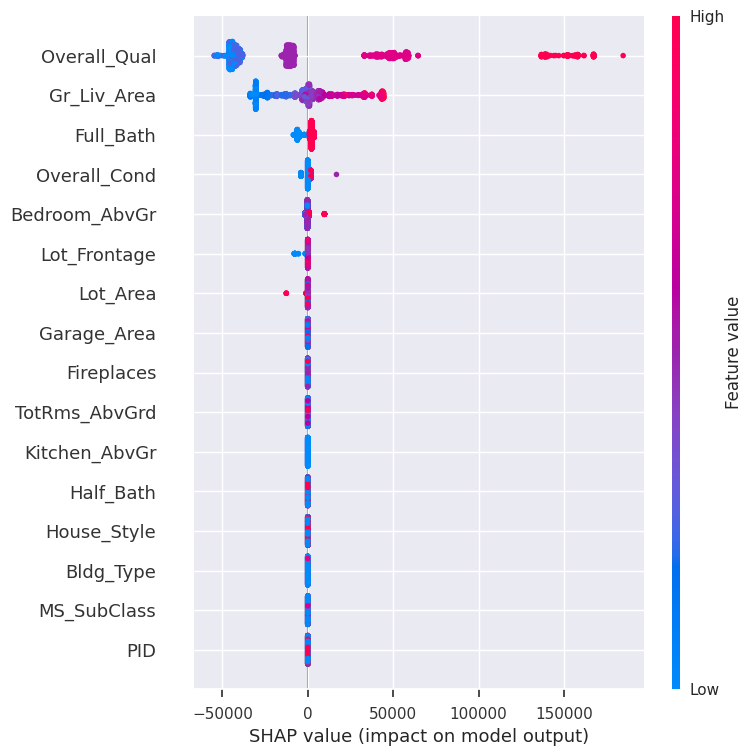

In [111]:
# SHAP summary for Tree Based Model
shap.summary_plot(tree_shap_values, x_train)

**Interpreting SHAP dependence plot for Linear and Tree-based model**

The SHAP dependence plot shows the marginal effect one or two features have on the predicted outcome of a machine learning model. It tells whether the relationship between the target and a feature is linear, monotonic, or more complex. Let us interpret the linear and Tree-based models using the SHAP dependence plot. Here in these graphs, we get a dot for every feature in our dataset.

As we can observe the linear model feature and its SHAP value have a linear relationship. If a feature has a positive impact on the wine quality then the relationship will be directly proportional

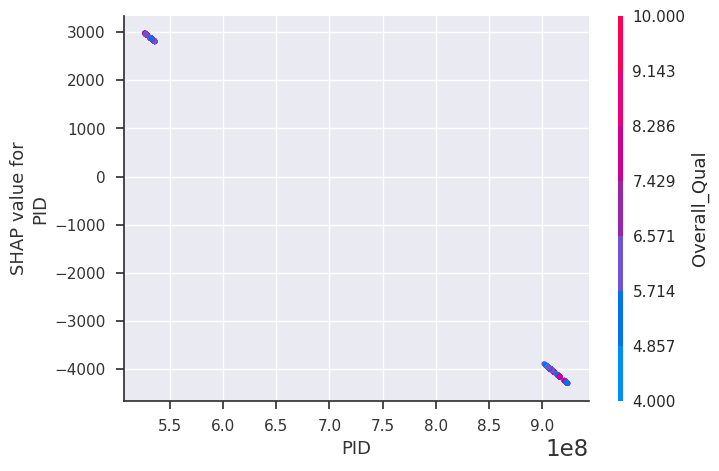

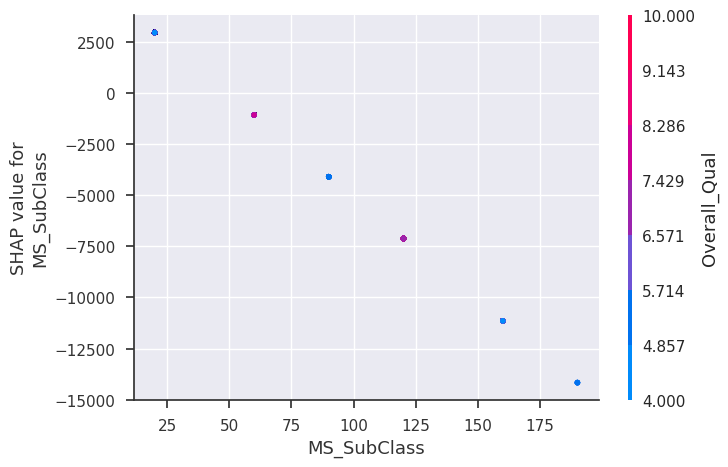

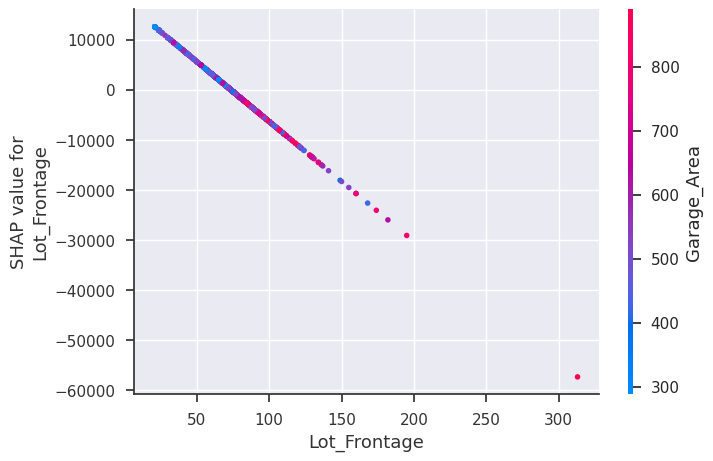

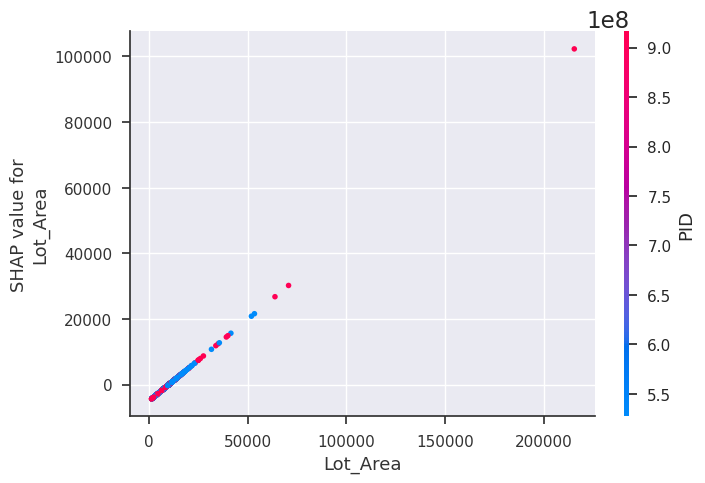

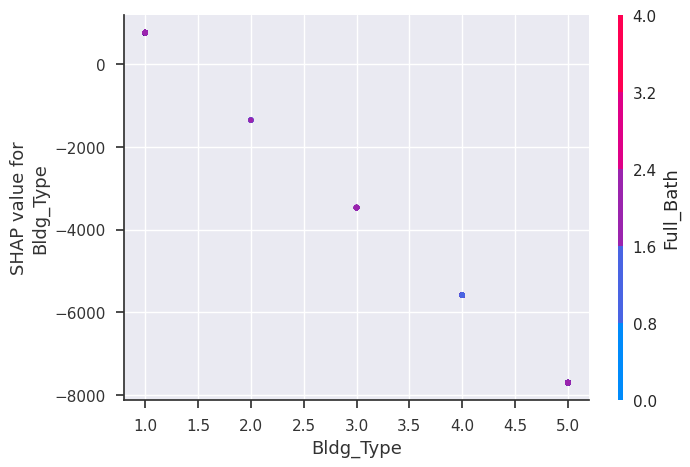

...

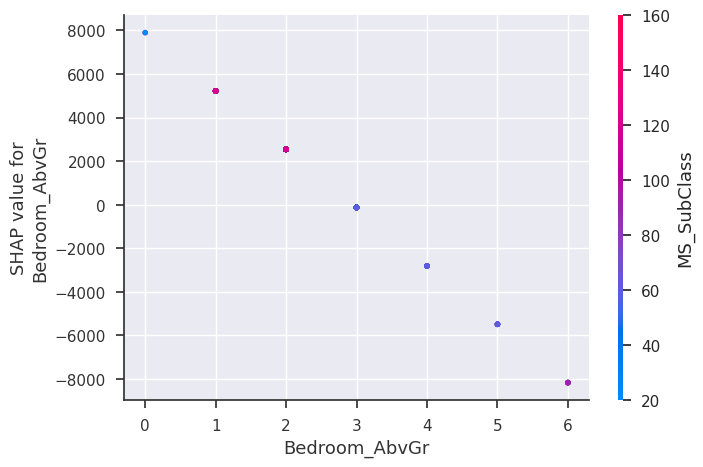

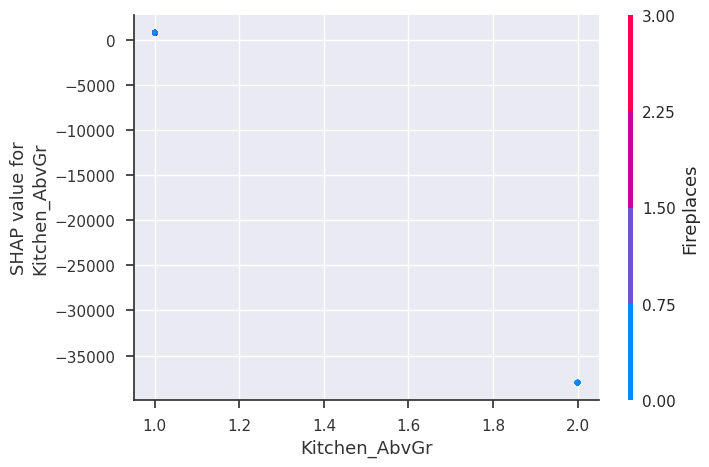

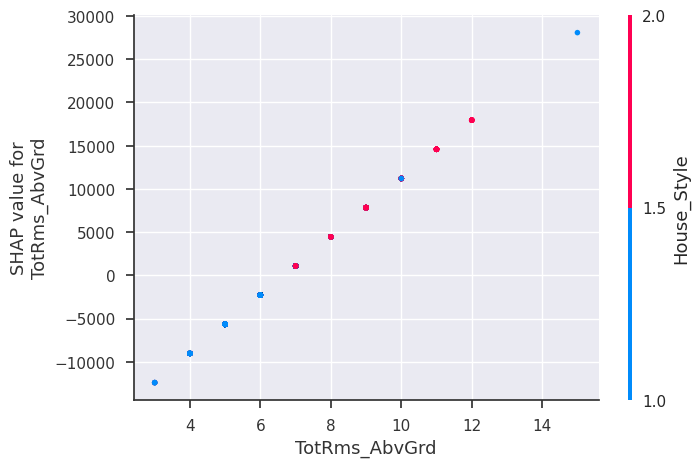

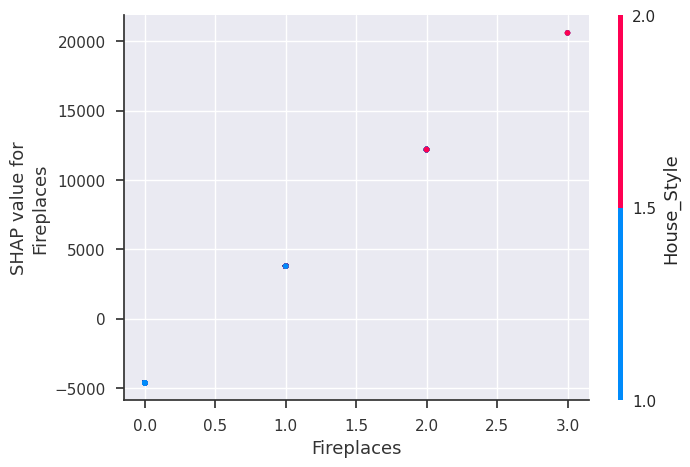

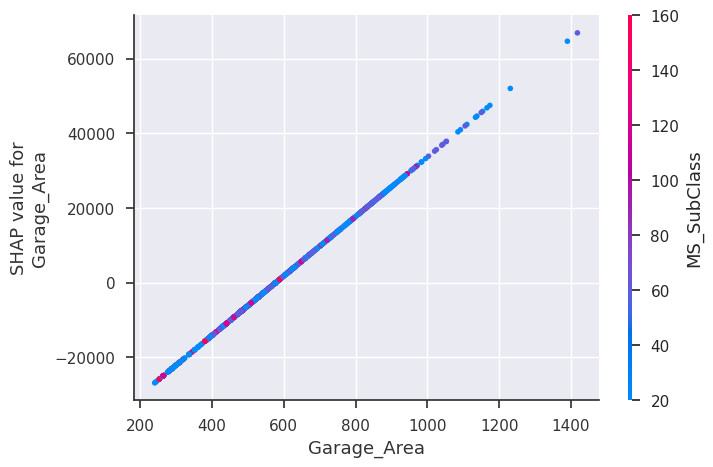

In [112]:
# SHAP partial dependence plot for linear model
for i in x_train.columns:
    shap.dependence_plot(i, linear_shap_values.values, x_train)

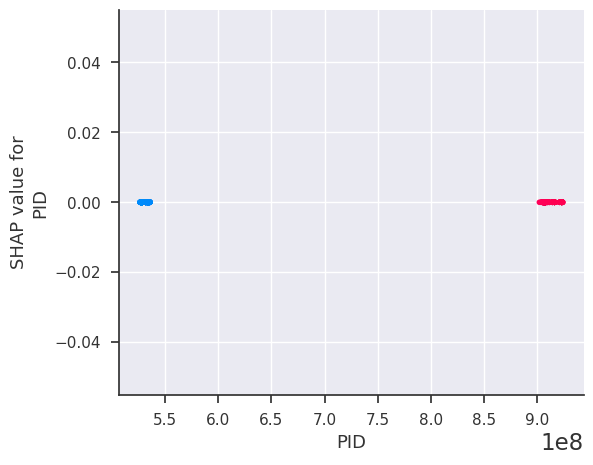

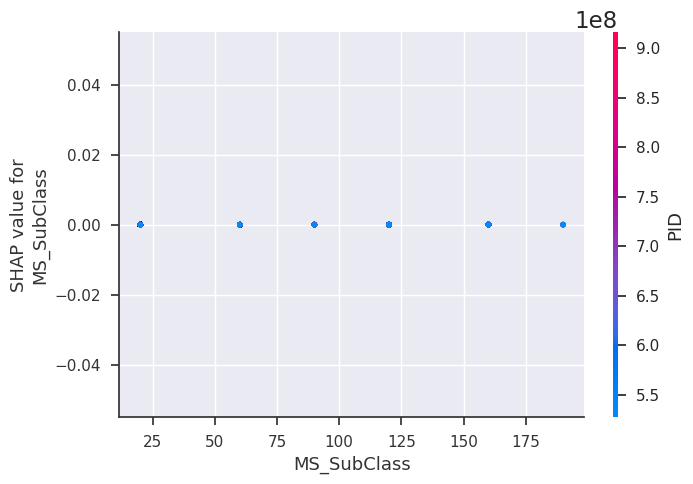

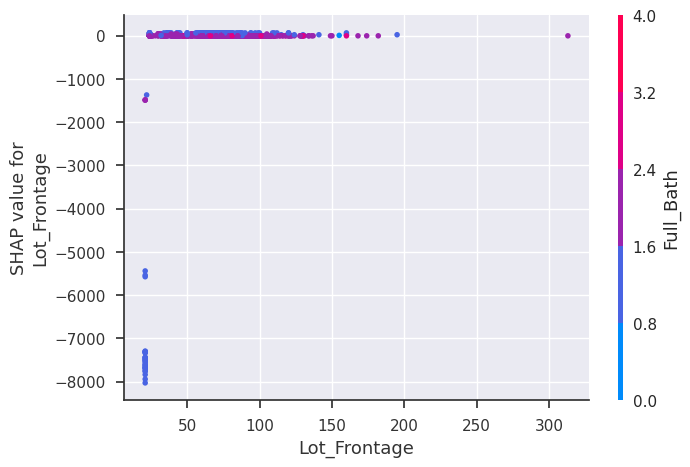

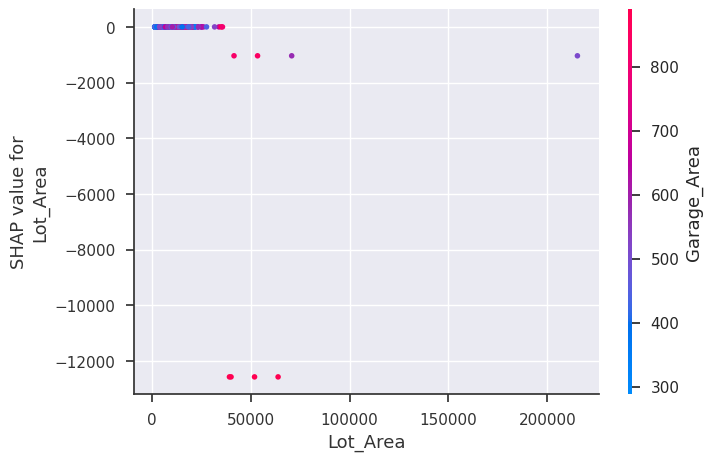

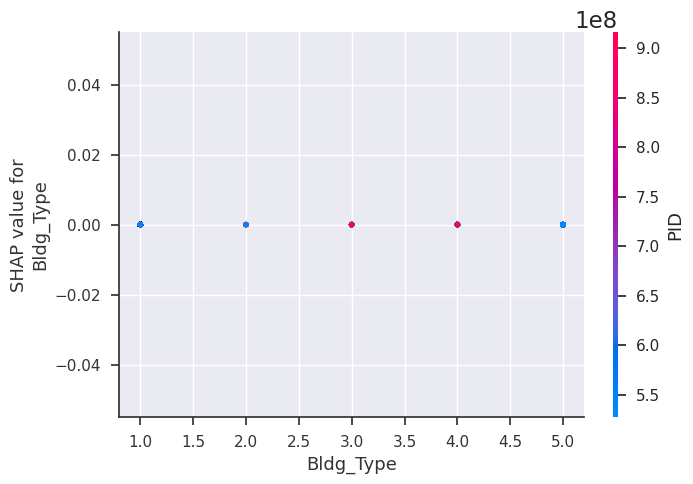

...

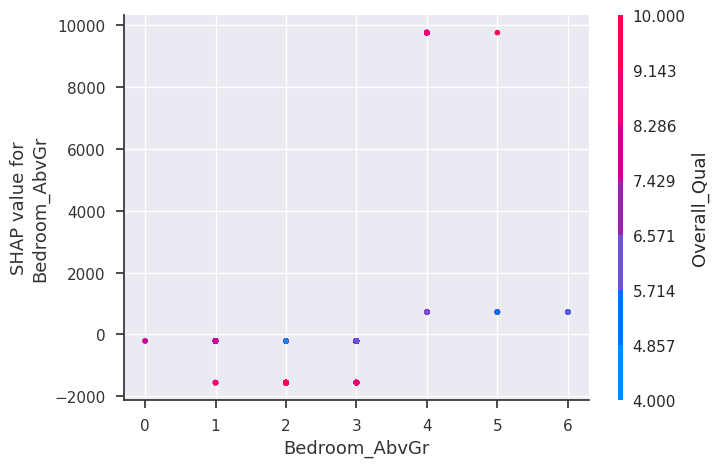

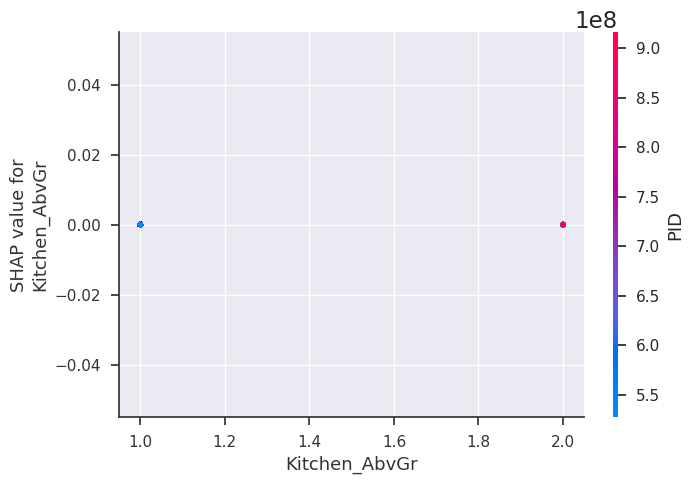

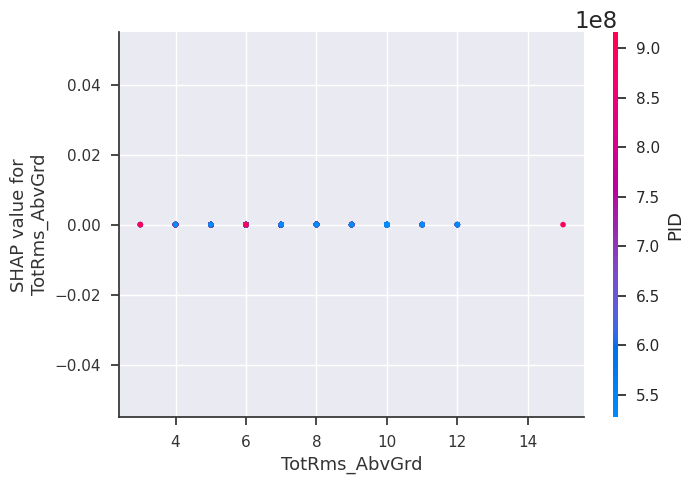

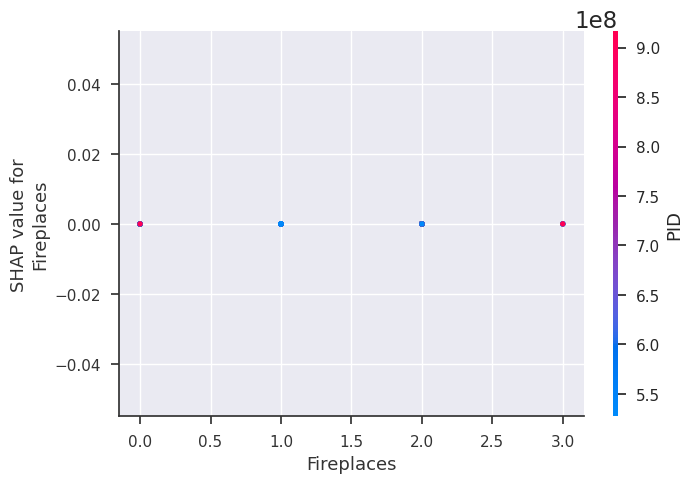

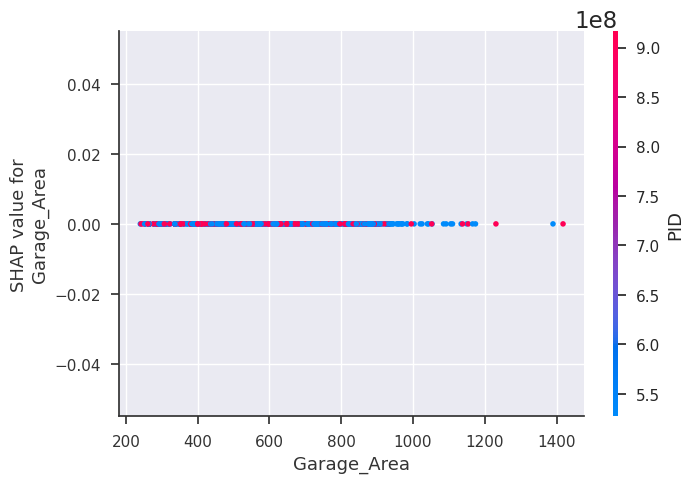

In [113]:
# SHAP partial dependence plot for a tree based model
for i in x_train.columns:
    shap.dependence_plot(i, tree_shap_values.values, x_train)

In [114]:
X_output_linear = x_test.copy()
X_output_linear.loc[:, "predict"] = np.round(
    linear_model.predict(X_output_linear), 2
)  # Attaching the output of linear model to test dataframe

X_output_tree = x_test.copy()
X_output_tree.loc[:, "predict"] = np.round(
    tree_model.predict(X_output_tree), 2
)  # Attaching the output of tree based model to test dataframe

In [115]:
# Force Plot of Tree Based Model
explainerModel = shap.TreeExplainer(tree_model)
shap_values_Model = explainerModel.shap_values(X_output_tree)


def shap_plot_tree(j):
    p = shap.force_plot(
        explainerModel.expected_value, shap_values_Model[j], X_output_tree.iloc[[j]]
    )
    return p

**Force Plot SHAP analysis**

In [116]:
shap.initjs()  # Initializing JavaScript module
print(shap_plot_tree(18))  # SHAP force plot for sample 18

**Heatmap Visualization for Linear and Tree-based model**

This visualization is a summarization of the entire dataset on how each data point in every feature is affecting the target(SalePrice).

-Here the Y-axis is Features and X-axis is Instance of that feature

-The color of the instance defines if it had a positive effect or negative effect by its color. If the instance is red then it had a positive effect and if the instance is blue then it had a negative effect

-The intensity of the color is directly proportional to the intensity of the effect. Deeper the color, the more impactful the feature is

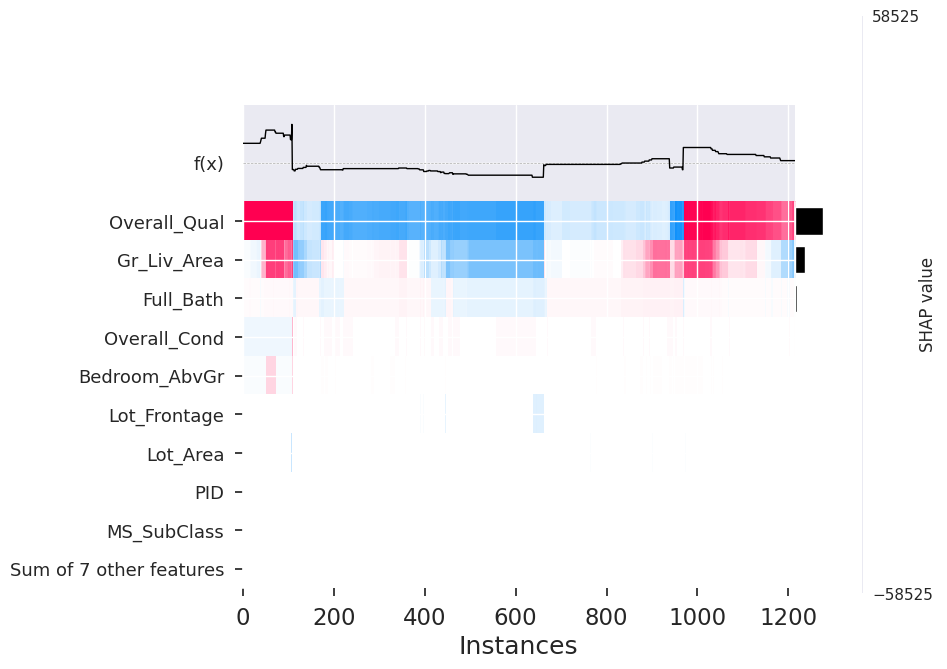

In [117]:
shap.plots.heatmap(tree_shap_values)  # SHAP HeatMap of a Tree Based Model

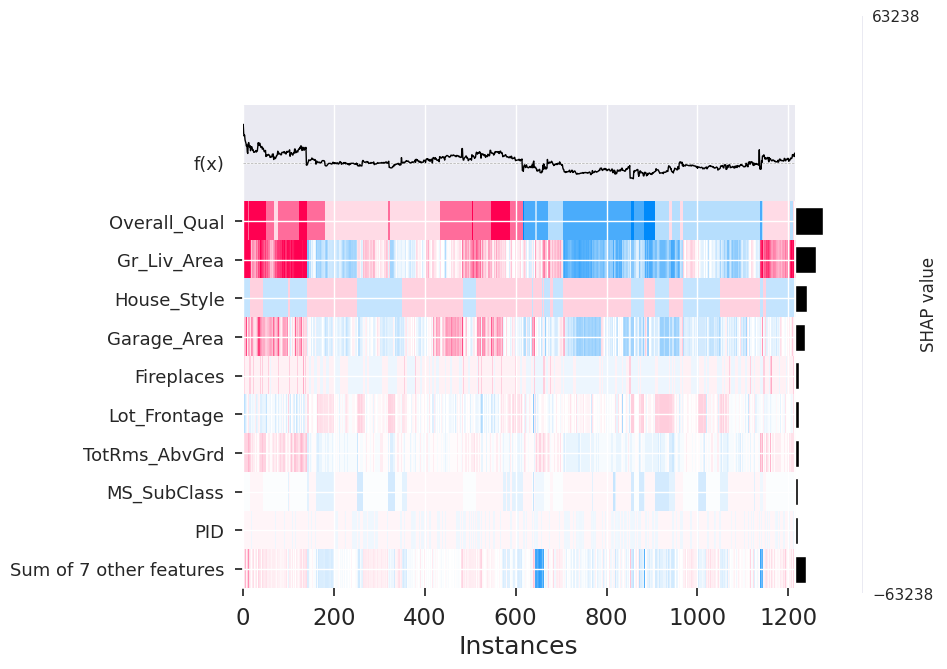

In [118]:
shap.plots.heatmap(linear_shap_values)  # SHAP heatmap for a Linear Model

LIME (Local Interpretation Model-Agnostic Explanation) Analysis

LIME builds a surrogate model, i.e. converts a more complicated model (say a deep tree-based model into a simple linear model) around the data points in which we are interested and then it will try to make an approximation out of this simple model on the whole model.

LIME builds a local model in such a way that it can interpret the whole Black-Box

LIME works well on tabular, text, image datasets - hence it works on different datasets

Let us Interpret our Linear model and Tree-based model on sample data (sample_index = 18) using LIME and try to understand what is happening under the hood. Please refer below for Visualizations of both models

As we can see on the left-hand side LIME gives us information about the minimum and maximum values predicted by the model. The Color orange here represents positive and blue represents negative

In [119]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 KB 14.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283859 sha256=96532a3f978215522a4808c615c643e0adc893c66fb88f826895906c1c837b8d
  Stored in directory: /root/.cache/pip/wheels/ed/d7/c9/5a0130d06d6310bc6cbe55220e6e72dcb8c4eff9a478717066
Successfully built lime


In [120]:
import lime
import lime.lime_tabular

In [121]:
lime_linear_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [122]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", linear_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_linear_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], linear_model.predict, num_features=np_x_test.shape[1]
)
lime_linear_explanation

Prediction :  [288072.7976251]
Actual :      242000


In [123]:
lime_linear_explanation.show_in_notebook()

**Tree Based Model**

In [124]:
!pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [125]:
import lime
import lime.lime_tabular

In [126]:
import lime
import lime.lime_tabular

In [127]:
lime_tree_explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train), feature_names=x_train.columns, mode="regression"
)

In [128]:
# Getting LIME interpretation for a sample data
idx = 18
np_x_test = np.array(x_test)
np_y_test = np.array(y_test)
print("Prediction : ", tree_model.predict(np_x_test[0].reshape(1, -1)))
print("Actual :     ", np_y_test[idx])

lime_tree_explanation = lime_linear_explainer.explain_instance(
    np_x_test[idx], tree_model.predict, num_features=np_x_test.shape[1]
)
lime_tree_explanation

Prediction :  [239000.43968485]
Actual :      242000


In [129]:
lime_tree_explanation.show_in_notebook()

Comparision between SHAP, LIME

Unlike LIME, SHAP does not necessarily build a local interpretable model

but rather uses the black-box model to calculate the marginal contribution

to the prediction for each feature and then relies on the theoretically

sound game theory concept of Shapley values to calculate the feature importance.

In this way, SHAP improves upon LIME due to its greater stability and lack of local linear model assumptions.

SHAP gives how much each variable contributes to the prediction

LIME is more like SHAP but a lite version of it - It takes the local

region of the point of interest and gives us information about the contribution each variable has made to the output

We have to analyze our needs and then consider the tradeoff to select the best suitable interpretable method for the ML model

**Learning Outcomes**


I learned the complete lifecycle of a Data Science project right from data prepartion to hyperparameter tuning


Majority of the time should be invested in data preparation i.e. cleaning the data, normalizing, feature selection, imputation etc


Hyperparameter tuning is the second most important thing after data preparation, which most of the practioner's ignore. But the results are worth the time invested


Multiple models must be trained and the best models should be selected to be deployed, as some algorithms perform much better than the other's on specific tasks


Model Interpretation(Unboxing the Black Blox) is the best takeaway from the series of this assignments. SHAP, LIME and PDP have made it easier to understand what made a model to predict a outcome.

**What question are you trying to answer? How did you frame it as an ML task?**


-Here I am trying to predict the SalePrice of House given some of its features Lot_Frontage, Lot_Area, Year_Built, House_Style, Overall_Qual, Overall_Cond, Gr_Liv_Area, Half_Bath, Kitchen_AbvGr, Fireplaces, and Garage_Area etc.

-The SalePrice of the house is represented by a integer value. This is a regression problem.

**Where did the feature data and label come from?**

I used the Ames Housing Dataset from the Kaggle repository. The dataset contains 1351 different House examples having different SalePrices.

The SalePrice of house is dependent on various factors such as: 'PID', 'MS_SubClass', 'Lot_Frontage', 'Lot_Area', 'Bldg_Type', 'House_Style', 'Overall_Qual', 'Overall_Cond', 'Gr_Liv_Area', 'Full_Bath', 'Half_Bath', 'Bedroom_AbvGr', 'Kitchen_AbvGr', 'TotRms_AbvGrd', 'Fireplaces', 'Garage_Area'.